## 1: Importing Libraries


In [1]:
import warnings
warnings.filterwarnings("ignore")
import shutil
import os
import pickle
import codecs

import encodings
import csv

import multiprocessing
from multiprocessing import Process


import pandas as pd
import random
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib
%matplotlib notebook
%matplotlib inline

from sklearn.manifold import TSNE


from matplotlib import pyplot as plt

from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import log_loss
from sklearn.metrics import make_scorer

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import LogisticRegression as LR
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

from imblearn.over_sampling import SMOTE


### Pre Processing Part: Separating the files present in two different folders one for bytefiles and another for asmfiles

In [2]:
source = 'train'
destination_1 = 'byteFiles'
destination_2 = 'asmFiles'

# we will check if the folder 'byteFiles' exists if it not there we will create a folder with the same name
if not os.path.isdir(destination_1):
    os.makedirs(destination_1)
if not os.path.isdir(destination_2):
    os.makedirs(destination_2)

if os.path.isdir(source):    # check for folder train

    data_files = os.listdir(source)   # list all the files present in source folder

    for file in data_files:

        print(file)
        if (file.endswith("bytes")):  # if the extension is byte file then move it to the bytefiles
            shutil.move(source+'/'+file,destination_1)
        if (file.endswith("asm")):    # if the extension is asm file then move it to the asmfiles
            shutil.move(source+'/'+file,destination_2)

asmFeatures.csv
byteFeatures.csv
extract1.txt
extract2.txt
extract3.txt
extract4.txt
extract5.txt
extract6.txt
extract7.txt
extract8.txt
extractectd features.zip
trainLabels.csv


## 2> Utility function for Models

#### 2.1: Confusion Matrix

In [138]:
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    print("Percent of misclassified points ",(len(test_y)-np.trace(C))/len(test_y)*100)
    accuracy= accuracy_score(test_y, predict_y)
    precision, recall, f1, support = precision_recall_fscore_support(test_y, predict_y, zero_division=0)
    print("Accuracy =", accuracy)
    print("Precision =", precision)
    print("Recall =", recall)
    print("F1 =", f1)
    
    A =(((C.T)/(C.sum(axis=1))).T)
    
    B =(C/C.sum(axis=0))

    labels = [1,2,3,4,5,6,7,8,9]
    
    # representing A in heatmap format
    print("-"*50, "Confusion matrix", "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(C, annot=True, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

    print("-"*50, "Precision matrix", "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(B, annot=True, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of columns in precision matrix",B.sum(axis=0))
    
    # representing B in heatmap format
    print("-"*50, "Recall matrix"    , "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(A, annot=True, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of rows in precision matrix",A.sum(axis=1))

#### 2.2: trim on the basis of certain threshold of feature importance


In [3]:
def trimm_correlated(df_train, df_cv, df_test, threshold):
    df_corr = df_train.corr(method='pearson', min_periods=1)
    df_not_correlated = ~(df_corr.mask(np.tril(np.ones([len(df_corr)]*2, dtype=bool))).abs() >= threshold).any()
    un_corr_idx = df_not_correlated.loc[df_not_correlated[df_not_correlated.index] == True].index

    df_train_out = df_train[un_corr_idx]
    df_test_out = df_test[un_corr_idx]
    df_cv_out = df_cv[un_corr_idx]
    
    return df_train_out, df_cv_out, df_test_out

#### 2.3: Data oversampler and splitter Matrix

In [93]:
def splitTest(df, oversampling, file, testRatio = 0.2):

    df = df.sample(frac = 1)

    data_y = df['Class']
    data_X = df.drop(['Id','Class'], axis=1)

    if file == 'asm':
        data_X = data_X.drop(['.BSS:', '.CODE', 'rtn'], axis=1)

    print('Original dataset shape', data_X.shape, data_y.shape)

    if oversampling:
        smote = SMOTE()
        data_X, data_y = smote.fit_resample(data_X, data_y)

    print('Resample dataset shape', data_X.shape, data_y.shape)

    X_train, X_test, y_train, y_test = train_test_split(data_X, data_y, stratify=data_y, test_size=testRatio)

    X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, stratify=y_train, test_size=testRatio)

    X_train, X_cv, X_test = trimm_correlated(X_train, X_cv, X_test, 0.96)

    return X_train, y_train, X_cv, y_cv, X_test, y_test


#### 2.4 Feature Importance Vectors

In [5]:
def getFeatureImportance(train_X, train_Y):
    rf = RandomForestClassifier(n_estimators=500)
    rf.fit(train_X, train_Y)

    sorted_idx = rf.feature_importances_.argsort()

    plt.figure(figsize=(9, 50))
    plt.barh(train_X.columns[sorted_idx], rf.feature_importances_[sorted_idx])
    plt.xlabel("Random Forest Feature Importance")
    plt.show()

    return train_X.columns[sorted_idx], rf.feature_importances_[sorted_idx]

#### 2.5: Plot distribution after oversampling

In [43]:
def oversampledDistribution(df, type):
    plt.close()
    dy_train, dy_train, _, _, _, dy_test = splitTest(df, True, type)
    train_class_distribution = dy_train.value_counts().sort_index()
    test_class_distribution = dy_test.value_counts().sort_index()

    train_class_distribution.plot(kind='bar')
    plt.xlabel('Class')
    plt.ylabel('Data points per Class')
    plt.title('Distribution of yi in train data')
    plt.grid()
    plt.show()

    sorted_yi = np.argsort(-train_class_distribution.values)
    for i in sorted_yi:
        print('Number of data points in class', i+1, ':',train_class_distribution.values[i], '(', np.round((train_class_distribution.values[i]/dy_train.shape[0]*100), 3), '%)')

#### 2.6: TSNE PLOT

In [7]:
def trainTsne(trainX):
    standarized_data = StandardScaler().fit_transform(trainX)
    model = TSNE(n_components=2, random_state=None,perplexity=50, n_iter=5000, n_jobs=-1)
    t_data = model.fit_transform(standarized_data)
    return t_data

def plotTsne(trainy, t_data):
    hue = trainy

    tsne_d = {
        'hue':hue, 
        'x': [t_data[i][0] for i in range(len(t_data))],
        'y':[t_data[i][1] for i in range(len(t_data))] 
            }
    tsne_data = pd.DataFrame(data=tsne_d)
    plt.figure(figsize=(25, 10))
    sns.scatterplot(x='x', y="y",
                    hue='hue',
                    palette=sns.color_palette("hls", len(hue.unique())),
                    data=tsne_data,
                    legend="full",
                    alpha=0.3
                    )
    plt.show()

#### 2.7: Parameter search using RandomizedSearchCV

In [8]:
def bestParametersRandom(model, params, data_X, data_y, cv_value):
    clf = RandomizedSearchCV(model, param_distributions=params, verbose=10, n_jobs=-1, cv = cv_value)
    clf.fit(data_X, data_y)
    return clf.best_params_

#### 2.8: Parameter search using GridSearchCV

In [9]:
def bestParametersGrid(model, params, data_X, data_y, cv_value):
    clf = GridSearchCV(model, param_grid=params, verbose=10, n_jobs=-1, cv = cv_value)
    clf.fit(data_X, data_y)
    return clf.best_params_

#### 2.9: Function to plot confusion matrix and print log losses

In [10]:
def finalResults(model, cv, train_X, train_y, cv_X, cv_y, test_X, test_y):
    
    cal_clf = CalibratedClassifierCV(model, method="sigmoid", cv=cv, ensemble=True, n_jobs=-1)
    cal_clf.fit(train_X, train_y)

    predict_y = cal_clf.predict_proba(train_X)
    print ('log loss for train data',(log_loss(train_y, predict_y, labels=model.classes_, eps=1e-15)))
    predict_y = cal_clf.predict_proba(cv_X)
    print ('log loss for Cross Validation data',(log_loss(cv_y, predict_y, labels=model.classes_, eps=1e-15)))
    predict_y = cal_clf.predict_proba(test_X)
    print ('log loss for test data',(log_loss(test_y, predict_y, labels=model.classes_, eps=1e-15)))
    
    plot_confusion_matrix(test_y, cal_clf.predict(test_X))

#### 2.10.1: Logistic Regression using K-Fold

In [11]:
def logisticRegressionKfold(k_value, c_values, train_X, train_Y):

    cv_log_errors=[]

    print(f"{k_value}-fold Cross Validation Log losses")
    for c in c_values:

        cv = KFold(n_splits=k_value, shuffle=True, random_state=None)
        errors = [] 
        
        for train_index, test_index in cv.split(train_X):
            cX_train, cX_test = train_X.iloc[train_index], train_X.iloc[test_index]
            cy_train, cy_test = train_Y.iloc[train_index], train_Y.iloc[test_index]

            lr=LR(penalty='l2', C=c, class_weight='balanced')
            lr.fit(cX_train, cy_train)

            cal_clf = CalibratedClassifierCV(lr, method="sigmoid", cv=k_value, ensemble=True, n_jobs=-1)
            cal_clf.fit(cX_train, cy_train)

            predict_y = cal_clf.predict_proba(cX_test)
            errors.append(log_loss(cy_test, predict_y, labels=lr.classes_, eps=1e-15))

        print("C=", c, ", mean loss:", np.mean(errors), ", model losses:", errors)

        cv_log_errors.append(np.mean(errors))

    plt.close()
    for i in range(len(cv_log_errors)):
        print ('meann log_loss for c = ', c_values[i],'is',cv_log_errors[i])

    best_c = np.argmin(cv_log_errors)
    print("Best C value:", c_values[best_c])

    fig, ax = plt.subplots()
    ax.plot(c_values, cv_log_errors,c='g')
    for i, txt in enumerate(np.round(cv_log_errors,3)):
        ax.annotate((c_values[i],np.round(txt,3)), (c_values[i],cv_log_errors[i]))

    plt.grid()
    plt.title(f"{k_value}-fold Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    return best_c

#### 2.10.2: Logistic Regression using Random Search CV sklearn

In [12]:
def logisticRegressionRandom(k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y):
    params={
        'C':[10 ** x for x in range(-4, 6)],
        'penalty':['l1', 'l2', 'elasticnet', 'none']
    }

    lr = LR()
    bestParams = bestParametersRandom(lr, params, train_X, train_Y, k_value)
    print("Best Parameters:", bestParams)

    penalty = bestParams['penalty']
    C = bestParams['C']

    plt.close()
    lr=LR(penalty=penalty, C=C, class_weight='balanced')
    lr.fit(train_X, train_Y)

    finalResults(lr, k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y)


#### 2.10.3: Logistic Regression using Grid Search CV sklearn

In [36]:
def logisticRegressionGrid(k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y):
    params={
        'C':[10 ** x for x in range(-4, 6)],
        'penalty':['l1', 'l2', 'elasticnet', 'none']
    }

    lr = LR()
    bestParams = bestParametersGrid(lr, params, train_X, train_Y, k_value)
    print("Best Parameters:", bestParams)

    penalty = bestParams['penalty']
    C = bestParams['C']

    plt.close()
    lr=LR(penalty=penalty, C=C, class_weight='balanced')
    lr.fit(train_X, train_Y)

    finalResults(lr, k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y)


#### 2.11.1: Random Forest Classifier K-Fold

In [14]:
def randomForestKfold(k_value, estimators, train_X, train_Y):

    cv_log_errors = []

    print(f"{k_value}-fold Cross Validation Log losses")

    for est in estimators:

        cv = KFold(n_splits=k_value, shuffle=True, random_state=None)
        errors = [] 
        
        for train_index, test_index in cv.split(train_X):
            cX_train, cX_test = train_X.iloc[train_index], train_X.iloc[test_index]
            cy_train, cy_test = train_Y.iloc[train_index], train_Y.iloc[test_index]

            rf = RandomForestClassifier(n_estimators=est, n_jobs=-1, bootstrap=True)
            rf.fit(cX_train, cy_train)

            cal_clf = CalibratedClassifierCV(rf, method="sigmoid", cv=k_value, ensemble=True, n_jobs=-1)
            cal_clf.fit(cX_train, cy_train)

            predict_y = cal_clf.predict_proba(cX_test)
            errors.append(log_loss(cy_test, predict_y, labels=rf.classes_, eps=1e-15))

        print("n_estimator=", est, ", mean loss:", np.mean(errors), ", model losses:", errors)

        cv_log_errors.append(np.mean(errors))

    for i in range(len(cv_log_errors)):
        print ('meann log_loss for c = ', estimators[i],'is',cv_log_errors[i])

    best_est = np.argmin(cv_log_errors)
    print("Best n_estimator value:", estimators[best_est])

    fig, ax = plt.subplots()
    ax.plot(estimators, cv_log_errors,c='g')
    for i, txt in enumerate(np.round(cv_log_errors,3)):
        ax.annotate((estimators[i],np.round(txt,3)), (estimators[i],cv_log_errors[i]))

    plt.grid()
    plt.title("{k_value}-fold Cross Validation Error for each n_estimator")
    plt.xlabel("n_estimator's")
    plt.ylabel("Error measure")
    plt.show()

    return best_est


#### 2.11.2: Random Forest Classifier using Random Search CV sklearn

In [15]:
def randomForestRandomCV(k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y):

    params={
        'n_estimators':[10,50,100,500,1000,2000,3000],
        'criterion': ['gini', 'entropy', 'log_loss'],
        'max_depth': [3, 5, 10],
    }

    rf = RandomForestClassifier(bootstrap=True, n_jobs=-1)
    bestParams = bestParametersRandom(rf, params, train_X, train_Y, k_value)
    print("Best Parameters:", bestParams, end='\n\n')


    n_estimators = bestParams['n_estimators']
    criterion = bestParams['criterion']
    max_depth = bestParams['max_depth']

    rf=RandomForestClassifier(n_estimators=n_estimators, criterion=criterion, max_depth=max_depth, bootstrap=True, n_jobs=-1, class_weight='balanced')
    rf.fit(train_X, train_Y)

    finalResults(rf, k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y)
    

#### 2.11.3: Random Forest Classifier using Grid Search CV sklearn


In [16]:
def randomForestGridCV(k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y):

    params={
        'n_estimators':[10,50,100,500,1000,2000,3000],
        'criterion': ['gini', 'entropy', 'log_loss'],
        'max_depth': [3, 5, 10],
    }

    rf = RandomForestClassifier(bootstrap=True, n_jobs=-1)
    bestParams = bestParametersGrid(rf, params, train_X, train_Y, k_value)
    print("Best Parameters:", bestParams, end='\n\n')


    n_estimators = bestParams['n_estimators']
    criterion = bestParams['criterion']
    max_depth = bestParams['max_depth']

    rf=RandomForestClassifier(n_estimators=n_estimators, criterion=criterion, max_depth=max_depth, bootstrap=True, n_jobs=-1, class_weight='balanced')
    rf.fit(train_X, train_Y)

    finalResults(rf, k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y)
    

#### 2.12.1: Support Vector Machine Classifier K-Fold

In [ ]:
def svmKfold(k_value, c_values, train_X, train_Y):

    cv_log_errors=[]

    print(f"{k_value}-fold Cross Validation Log losses")
    for c in c_values:

        cv = KFold(n_splits=k_value, shuffle=True, random_state=None)
        errors = [] 
        
        for train_index, test_index in cv.split(train_X):
            cX_train, cX_test = train_X.iloc[train_index], train_X.iloc[test_index]
            cy_train, cy_test = train_Y.iloc[train_index], train_Y.iloc[test_index]

            svm = SVC(C=c, class_weight='balanced')
            svm.fit(cX_train, cy_train)

            cal_clf = CalibratedClassifierCV(svm, method="sigmoid", cv=k_value, ensemble=True, n_jobs=-1)
            cal_clf.fit(cX_train, cy_train)

            predict_y = cal_clf.predict_proba(cX_test)
            errors.append(log_loss(cy_test, predict_y, labels=svm.classes_, eps=1e-15))

        print("C=", c, ", mean loss:", np.mean(errors), ", model losses:", errors)

        cv_log_errors.append(np.mean(errors))

    for i in range(len(cv_log_errors)):
        print ('meann log_loss for c = ', c_values[i],'is',cv_log_errors[i])

    best_c = np.argmin(cv_log_errors)
    print("Best C value:", c_values[best_c])

    plt.close()
    fig, ax = plt.subplots()
    ax.plot(c_values, cv_log_errors,c='g')
    for i, txt in enumerate(np.round(cv_log_errors,3)):
        ax.annotate((c_values[i],np.round(txt,3)), (c_values[i],cv_log_errors[i]))

    plt.grid()
    plt.title(f"{k_value}-foldCross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    return best_c


#### 2.12.2: Support Vector Machine using Random Search CV sklearn

In [18]:
def svmRandomCV(k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y):

    params={
        'C':[10 ** x for x in range(-4, 6)],
        'gamma' : [0.01,1],
        'degree' : [1,3,5,7],
        'kernel' : ["linear","poly","rbf","sigmoid"]
    }


    svm = SVC(class_weight='balanced')
    bestParams = bestParametersRandom(svm, params, train_X, train_Y, k_value)
    print("Best Parameters:", bestParams, end='\n\n')

    c = bestParams['C']
    gamma = bestParams['ganna']
    kernel = bestParams['kernel']
    degree = bestParams['degree']

    svm=SVC(C = c, gamma = gamma, kernel = kernel, degree = degree, bootstrap=True, n_jobs=-1, class_weight='balanced')
    svm.fit(train_X, train_Y)

    finalResults(svm, k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y)


#### 2.12.3: Support Vector Machine using Grid Search CV sklearn


In [19]:
def svmGridCV(k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y):

    params={
        'C':[10 ** x for x in range(-4, 6)],
        'gamma' : [0.01,1],
        'degree' : [1,3,5,7],
        'kernel' : ["linear","poly","rbf","sigmoid"]
    }


    svm = SVC(class_weight='balanced')
    bestParams = bestParametersGrid(svm, params, train_X, train_Y, k_value)
    print("Best Parameters:", bestParams, end='\n\n')

    c = bestParams['C']
    gamma = bestParams['ganna']
    kernel = bestParams['kernel']
    degree = bestParams['degree']

    svm=SVC(C = c, gamma = gamma, kernel = kernel, degree = degree, bootstrap=True, n_jobs=-1, class_weight='balanced')
    svm.fit(train_X, train_Y)

    finalResults(svm, k_value, train_X, train_Y, cv_X, cv_Y, test_X, test_Y)
    

## BYTEFILES WORKFLOW

### 1. Data Generater

In [23]:
character_dic={}
for i in range(256):
    idx=hex(i)[2:]
    if(len(idx)==1):
        idx='0'+idx
    character_dic[idx]=i
    
character_dic["??"]=256

In [ ]:
def get_counts(lines):
    result=[0 for i in range(len(character_dic))]
    for line in lines:
        for token in line.split()[1:]:
            token=token.lower()
            if(token in character_dic.keys()):
                result[character_dic[token]]+=1
            
    return result

In [ ]:

path = 'byteFiles'
def byteFileProcess():
    return {}, {}    #comment the line before run
    count=0
    file_bow={}
    file_len={}
    for file in os.listdir(path):
        if(file.endswith("bytes")):
            count+=1
            f=open(path+'/'+file, encoding='mbcs')
            lines=f.readlines()
            file_bow[os.path.splitext(file)[0]]=get_counts(lines)
            file_len[os.path.splitext(file)[0]]=os.path.getsize(path+"/"+file)
            print(count)

    return file_bow, file_len

file_bow, file_len = byteFileProcess()

In [ ]:
df=pd.read_csv("train" + "/trainLabels.csv")
# print(df)
names=df['Id']
labels=df['Class']
label_dic={}
for i in range(len(names)):
    label_dic[names[i]]=labels[i]
    
# print(label_dic)

In [ ]:
fields=['name']

# fields.append(list(character_dic.keys()))
fields=fields+list(character_dic.keys())
fields.append('size')
fields.append("Class")
new_file=open('bytes_bow.csv', 'w', encoding='utf-8', newline='')
writer=csv.writer(new_file)
writer.writerow(fields)

for name in file_bow.keys():
    row=[name]
    # row.append(file_bow[name])
    row=row+file_bow[name]
    row.append(file_len[name])
    row.append(label_dic[name])
    writer.writerow(row)
    
new_file.close()

In [ ]:
sizes=[]
for file in os.listdir(path):
    if(file.endswith("bytes")):
        size=os.path.getsize(path+"/"+file)
        sizes.append([os.path.splitext(file)[0], size])

print(sizes[0])

In [ ]:
fields=[]
fields.append("label")
new_file=open('bytes_bow.csv', 'w', encoding='utf-8', newline='')
writer=csv.writer(new_file)
writer.writerow(fields)

for name in file_bow.keys():
    row=file_bow[name]
    row.append(label_dic[name])
    writer.writerow(row)
    
new_file.close()

### 2. EDA

#### Shapes of Data used in the traininng

In [133]:
byte_df = pd.read_csv('train/' + 'byteFeatures.csv')
_, _, _, _, _, _ = splitTest(byte_df, False, 'byte')
_, _, _, _, _, _ = splitTest(byte_df, True, 'byte')

Original dataset shape (10868, 258) (10868,)
Resample dataset shape (10868, 258) (10868,)
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)


#### Plot distribution

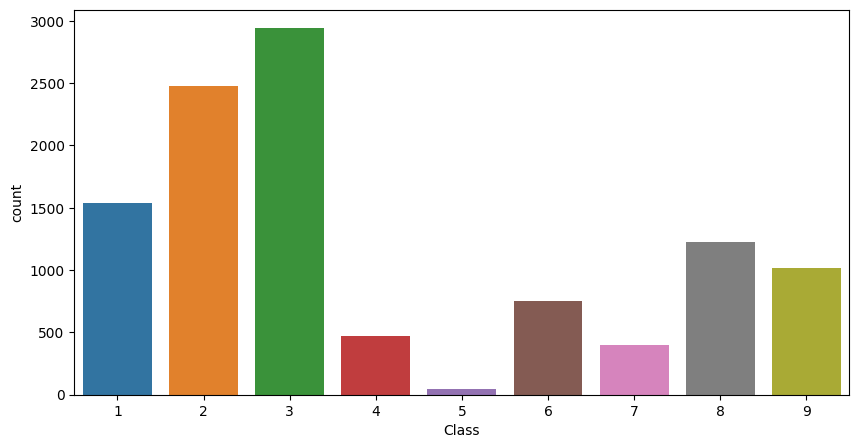

In [21]:
def plotDistribution(df):
    plt.close()
    plt.figure(figsize=(10, 5))
    sns.countplot(x="Class", data=df)
    plt.show()

plotDistribution(byte_df)

Percentage of 3 is: 27.07 %
Percentage of 2 is: 22.8 %
Percentage of 1 is: 14.18 %
Percentage of 8 is: 11.3 %
Percentage of 9 is: 9.32 %
Percentage of 6 is: 6.91 %
Percentage of 4 is: 4.37 %
Percentage of 7 is: 3.66 %
Percentage of 5 is: 0.39 %



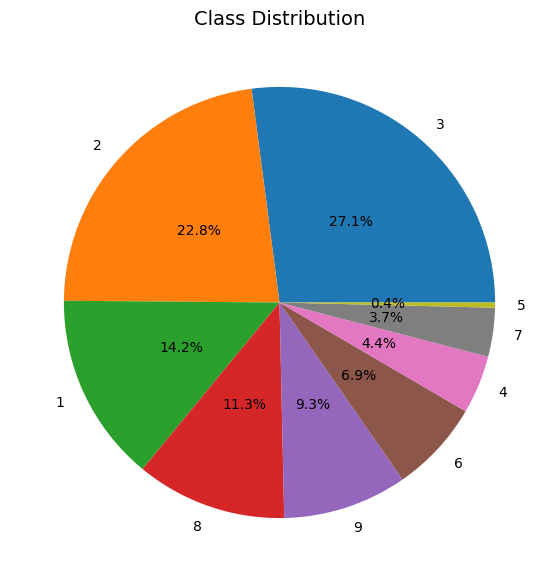

In [22]:
def plotDistribution(df):
  counts = df['Class'].value_counts().to_dict()
  labels = counts.keys()
  values = counts.values()
  labels = [k for k in counts.keys()]
  values   = [float(v) for v in counts.values()]
  for i in range(len(values)):
    print("Percentage of", labels[i], "is:", round(100 * values[i]/sum(values), 2),"%")
  print()

  plt.figure(figsize=(7,7))
  plt.pie(x = values, labels = labels, autopct="%.1f%%", pctdistance=0.5)
  plt.title("Class Distribution", fontsize=14)
  plt.show()

plotDistribution(byte_df)


#### Null Values check

In [23]:
print(byte_df.isnull().sum())

Id       0
00       0
01       0
02       0
03       0
        ..
fe       0
ff       0
??       0
size     0
Class    0
Length: 260, dtype: int64


In [24]:
byte_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10868 entries, 0 to 10867
Columns: 260 entries, Id to Class
dtypes: int64(259), object(1)
memory usage: 21.6+ MB


#### Heat map showing missing values

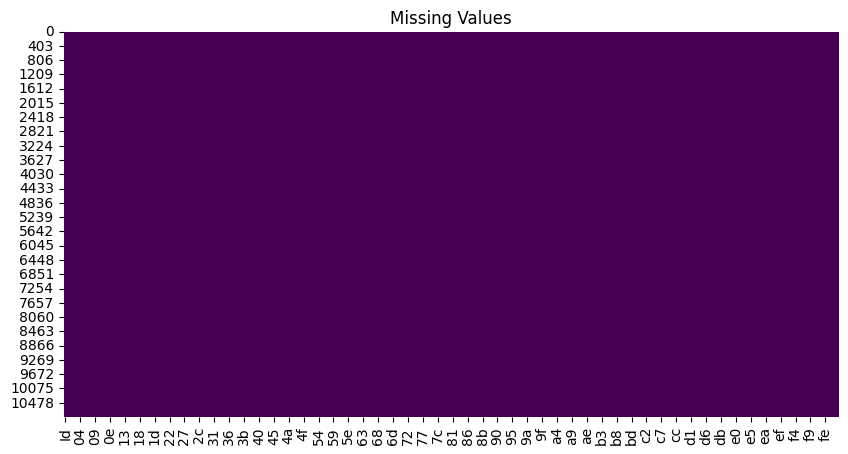

In [25]:
plt.figure(figsize=(10,5))
sns.heatmap(byte_df.isnull(),cbar=False,cmap='viridis')
plt.title("Missing Values")
plt.show()

#### Correlation Matrix

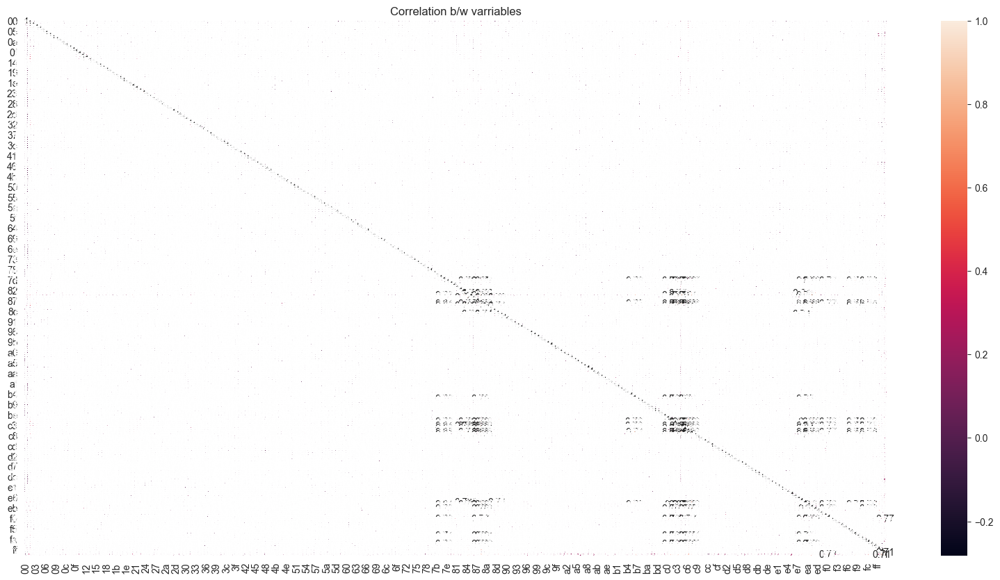

In [33]:
plt.figure(figsize=(20,10))
sns.heatmap(byte_df.iloc[:, :-1].corr(),cbar=True,annot=True)
plt.title("Correlation b/w varriables")
plt.show()

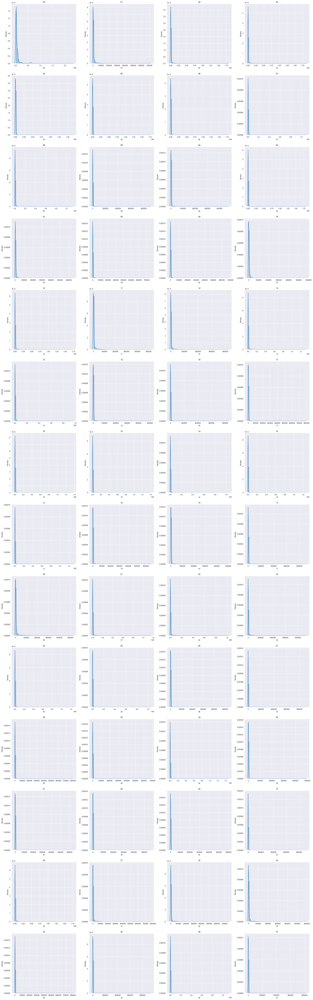

In [81]:
fig, axes = plt.subplots(nrows = 14, ncols = 4)    # axes is 2d array (3x3)
axes = axes.flatten()         # Convert axes to 1d array of length 9
fig.set_size_inches(30, 100)
pl_df = byte_df.drop(['Id', 'Class'], axis=1)
for ax, col in zip(axes, pl_df.columns):
  sns.distplot(pl_df[col], ax = ax)
  ax.set_title(col)

AxesSubplot(0.125,0.11;0.775x0.77)


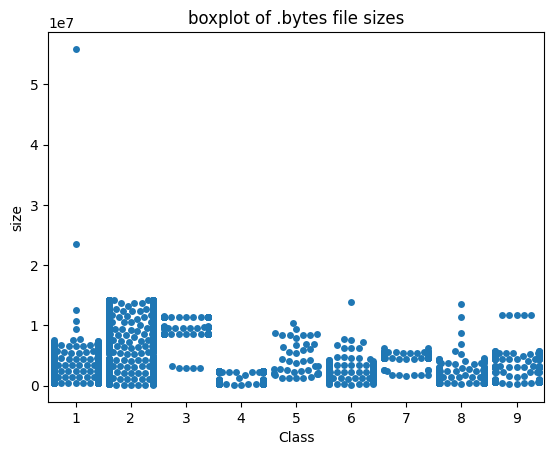

In [137]:
plt.close()
ax = sns.swarmplot(x="Class", y="size", data=byte_df)
plt.title("boxplot of .bytes file sizes")
plt.show()

Hence we can 

In [26]:
print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(byte_df, False, 'byte')

print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(byte_df, True, 'byte')

Original Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (10868, 258) (10868,)

Oversampled Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)


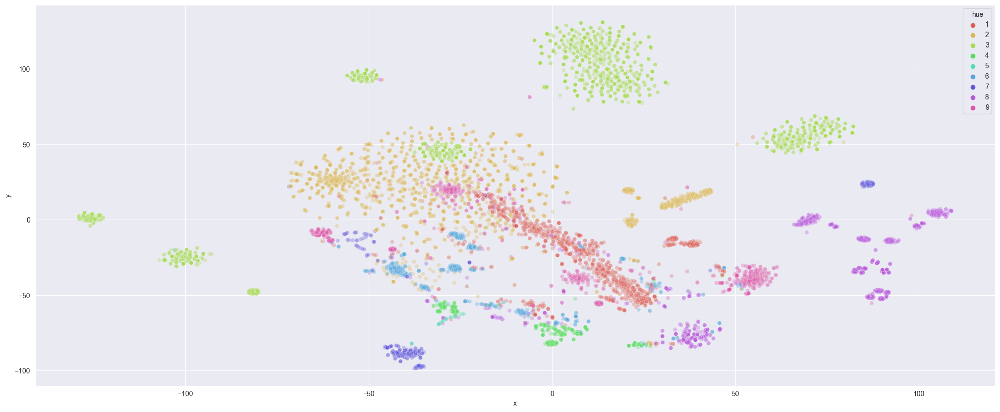

In [53]:
t_data = trainTsne(X_train)
plotTsne(y_train, t_data)

Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)


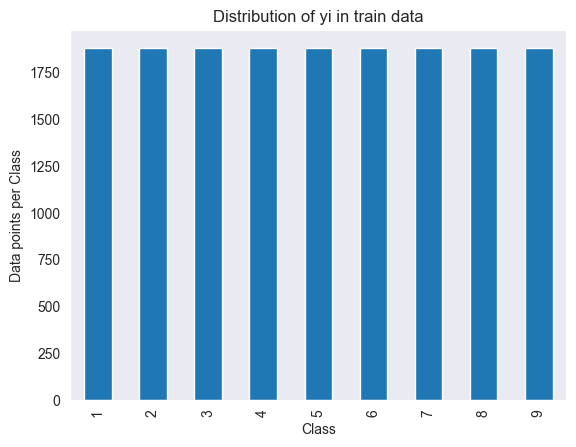

Number of data points in class 1 : 1883 ( 11.112 %)
Number of data points in class 2 : 1883 ( 11.112 %)
Number of data points in class 3 : 1883 ( 11.112 %)
Number of data points in class 4 : 1883 ( 11.112 %)
Number of data points in class 6 : 1883 ( 11.112 %)
Number of data points in class 8 : 1883 ( 11.112 %)
Number of data points in class 9 : 1883 ( 11.112 %)
Number of data points in class 5 : 1882 ( 11.107 %)
Number of data points in class 7 : 1882 ( 11.107 %)


In [52]:
oversampledDistribution(byte_df, 'byte')

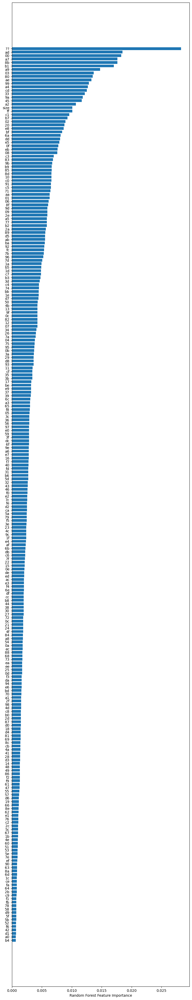

In [27]:
columns, importance =  getFeatureImportance(X_train, y_train)

### 3. Model Training

### 3.1: Logistic Regression

In [28]:
k_value = 5
c_values = [10 ** x for x in range(-4, 6)]

#### 3.1.1: K fold(Original Data)

In [35]:
print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(byte_df, False, 'byte')
print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(byte_df, True, 'byte')

Original Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (10868, 258) (10868,)

Oversampled Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)


5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.1553676065081386 , model losses: [1.182514853081714, 1.157468587639565, 1.161499713816269, 1.1415243252527476, 1.1338305527503971]
C= 0.001 , mean loss: 1.1583861658765524 , model losses: [1.180917989890937, 1.1165228888477028, 1.1964650467907665, 1.1287957877842483, 1.1692291160691075]
C= 0.01 , mean loss: 1.155985217419443 , model losses: [1.208513741307827, 1.1354890101766668, 1.189495097984871, 1.1367094252898973, 1.109718812337952]
C= 0.1 , mean loss: 1.155692377302683 , model losses: [1.1513624971430592, 1.1507249653913714, 1.128122569700556, 1.1731471867732284, 1.1751046675052]
C= 1 , mean loss: 1.155044484769771 , model losses: [1.1038355422234924, 1.1901376172083815, 1.1698614503433027, 1.1365526054777784, 1.1748352085958997]
C= 10 , mean loss: 1.150448650749842 , model losses: [1.1357053072179002, 1.1508563840995214, 1.1828287141088916, 1.1506580385530283, 1.1321948097698677]
C= 100 , mean loss: 1.1541022904133051 , 

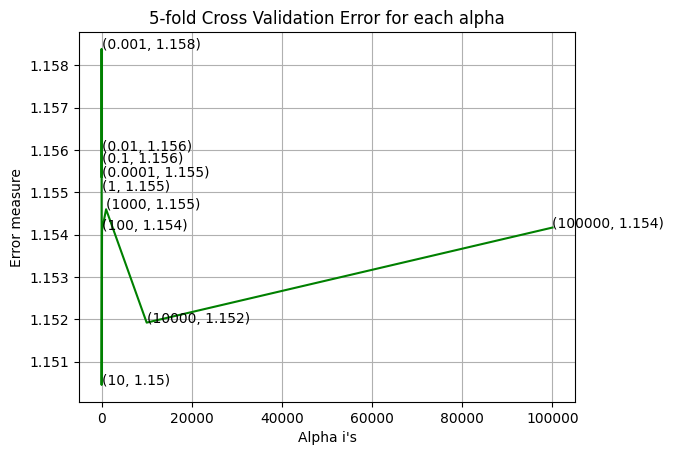

CPU times: total: 1min 47s
Wall time: 59.5 s


In [30]:
%%time
best_c = logisticRegressionKfold(k_value, c_values, X_train, y_train)

log loss for train data 1.145229859012708
log loss for Cross Validation data 1.1565159672648189
log loss for test data 1.1509323719204252
Number of misclassified points  40.89236430542778
Accuracy = 0.5910763569457221
Precision = [0.27681661 0.77169811 0.90030675 0.         0.         0.
 0.88888889 0.         0.39805825]
Recall = [0.77922078 0.82459677 0.99829932 0.         0.         0.
 0.1        0.         0.20197044]
F1 = [0.40851064 0.79727096 0.94677419 0.         0.         0.
 0.17977528 0.         0.26797386]
-------------------------------------------------- Confusion matrix --------------------------------------------------


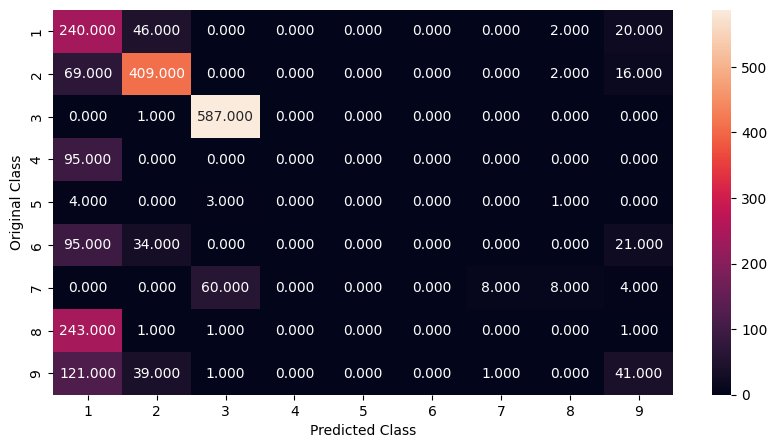

-------------------------------------------------- Precision matrix --------------------------------------------------


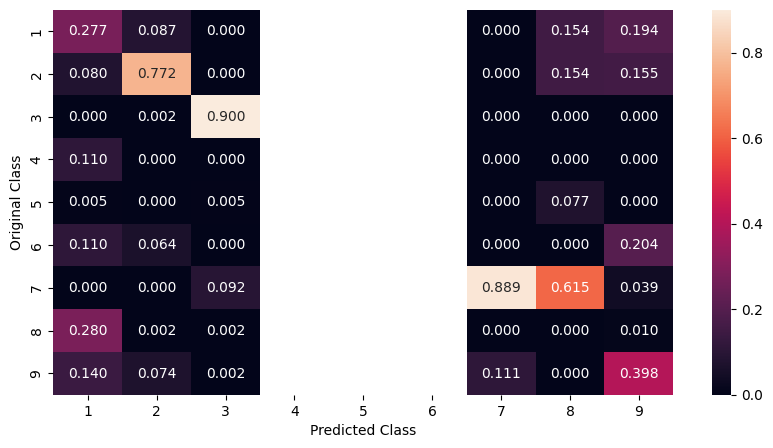

Sum of columns in precision matrix [ 1.  1.  1. nan nan nan  1.  1.  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


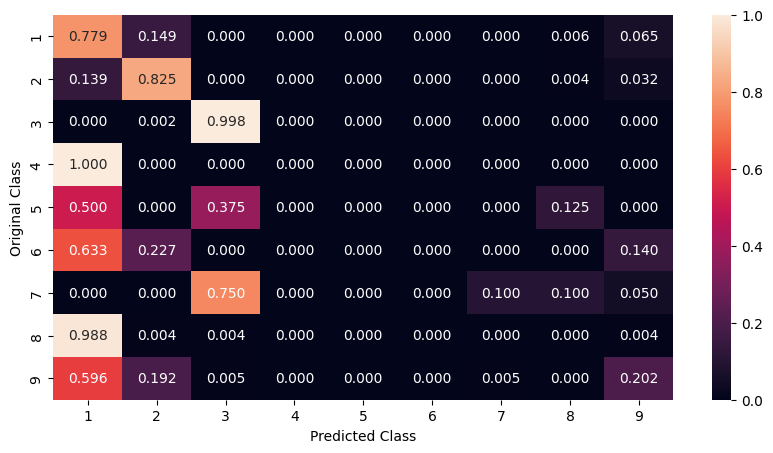

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
CPU times: total: 3.95 s
Wall time: 2.18 s


In [31]:
%%time

lr=LR(penalty='l2',C=c_values[best_c],class_weight='balanced')
lr.fit(X_train,y_train)

finalResults(lr, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.1.2: K fold (Oversampled Data)

In [32]:
print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(byte_df, True, 'byte')


Oversampled Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)


5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.582332981026744 , model losses: [1.5777127514405012, 1.584431651724701, 1.5672263611115849, 1.594843997187708, 1.5874501436692243]
C= 0.001 , mean loss: 1.582807832779895 , model losses: [1.5766039747967318, 1.5856211979779304, 1.5724801810926632, 1.5960100762651106, 1.5833237337670385]
C= 0.01 , mean loss: 1.5838249754563962 , model losses: [1.5860619215391616, 1.579212774446338, 1.6095782744635496, 1.5926593828949087, 1.5516125239380232]
C= 0.1 , mean loss: 1.5763026552803203 , model losses: [1.5813171085892288, 1.5632432801839637, 1.6149372265124677, 1.5649519621839982, 1.5570636989319437]
C= 1 , mean loss: 1.583070351425325 , model losses: [1.5772019122564194, 1.5812827945432637, 1.6071820447215097, 1.5734085694464977, 1.5762764361589348]
C= 10 , mean loss: 1.5795364653774158 , model losses: [1.5807316205828523, 1.5875021977702177, 1.5768614356022796, 1.5726577339772756, 1.5799293389544526]
C= 100 , mean loss: 1.5860814069

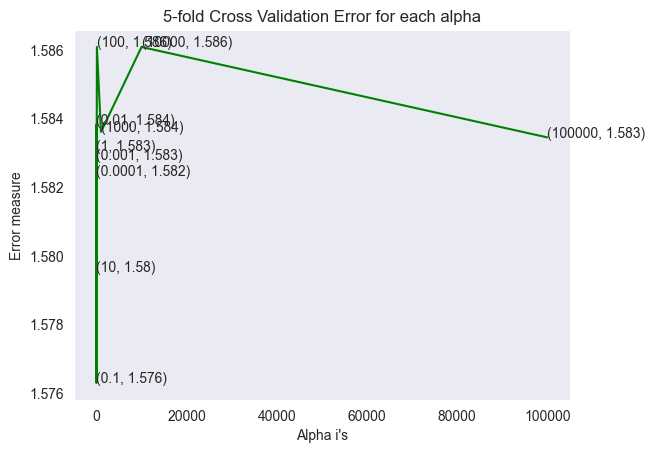

In [50]:
best_c = logisticRegressionKfold(k_value, c_values, oX_train, oy_train)

In [54]:
lr=LR(penalty='l2',C=c_values[best_c],class_weight='balanced')
lr.fit(X_train,y_train)

LogisticRegression(C=0.1, class_weight='balanced')

log loss for train data 1.5815315222943351
log loss for Cross Validation data 1.5739421275578667
log loss for test data 1.5734360853514626
Number of misclassified points  57.590634441087616
Accuracy = 0.4240936555891239
Precision = [0.1715755  0.67781155 0.81666667 0.01388889 0.86904762 0.06220096
 0.78812199 0.03092784 0.38040346]
Recall = [0.62308998 0.75721562 0.99830221 0.00170068 0.12414966 0.02210884
 0.83503401 0.00509338 0.44897959]
F1 = [0.26906158 0.71531676 0.89839572 0.0030303  0.2172619  0.03262233
 0.81090008 0.00874636 0.41185647]
-------------------------------------------------- Confusion matrix --------------------------------------------------


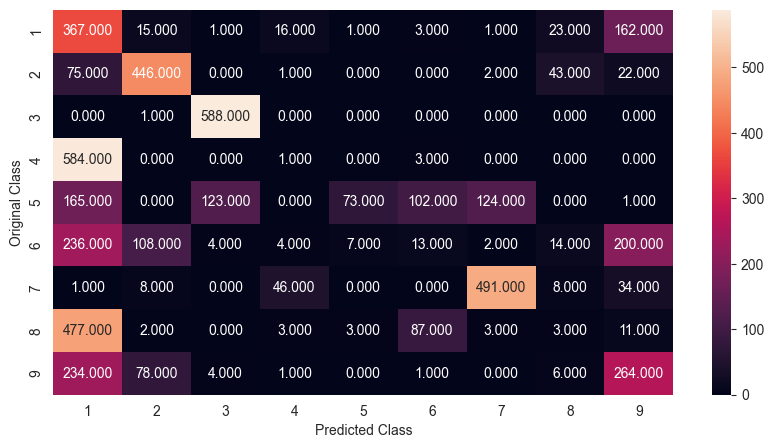

-------------------------------------------------- Precision matrix --------------------------------------------------


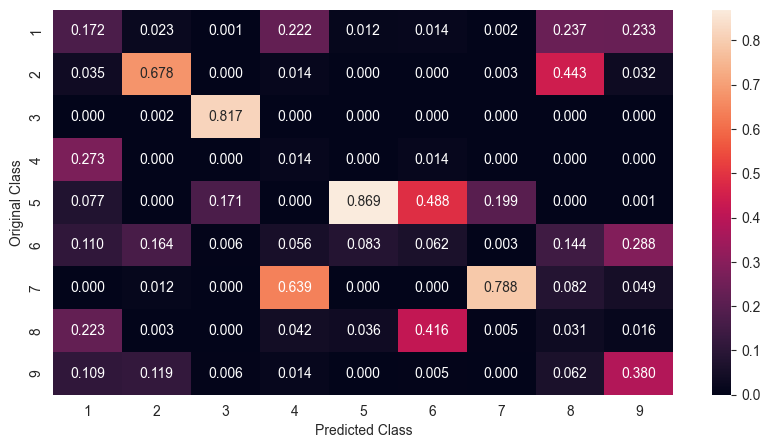

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


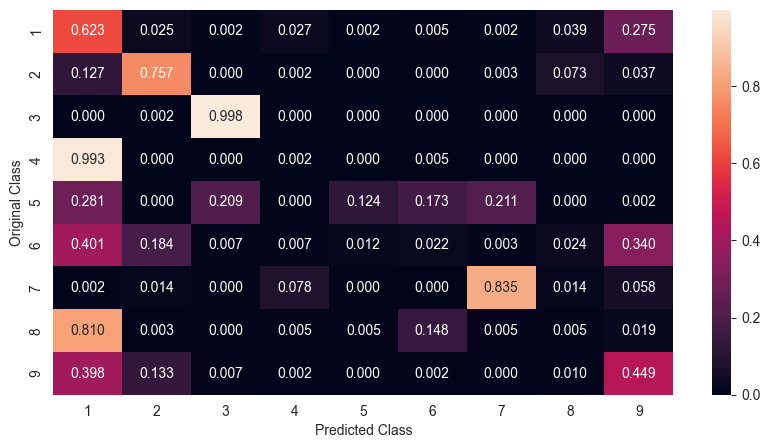

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [55]:
finalResults(lr, k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

log loss for train data 1.5815315222943351
log loss for Cross Validation data 1.5739421275578667
log loss for test data 1.3956778438995794
Number of misclassified points  39.19043238270469
Accuracy = 0.6080956761729531
Precision = [0.28028169 0.85135135 0.99491525 0.         0.5        0.06666667
 0.92       0.01639344 0.35294118]
Recall = [0.6461039  0.76209677 0.99829932 0.         0.125      0.02
 0.8625     0.00406504 0.4137931 ]
F1 = [0.39096267 0.80425532 0.99660441 0.         0.2        0.03076923
 0.89032258 0.00651466 0.38095238]
-------------------------------------------------- Confusion matrix --------------------------------------------------


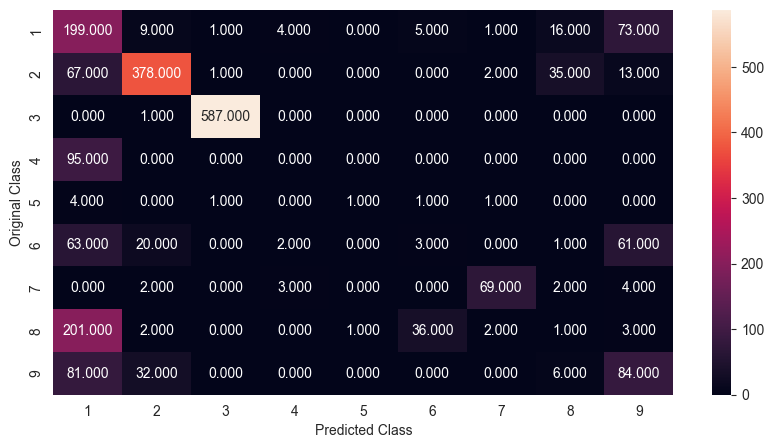

-------------------------------------------------- Precision matrix --------------------------------------------------


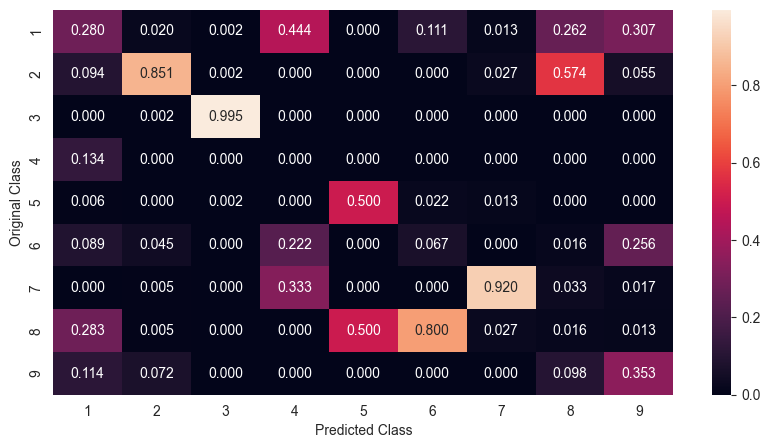

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


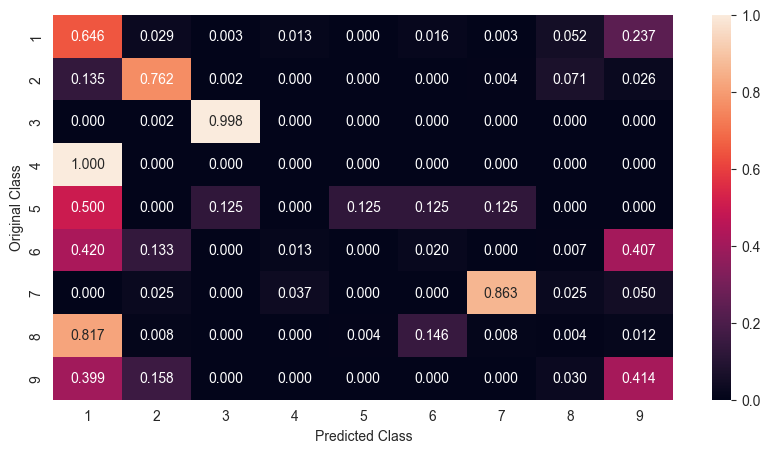

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [56]:
finalResults(lr, k_value, oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

#### 3.1.3: Random Search CV(Original Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'penalty': 'l2', 'C': 0.01}
log loss for train data 1.1504583172001663
log loss for Cross Validation data 1.148249312574673
log loss for test data 1.1694575653130006
Number of misclassified points  41.03035878564857
Accuracy = 0.5896964121435143
Precision = [0.28555431 0.75830258 0.88804841 0.         0.         0.
 0.         0.         0.44615385]
Recall = [0.82792208 0.82862903 0.99829932 0.         0.         0.
 0.         0.         0.14285714]
F1 = [0.42464613 0.79190751 0.93995196 0.         0.         0.
 0.         0.         0.21641791]
-------------------------------------------------- Confusion matrix --------------------------------------------------


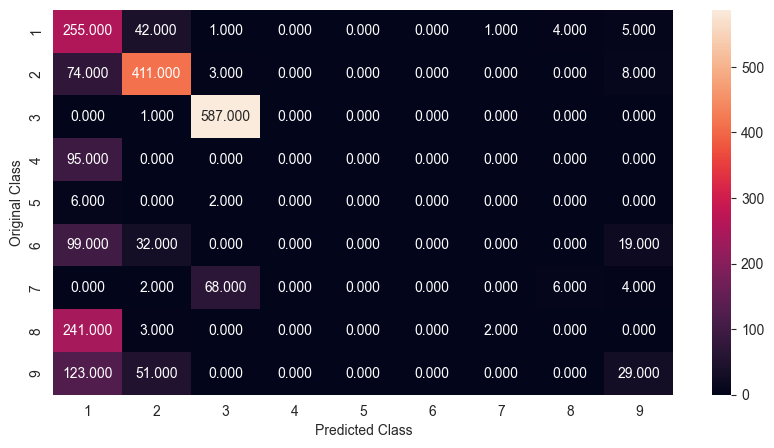

-------------------------------------------------- Precision matrix --------------------------------------------------


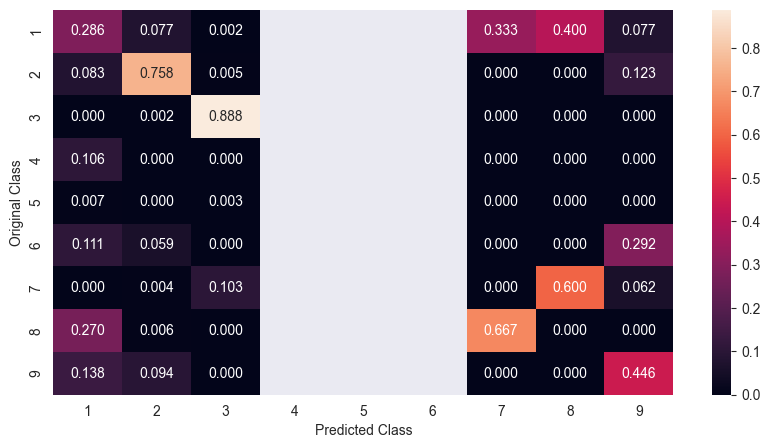

Sum of columns in precision matrix [ 1.  1.  1. nan nan nan  1.  1.  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


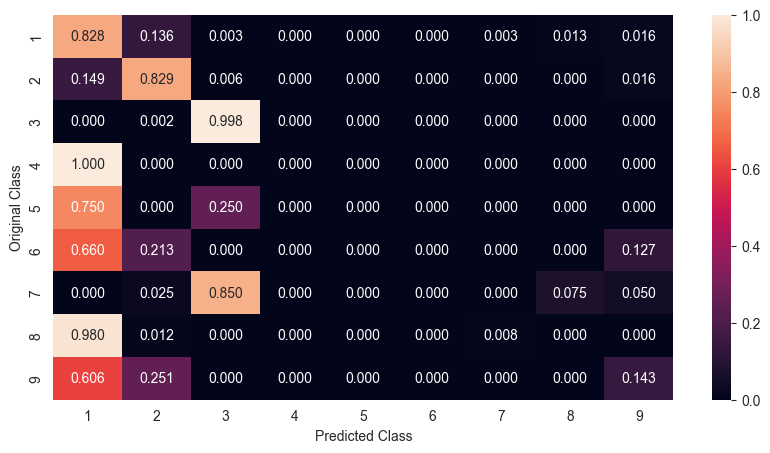

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [68]:
logisticRegressionRandom(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.1.4: Random Search CV(Oversampled Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'penalty': 'l2', 'C': 0.0001}
log loss for train data 1.5779953340946535
log loss for Cross Validation data 1.5703582023391052
log loss for test data 1.3901488148354775
Number of misclassified points  41.39834406623735
Accuracy = 0.5860165593376265
Precision = [0.28748068 0.85135135 0.99491525 0.         0.5        0.03921569
 0.92       0.03703704 0.24365482]
Recall = [0.6038961  0.76209677 0.99829932 0.         0.125      0.01333333
 0.8625     0.01219512 0.2364532 ]
F1 = [0.3895288  0.80425532 0.99660441 0.         0.2        0.0199005
 0.89032258 0.01834862 0.24      ]
-------------------------------------------------- Confusion matrix --------------------------------------------------


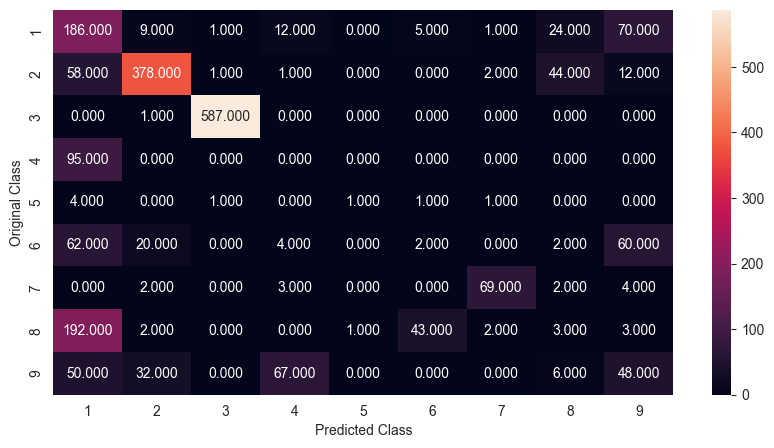

-------------------------------------------------- Precision matrix --------------------------------------------------


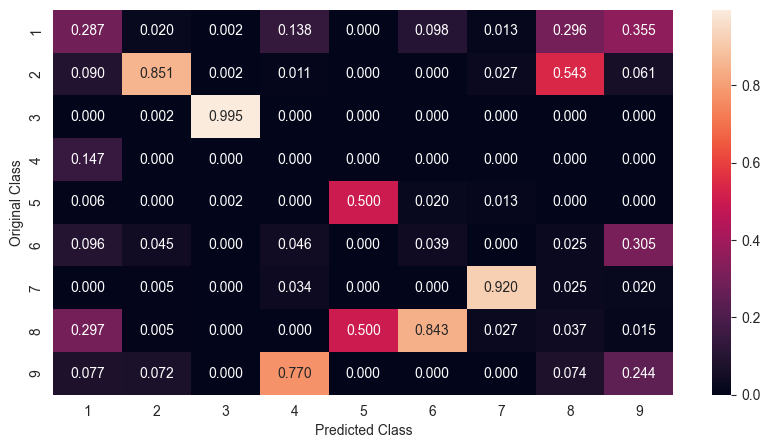

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


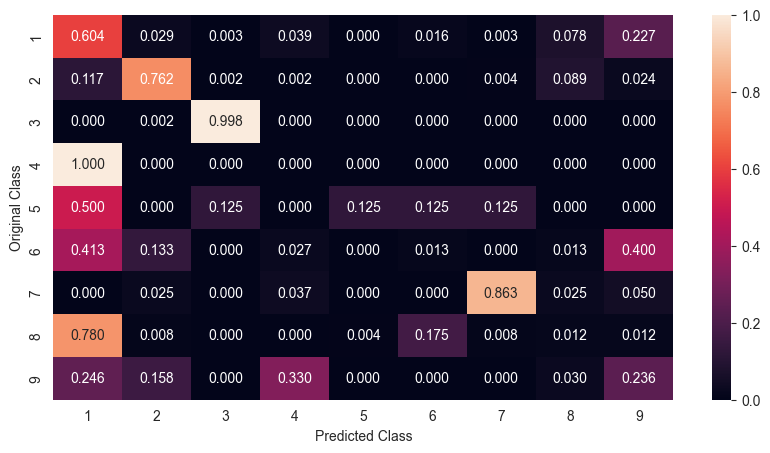

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [70]:
logisticRegressionRandom(k_value, oX_train, oy_train,  oX_cv, oy_cv, X_test, y_test)

#### 3.1.5: Grid Search CV(Original Data)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'C': 0.1, 'penalty': 'l2'}
log loss for train data 1.1484196643127726
log loss for Cross Validation data 1.1634127020344243
log loss for test data 1.161672181152005
Number of misclassified points  39.926402943882245
Accuracy = 0.6007359705611776
Precision = [0.28688525 0.76163873 0.91446345 0.         0.         0.
 1.         0.         0.3963964 ]
Recall = [0.79545455 0.82459677 1.         0.         0.         0.
 0.25       0.         0.21674877]
F1 = [0.42168675 0.79186834 0.95532088 0.         0.         0.
 0.4        0.         0.28025478]
-------------------------------------------------- Confusion matrix --------------------------------------------------


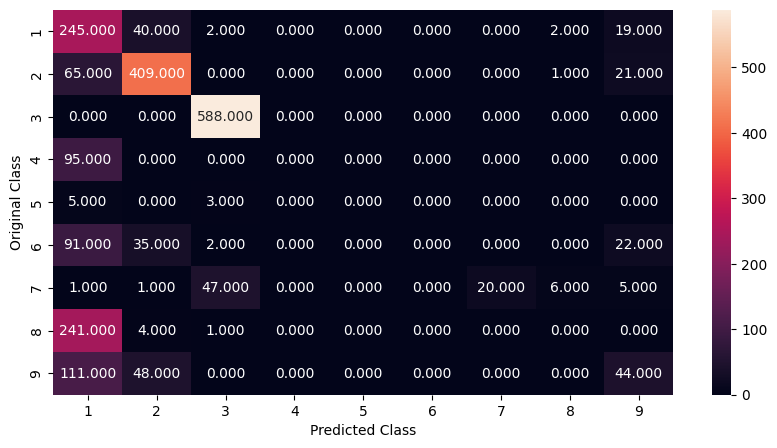

-------------------------------------------------- Precision matrix --------------------------------------------------


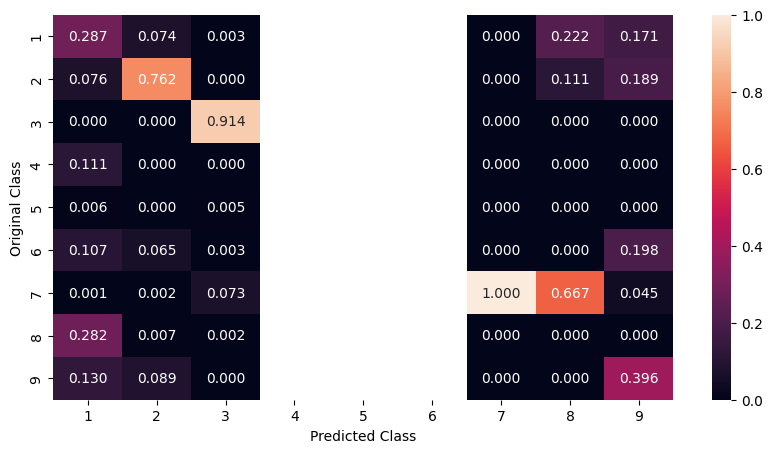

Sum of columns in precision matrix [ 1.  1.  1. nan nan nan  1.  1.  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


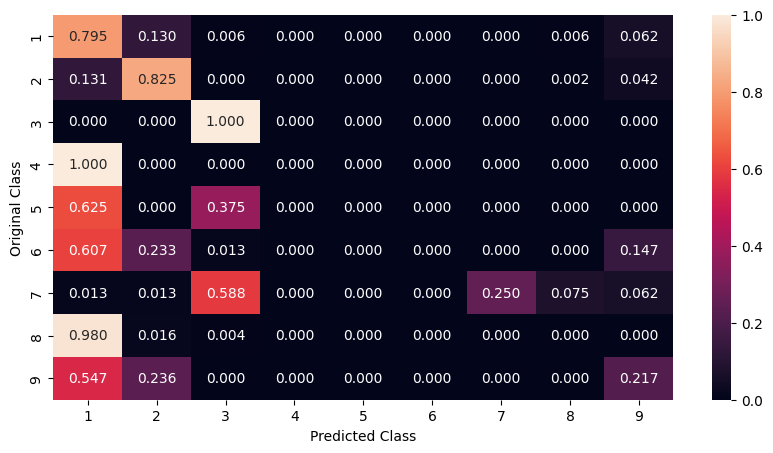

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [37]:
logisticRegressionGrid(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.1.6: Grid Search CV(Oversampled Data)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'C': 0.01, 'penalty': 'l2'}
log loss for train data 1.5722715452062974
log loss for Cross Validation data 1.5629163522811844
log loss for test data 1.4004893244929328
Number of misclassified points  48.114075436982525
Accuracy = 0.5188592456301748
Precision = [0.33333333 0.83146067 0.9915683  0.         0.14285714 0.0634715
 0.94444444 0.03921569 0.22072072]
Recall = [0.00324675 0.74596774 1.         0.         0.125      0.32666667
 0.85       0.00813008 0.24137931]
F1 = [0.00643087 0.78639745 0.9957663  0.         0.13333333 0.10629067
 0.89473684 0.01346801 0.23058824]
-------------------------------------------------- Confusion matrix --------------------------------------------------


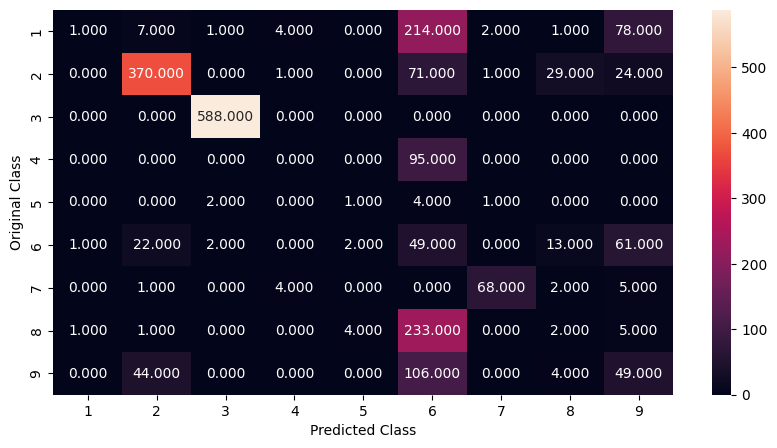

-------------------------------------------------- Precision matrix --------------------------------------------------


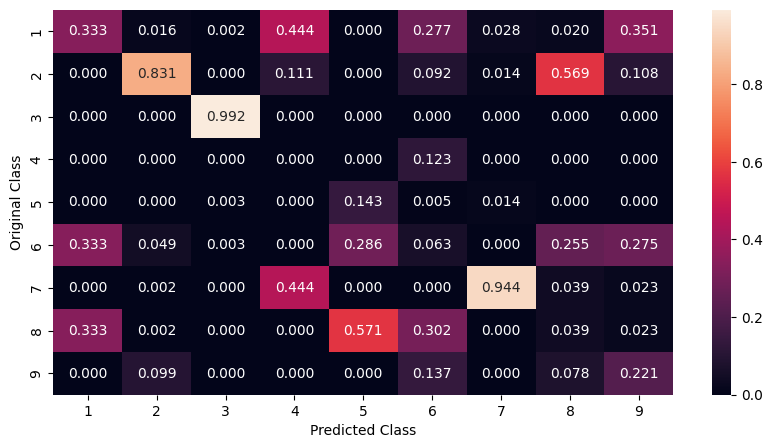

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


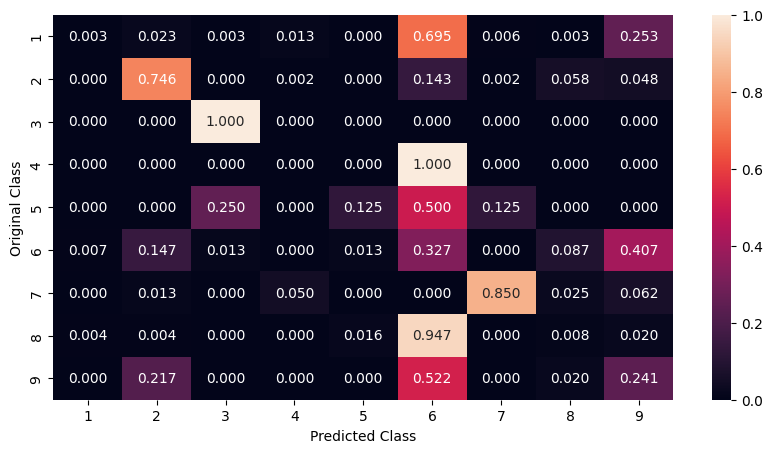

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [38]:
logisticRegressionGrid(k_value, oX_train, oy_train,  oX_cv, oy_cv, X_test, y_test)

### 3.2: Random Forest Classifier

In [39]:
k_value = 5
estimators = [10,50,100,500,1000,2000,3000]

#### 3.2.1: K fold(Original Data)

5-fold Cross Validation Log losses
n_estimator= 10 , mean loss: 0.10738502949495224 , model losses: [0.10617474216312939, 0.10095675032310937, 0.10556422569492036, 0.11741030599440519, 0.10681912329919689]
n_estimator= 50 , mean loss: 0.09398873933289392 , model losses: [0.07905594530303406, 0.10958609400908098, 0.10170254260697463, 0.09513139942954123, 0.08446771531583867]
n_estimator= 100 , mean loss: 0.09238230628904273 , model losses: [0.08455333650845341, 0.10421892440215073, 0.09069596785464085, 0.08688926465357333, 0.09555403802639534]
n_estimator= 500 , mean loss: 0.09228166262190876 , model losses: [0.07434219132879105, 0.10192689420559348, 0.08430045069251392, 0.1181604728433852, 0.08267830403926017]
n_estimator= 1000 , mean loss: 0.09326357661460413 , model losses: [0.08840193682302981, 0.0896660393746997, 0.08717315496039234, 0.09245207156256957, 0.10862468035232928]
n_estimator= 2000 , mean loss: 0.09345356018371179 , model losses: [0.09035185540847507, 0.10421365222725563

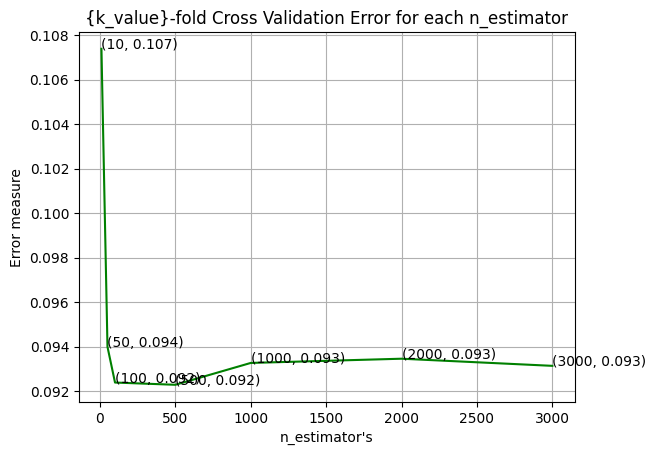

In [40]:
best_est = randomForestKfold(k_value, estimators, X_train, y_train)

log loss for train data 0.026087052825281787
log loss for Cross Validation data 0.07377295002568769
log loss for test data 0.06781629964183858
Number of misclassified points  1.517939282428703
Accuracy = 0.984820607175713
Precision = [0.97106109 0.99596774 1.         0.97916667 0.875      0.93548387
 1.         0.9748954  0.98522167]
Recall = [0.98051948 0.99596774 1.         0.98947368 0.875      0.96666667
 0.975      0.94715447 0.98522167]
F1 = [0.97576737 0.99596774 1.         0.98429319 0.875      0.95081967
 0.98734177 0.96082474 0.98522167]
-------------------------------------------------- Confusion matrix --------------------------------------------------


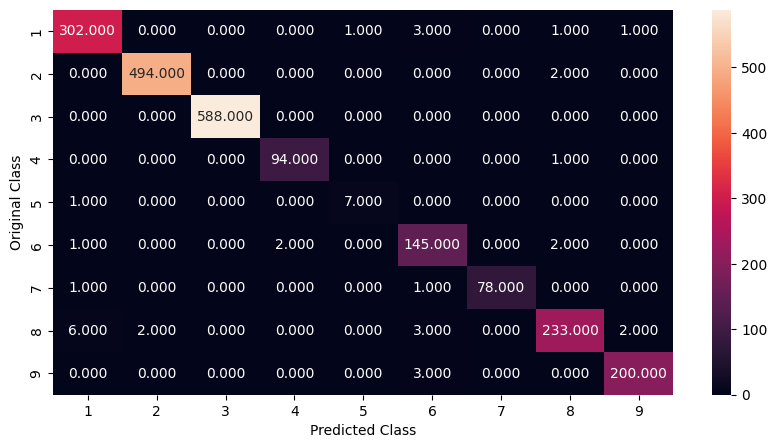

-------------------------------------------------- Precision matrix --------------------------------------------------


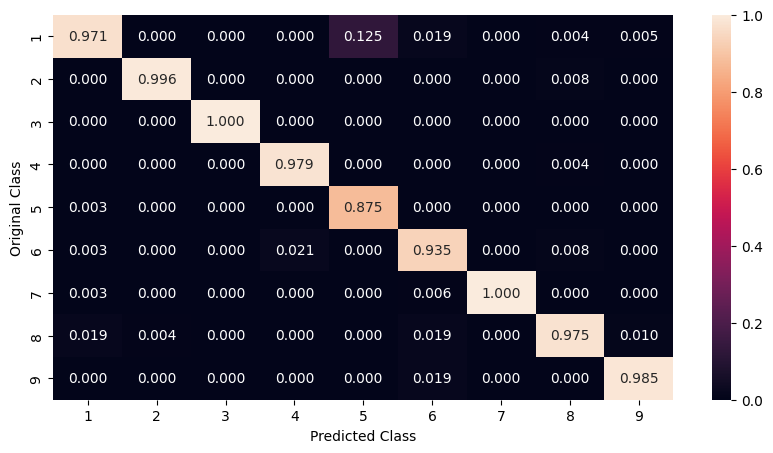

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


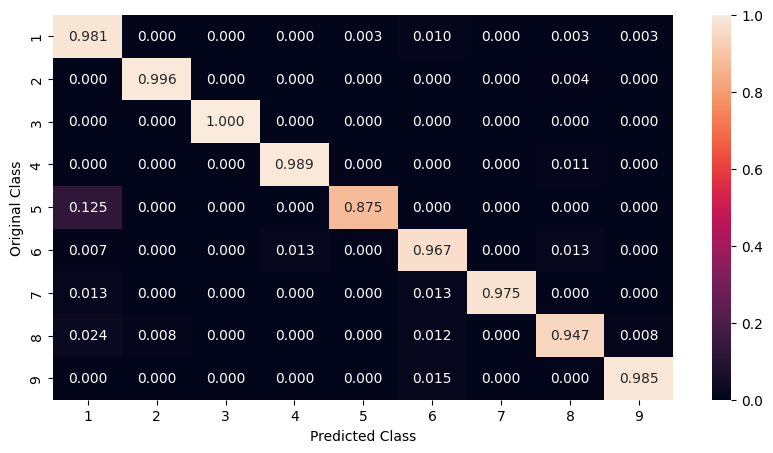

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
CPU times: total: 45.3 s
Wall time: 23.9 s


In [41]:
%%time

rf = RandomForestClassifier(n_estimators=estimators[best_est], n_jobs=-1, bootstrap=True)
rf.fit(X_train, y_train)

finalResults(rf, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.2: K fold (Oversampled Data)


Oversampled Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)
5-fold Cross Validation Log losses
n_estimator= 10 , mean loss: 0.050507135538706296 , model losses: [0.04816079535657867, 0.05559254019001377, 0.044107708502690114, 0.055532708020388726, 0.04914192562386021]
n_estimator= 50 , mean loss: 0.04214821171932289 , model losses: [0.04367954152656163, 0.04875457547855254, 0.041005263576792184, 0.03551351768184627, 0.041788160332861826]
n_estimator= 100 , mean loss: 0.04251642413190449 , model losses: [0.04760061940856565, 0.05117837855502688, 0.04018124756385584, 0.037095231827891935, 0.03652664330418215]
n_estimator= 500 , mean loss: 0.04309302717795272 , model losses: [0.03871039655566171, 0.04991415473576399, 0.037684375352481786, 0.04721238042383389, 0.04194382882202225]
n_estimator= 1000 , mean loss: 0.0422094919466517 , model losses: [0.03678938951849231, 0.039186521586644166, 0.03557935058855153, 0.05052008350196285, 0.048972114

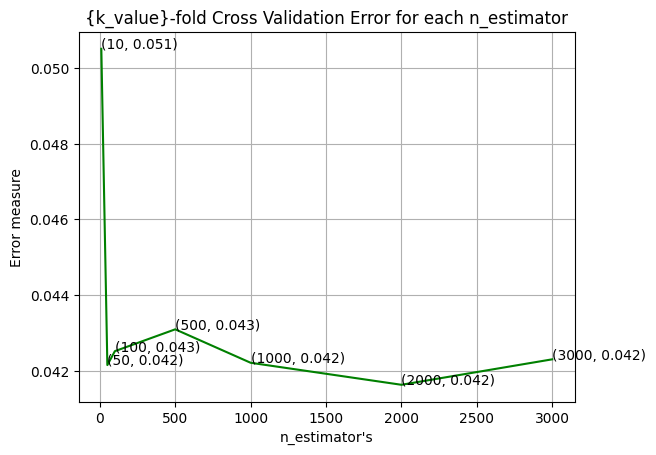

In [46]:

print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(byte_df, True, 'byte')
best_est = randomForestKfold(k_value, estimators, oX_train, oy_train)

In [47]:
rf = RandomForestClassifier(n_estimators=estimators[best_est], n_jobs=-1, bootstrap=True)
rf.fit(oX_train, oy_train)

RandomForestClassifier(n_estimators=2000, n_jobs=-1)

log loss for train data 0.011431082215484348
log loss for Cross Validation data 0.04061459683299308
log loss for test data 0.019650143189767995
Number of misclassified points  0.22999080036798528
Accuracy = 0.9977000919963201
Precision = [1.         0.99798793 1.         1.         0.88888889 0.98684211
 1.         0.99591837 1.        ]
Recall = [0.99350649 1.         1.         0.98947368 1.         1.
 1.         0.99186992 1.        ]
F1 = [0.99674267 0.99899295 1.         0.99470899 0.94117647 0.99337748
 1.         0.99389002 1.        ]
-------------------------------------------------- Confusion matrix --------------------------------------------------


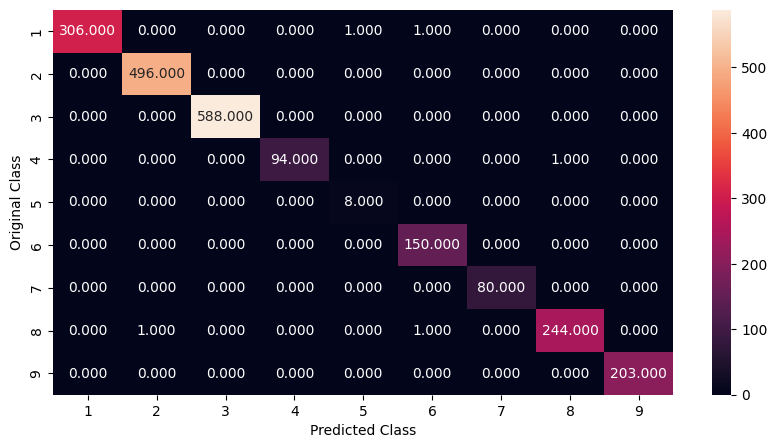

-------------------------------------------------- Precision matrix --------------------------------------------------


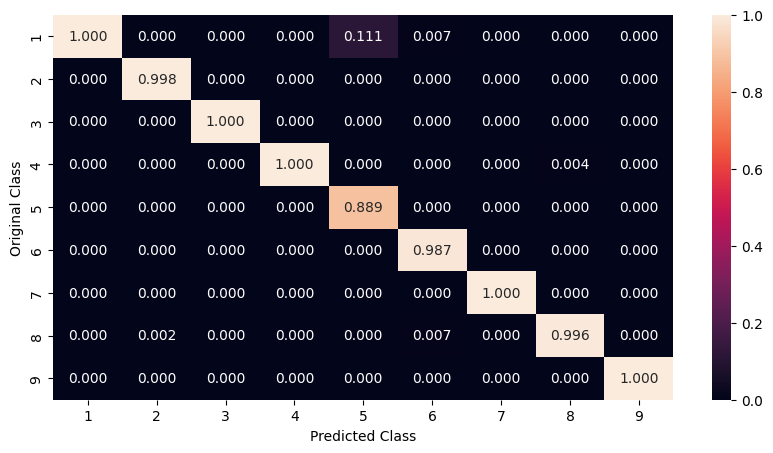

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


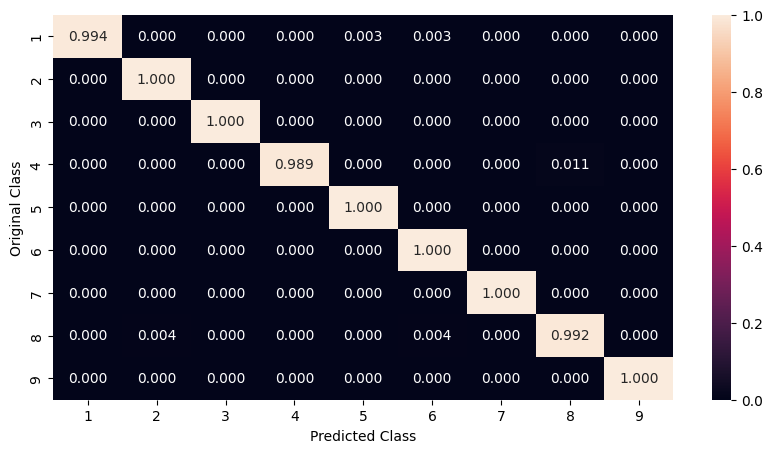

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [48]:
finalResults(rf, k_value, oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

#### 3.2.3: Random Search CV(Original Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 500, 'max_depth': 10, 'criterion': 'entropy'}

log loss for train data 0.02928019321654863
log loss for Cross Validation data 0.07898942171334906
log loss for test data 0.07328245958618486
Number of misclassified points  1.5639374425023
Accuracy = 0.984360625574977
Precision = [0.96202532 0.99597586 1.         0.97894737 0.77777778 0.92948718
 1.         0.98712446 0.99009901]
Recall = [0.98701299 0.99798387 1.         0.97894737 0.875      0.96666667
 0.975      0.93495935 0.98522167]
F1 = [0.97435897 0.99697885 1.         0.97894737 0.82352941 0.94771242
 0.98734177 0.96033403 0.98765432]
-------------------------------------------------- Confusion matrix --------------------------------------------------


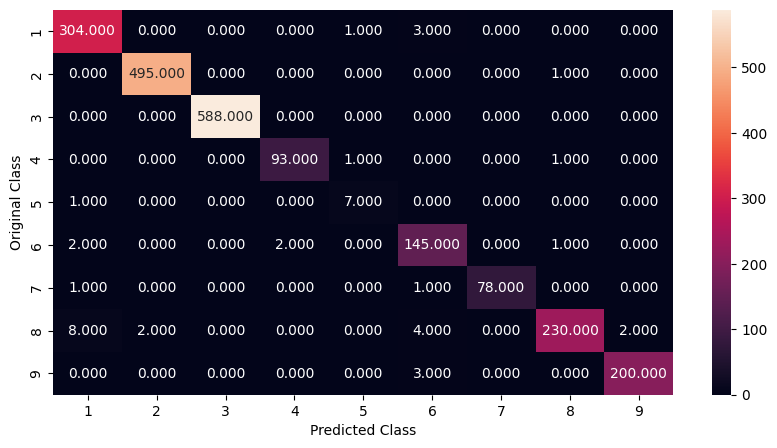

-------------------------------------------------- Precision matrix --------------------------------------------------


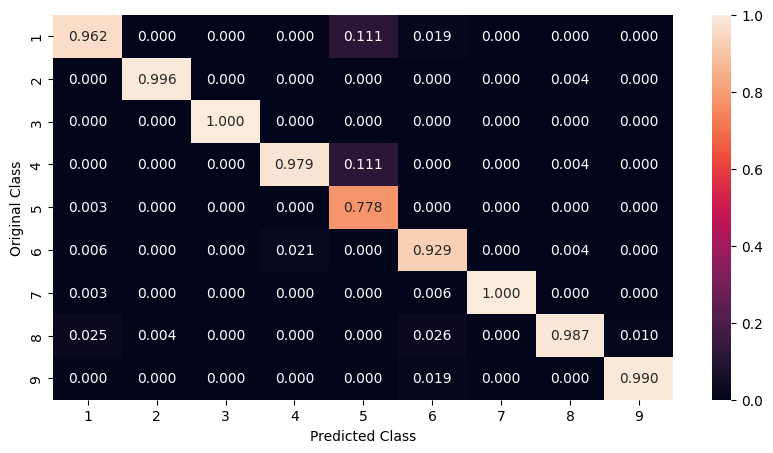

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


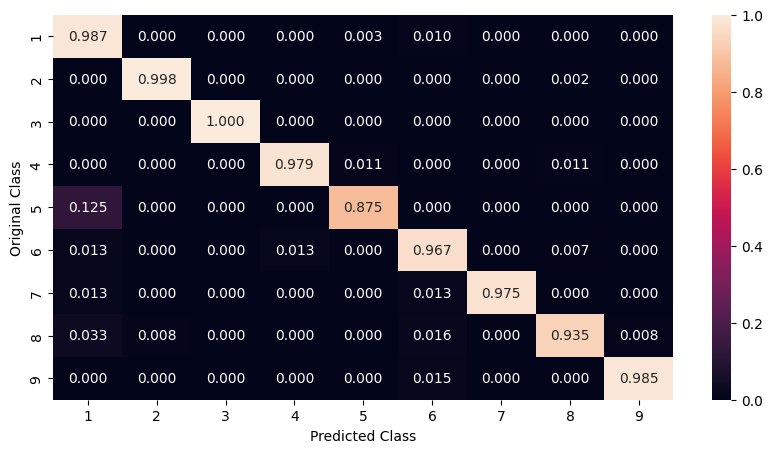

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [50]:
randomForestRandomCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.4: Random Search CV(Oversampled Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 100, 'max_depth': 10, 'criterion': 'log_loss'}

log loss for train data 0.017818316367707306
log loss for Cross Validation data 0.050484218173313035
log loss for test data 0.02754264417979964
Number of misclassified points  0.5519779208831647
Accuracy = 0.9944802207911684
Precision = [0.99348534 0.9979798  1.         1.         0.88888889 0.96753247
 1.         0.9877551  1.        ]
Recall = [0.99025974 0.99596774 1.         0.98947368 1.         0.99333333
 0.9875     0.98373984 1.        ]
F1 = [0.99186992 0.99697275 1.         0.99470899 0.94117647 0.98026316
 0.99371069 0.98574338 1.        ]
-------------------------------------------------- Confusion matrix --------------------------------------------------


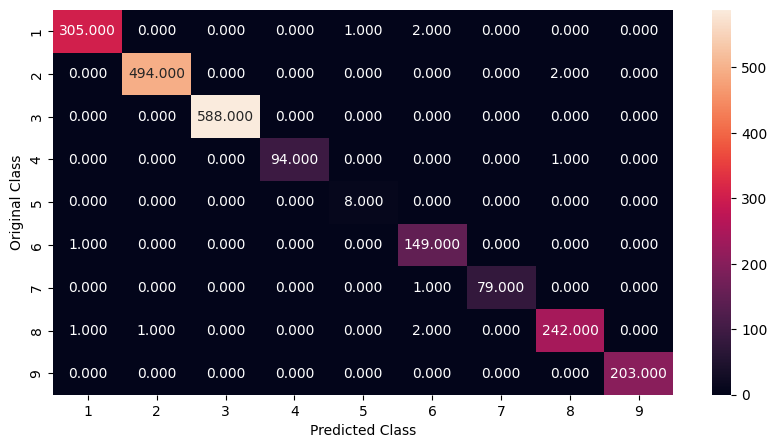

-------------------------------------------------- Precision matrix --------------------------------------------------


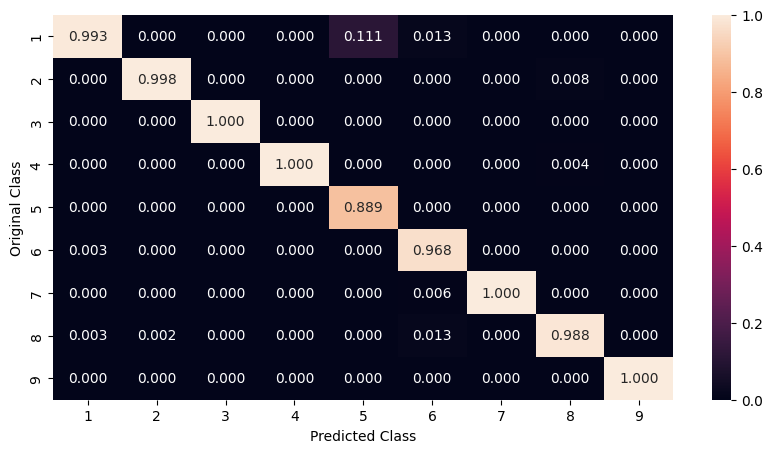

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


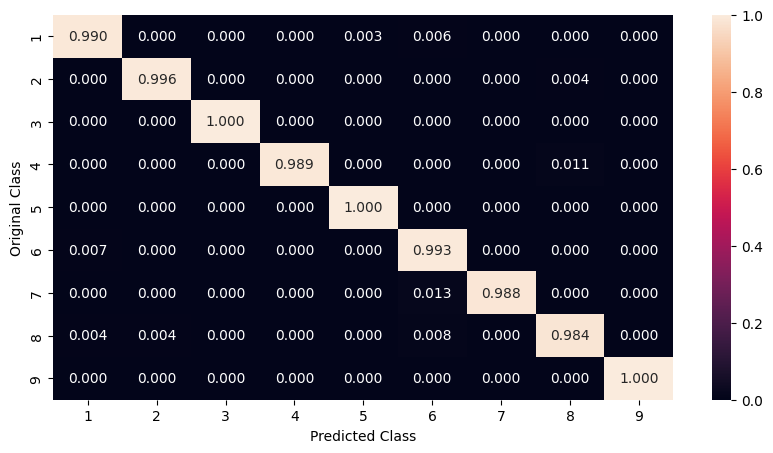

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [51]:
randomForestRandomCV(k_value,  oX_train, oy_train,  oX_cv, oy_cv,  X_test, y_test)

All of the models are showing high variance,  to reduce variance we have done feature selection using random forest itself as follows.

#### Random Forest classifier training over selected features

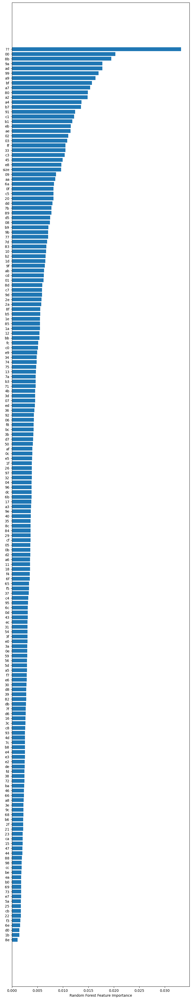

In [80]:
columns, importance =  getFeatureImportance(X_train, y_train)

#### 3.2.t: trimming out  important to reduce the model complexity and variance

In [141]:
print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(byte_df, False, 'byte')
print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(byte_df, True, 'byte')


for i in range(len(importance)):
    if  importance[i] > 1.6*1e-3:
        index = i
        break
print(index)

to_drop = columns[0:index]

X_train = X_train.drop(columns=to_drop)
oX_train = oX_train.drop(columns=to_drop)
X_test = X_test.drop(columns=to_drop)
oX_test = oX_test.drop(columns=to_drop)
X_cv = X_cv.drop(columns=to_drop)
oX_cv = oX_cv.drop(columns=to_drop)

print("size of X_train:", X_train.shape, oX_train.shape)
print("size of X_test:", X_test.shape, oX_test.shape)
print("size of X_cv:", X_cv.shape, oX_cv.shape)

Original Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (10868, 258) (10868,)

Oversampled Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)
4
size of X_train: (6955, 254) (16945, 254)
size of X_test: (2174, 254) (5296, 254)
size of X_cv: (1739, 254) (4237, 254)


#### 3.2.t.1: K-fold(original trimmed data)

5-fold Cross Validation Log losses
n_estimator= 10 , mean loss: 0.10856560612045518 , model losses: [0.12120157219848973, 0.11706330504843566, 0.11442441941537142, 0.08885761871072619, 0.10128111522925291]
n_estimator= 50 , mean loss: 0.09658327344028139 , model losses: [0.11105411191081772, 0.07922772961708426, 0.08633105706220112, 0.09433586847004266, 0.1119676001412612]
n_estimator= 100 , mean loss: 0.09558402428646477 , model losses: [0.08849057180429833, 0.10771233421406805, 0.08542502633772252, 0.0828359230033517, 0.1134562660728833]
n_estimator= 500 , mean loss: 0.09222989266768887 , model losses: [0.0898701207458188, 0.09075435748053787, 0.1034859116052398, 0.09658670036209949, 0.08045237314474842]
n_estimator= 1000 , mean loss: 0.09324073526419183 , model losses: [0.09369028400868487, 0.09301233788310662, 0.09970552464136717, 0.09116268029745304, 0.08863284949034743]
n_estimator= 2000 , mean loss: 0.09067398619827574 , model losses: [0.08176711401408308, 0.0781045883073717, 0.

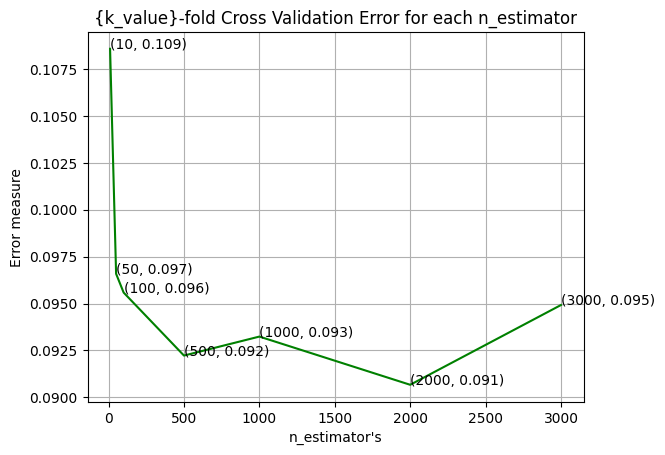

In [82]:
best_est = randomForestKfold(k_value, estimators, X_train, y_train)

log loss for train data 0.026637409277313173
log loss for Cross Validation data 0.06417360952454462
log loss for test data 0.07802848256125294
Number of misclassified points  1.7479300827966882
Accuracy = 0.9825206991720331
Precision = [0.95015576 0.9959596  0.99830221 0.95918367 1.         0.95945946
 1.         0.96666667 0.99487179]
Recall = [0.99025974 0.99395161 1.         0.98947368 1.         0.94666667
 1.         0.94308943 0.95566502]
F1 = [0.96979332 0.99495459 0.99915038 0.97409326 1.         0.95302013
 1.         0.95473251 0.97487437]
-------------------------------------------------- Confusion matrix --------------------------------------------------


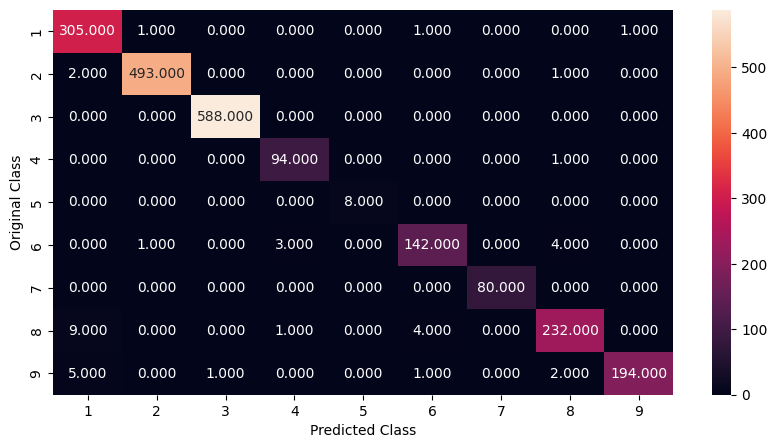

-------------------------------------------------- Precision matrix --------------------------------------------------


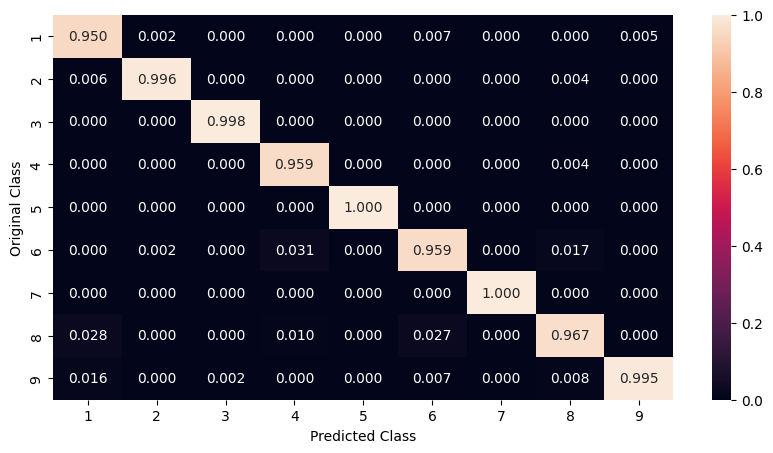

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


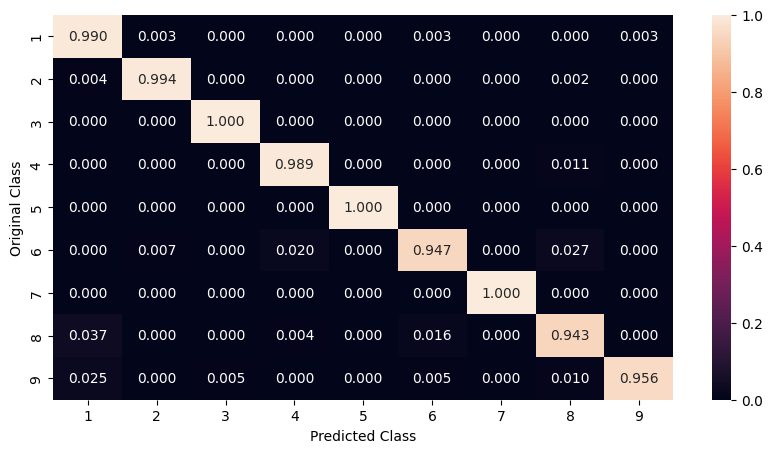

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
CPU times: total: 3min 31s
Wall time: 2min 11s


In [83]:
%%time

rf = RandomForestClassifier(n_estimators=estimators[best_est], n_jobs=-1, bootstrap=True)
rf.fit(X_train, y_train)

finalResults(rf, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.t.2: K-fold(Oversampled trimmed data)

5-fold Cross Validation Log losses
n_estimator= 10 , mean loss: 0.05400060238176844 , model losses: [0.05129668813036332, 0.05935951005566872, 0.04827550884170217, 0.05501640451882235, 0.05605490036228561]
n_estimator= 50 , mean loss: 0.047995209129954516 , model losses: [0.046265120827384515, 0.04528775944996058, 0.04907063102236924, 0.04457294026279071, 0.054779594087267514]
n_estimator= 100 , mean loss: 0.0478421100300927 , model losses: [0.04907282867040565, 0.053388703218227966, 0.047115534571113594, 0.04764663875507536, 0.041986844935640935]
n_estimator= 500 , mean loss: 0.04788120700287481 , model losses: [0.04295197477204745, 0.05085564438856224, 0.05134619661050508, 0.040356573315943965, 0.05389564592731526]
n_estimator= 1000 , mean loss: 0.04553891578838226 , model losses: [0.05246490123955348, 0.04581430587930036, 0.04910069609771754, 0.0395776700763485, 0.04073700564899141]
n_estimator= 2000 , mean loss: 0.04567541852887287 , model losses: [0.05352576029228916, 0.0494295825

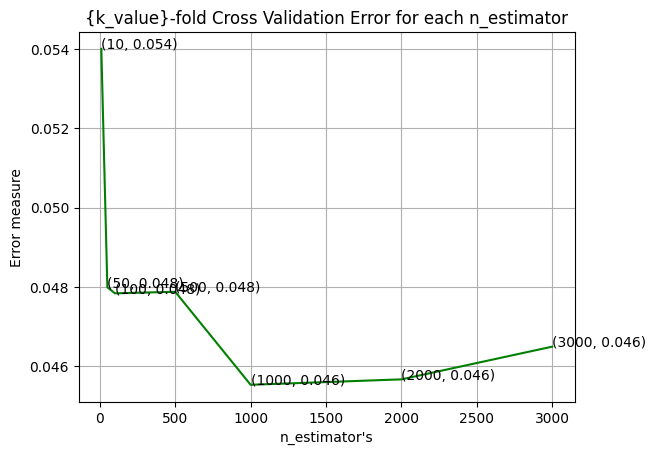

In [66]:
best_est = randomForestKfold(k_value, estimators, oX_train, oy_train)

In [69]:
rf = RandomForestClassifier(n_estimators=estimators[best_est], n_jobs=-1, bootstrap=True)
rf.fit(oX_train, oy_train)

RandomForestClassifier(n_estimators=1000, n_jobs=-1)

log loss for train data 0.012596605265425394
log loss for Cross Validation data 0.02747532719980989
log loss for test data 0.020120915254847736
Number of misclassified points  0.27598896044158233
Accuracy = 0.9972401103955841
Precision = [0.99674267 1.         1.         1.         1.         0.98039216
 0.98765432 1.         0.99509804]
Recall = [0.99350649 1.         1.         0.98947368 1.         1.
 1.         0.98780488 1.        ]
F1 = [0.99512195 1.         1.         0.99470899 1.         0.99009901
 0.99378882 0.99386503 0.997543  ]
-------------------------------------------------- Confusion matrix --------------------------------------------------


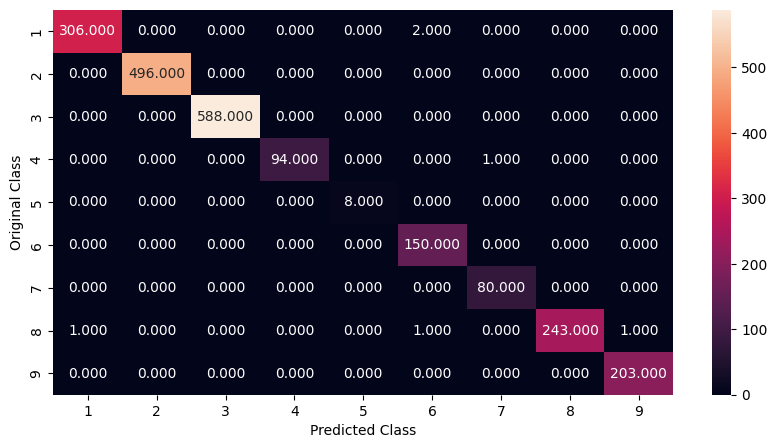

-------------------------------------------------- Precision matrix --------------------------------------------------


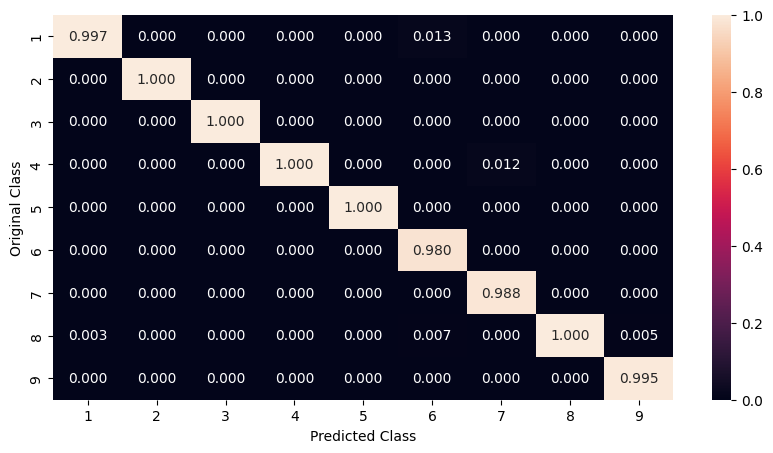

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


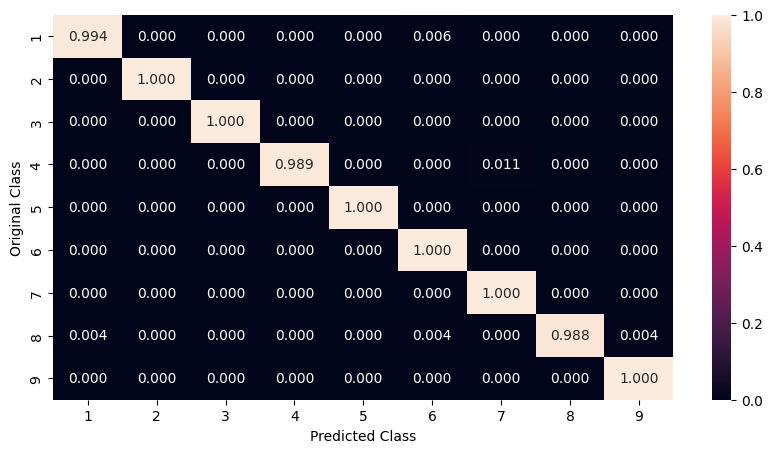

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [70]:
finalResults(rf, k_value, oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

#### 3.2.t.3: Random Search CV(Original trimmed data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 2000, 'max_depth': 10, 'criterion': 'log_loss'}

log loss for train data 0.028355061551996283
log loss for Cross Validation data 0.08282494336051555
log loss for test data 0.082002198240335
Number of misclassified points  1.8399264029438822
Accuracy = 0.9816007359705612
Precision = [0.97419355 0.9959596  0.99492386 0.97826087 1.         0.9
 0.98717949 0.97095436 0.99502488]
Recall = [0.98051948 0.99395161 1.         0.94736842 0.75       0.96
 0.9625     0.95121951 0.98522167]
F1 = [0.97734628 0.99495459 0.99745547 0.96256684 0.85714286 0.92903226
 0.97468354 0.96098563 0.99009901]
-------------------------------------------------- Confusion matrix --------------------------------------------------


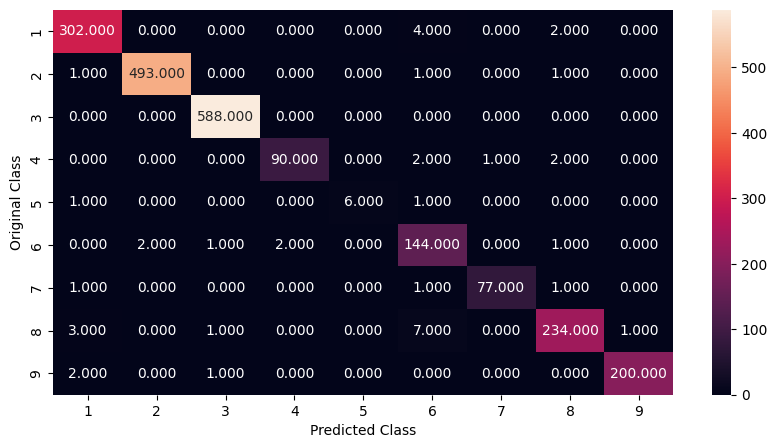

-------------------------------------------------- Precision matrix --------------------------------------------------


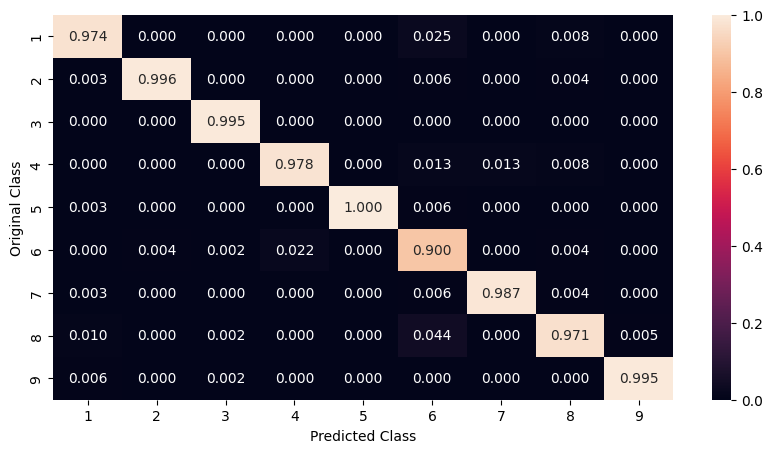

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


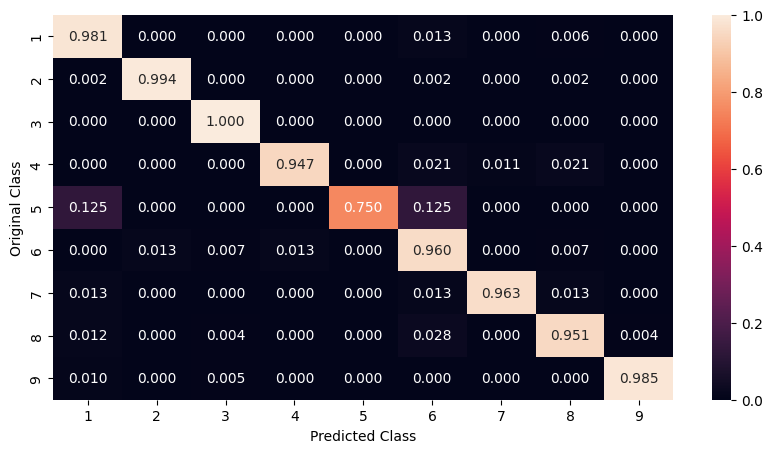

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [71]:
randomForestRandomCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.t.4: Random Search CV(oversampled trimmed data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 3000, 'max_depth': 10, 'criterion': 'entropy'}

log loss for train data 0.019134325923456718
log loss for Cross Validation data 0.03443679350869714
log loss for test data 0.02676943049752747
Number of misclassified points  0.3219871205151794
Accuracy = 0.9967801287948482
Precision = [0.99029126 1.         1.         1.         1.         0.98039216
 1.         1.         0.9950495 ]
Recall = [0.99350649 1.         1.         1.         1.         1.
 1.         0.98780488 0.99014778]
F1 = [0.99189627 1.         1.         1.         1.         0.99009901
 1.         0.99386503 0.99259259]
-------------------------------------------------- Confusion matrix --------------------------------------------------


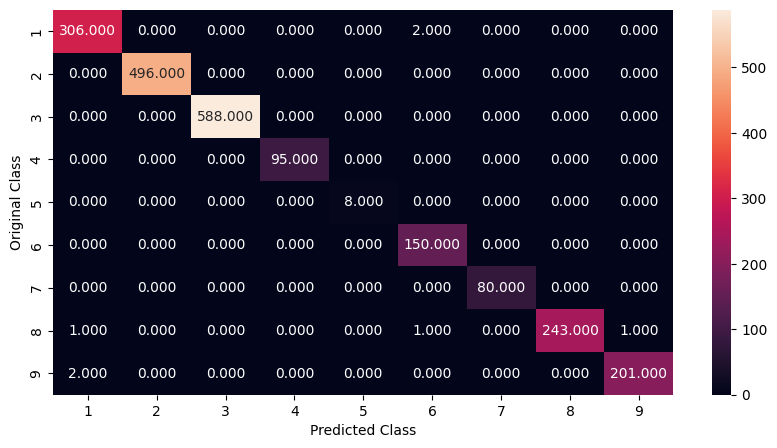

-------------------------------------------------- Precision matrix --------------------------------------------------


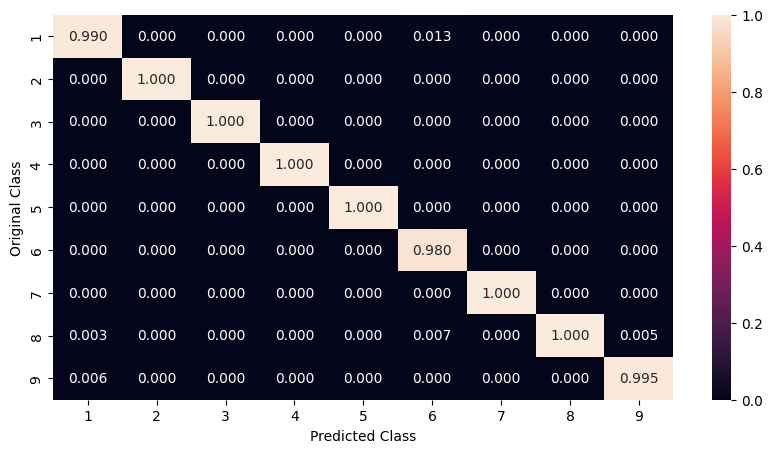

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


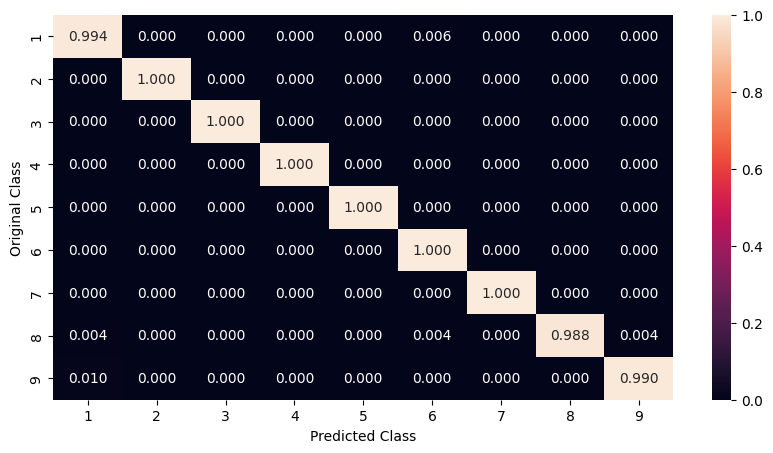

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [72]:
randomForestRandomCV(k_value,  oX_train, oy_train,  oX_cv, oy_cv,  X_test, y_test)

#### 3.2.t.5: Grid Search CV(Original trimmed data)

Fitting 5 folds for each of 63 candidates, totalling 315 fits
Best Parameters: {'criterion': 'log_loss', 'max_depth': 10, 'n_estimators': 500}

log loss for train data 0.029062592945471
log loss for Cross Validation data 0.08704664385797173
log loss for test data 0.07827714006456116
Proportion of misclassified points  0.01701931922723091
Accuracy = 0.9829806807727691
Precision = [0.97402597 0.99597586 0.99324324 0.98913043 1.         0.90797546
 1.         0.9790795  0.98989899]
Recall = [0.97402597 0.99798387 1.         0.95789474 0.875      0.98666667
 0.975      0.95121951 0.96551724]
F1 = [0.97402597 0.99697885 0.99661017 0.97326203 0.93333333 0.9456869
 0.98734177 0.96494845 0.97755611]
-------------------------------------------------- Confusion matrix --------------------------------------------------


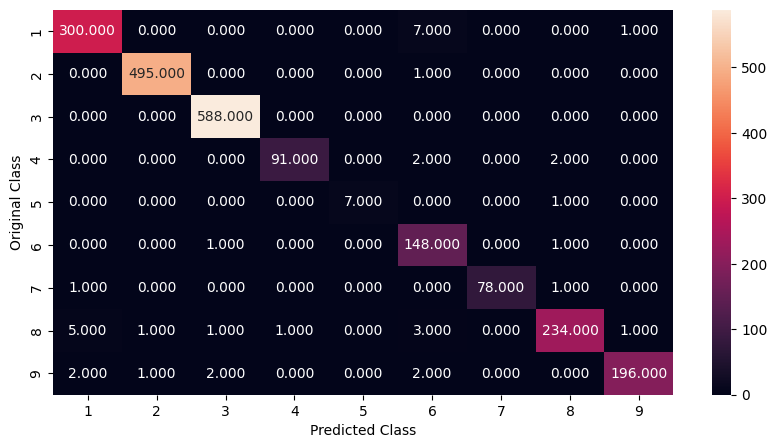

-------------------------------------------------- Precision matrix --------------------------------------------------


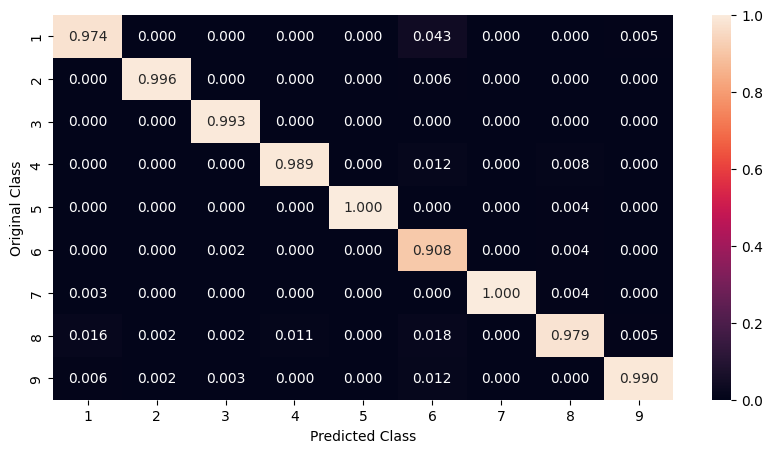

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


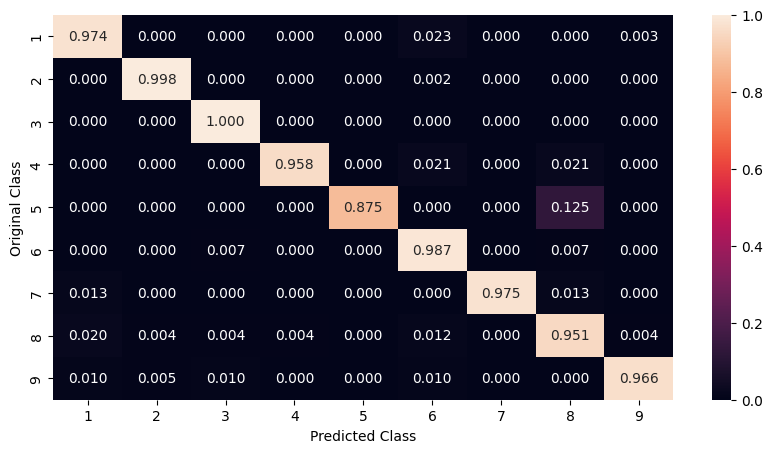

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [144]:
randomForestGridCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.t.6: Grid Search CV(Oversampled trimmed data)

Fitting 5 folds for each of 63 candidates, totalling 315 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': 10, 'n_estimators': 3000}

log loss for train data 0.0188241515559435
log loss for Cross Validation data 0.05717337305597983
log loss for test data 0.032859210497460135
Proportion of misclassified points  0.0068997240110395585
Accuracy = 0.9931002759889604
Precision = [0.98701299 1.         0.99830221 1.         1.         0.96129032
 1.         0.99176955 0.99009901]
Recall = [0.98701299 0.99798387 1.         0.98947368 1.         0.99333333
 1.         0.9796748  0.98522167]
F1 = [0.98701299 0.99899092 0.99915038 0.99470899 1.         0.97704918
 1.         0.98568507 0.98765432]
-------------------------------------------------- Confusion matrix --------------------------------------------------


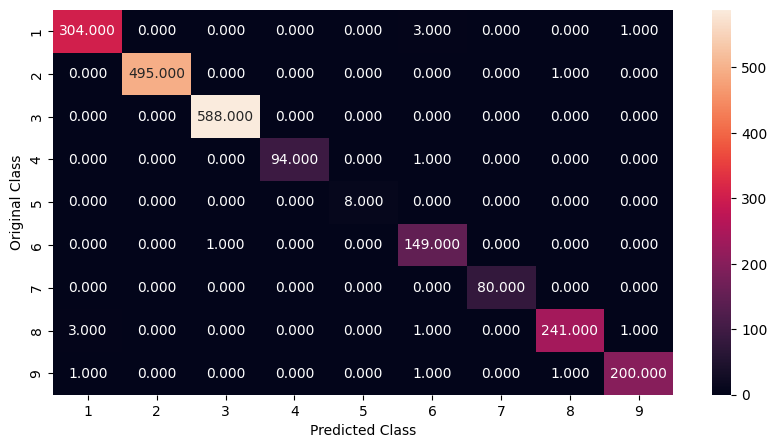

-------------------------------------------------- Precision matrix --------------------------------------------------


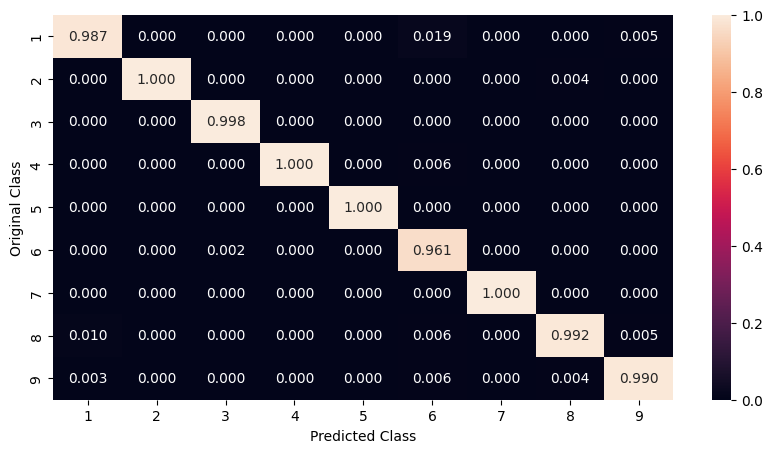

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


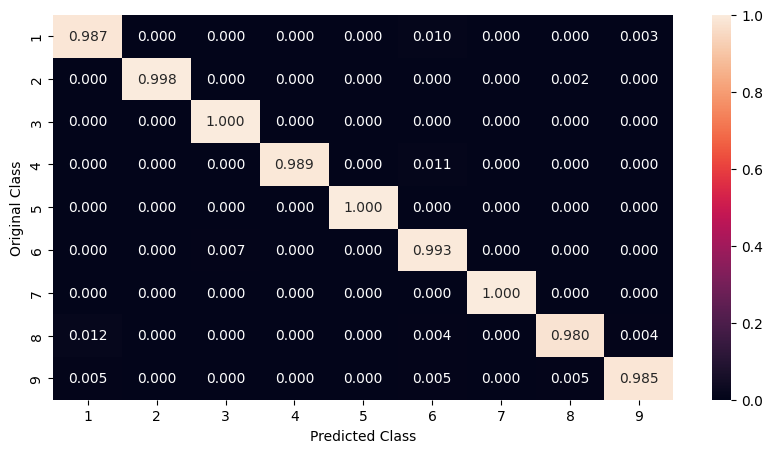

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [145]:
randomForestGridCV(k_value,  oX_train, oy_train,  oX_cv, oy_cv,  X_test, y_test)

#### 3.2.5: Random Search CV(Original data)

In [73]:
print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(byte_df, False, 'byte')
print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(byte_df, True, 'byte')

Original Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (10868, 258) (10868,)

Oversampled Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)


Fitting 5 folds for each of 63 candidates, totalling 315 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': 10, 'n_estimators': 1000}

log loss for train data 0.028831553986063088
log loss for Cross Validation data 0.0783187076921967
log loss for test data 0.0826168762000704
Number of misclassified points  1.9319227230910765
Accuracy = 0.9806807727690893
Precision = [0.95886076 0.99596774 1.         0.96907216 1.         0.91666667
 1.         0.96624473 0.98492462]
Recall = [0.98376623 0.99596774 0.99829932 0.98947368 0.875      0.95333333
 0.9875     0.93089431 0.96551724]
F1 = [0.97115385 0.99596774 0.99914894 0.97916667 0.93333333 0.93464052
 0.99371069 0.94824017 0.97512438]
-------------------------------------------------- Confusion matrix --------------------------------------------------


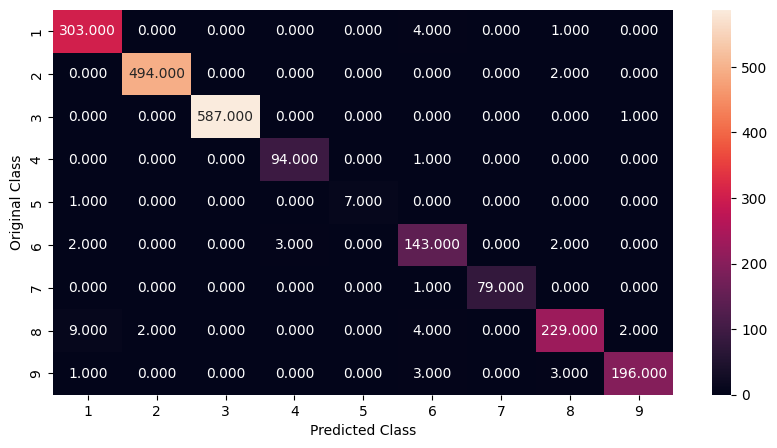

-------------------------------------------------- Precision matrix --------------------------------------------------


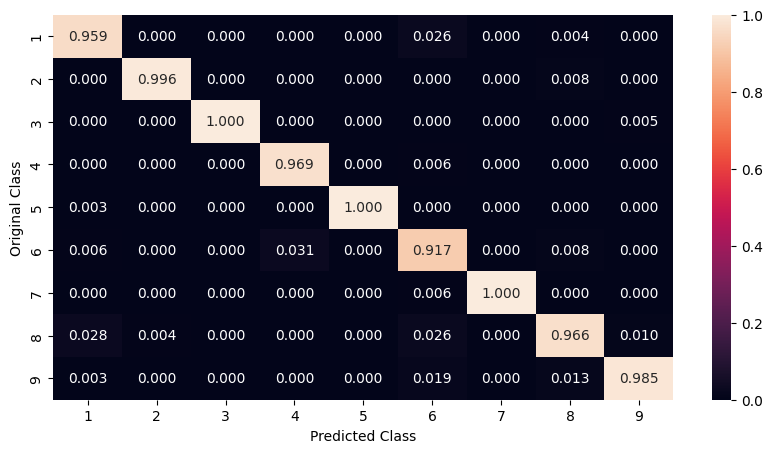

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


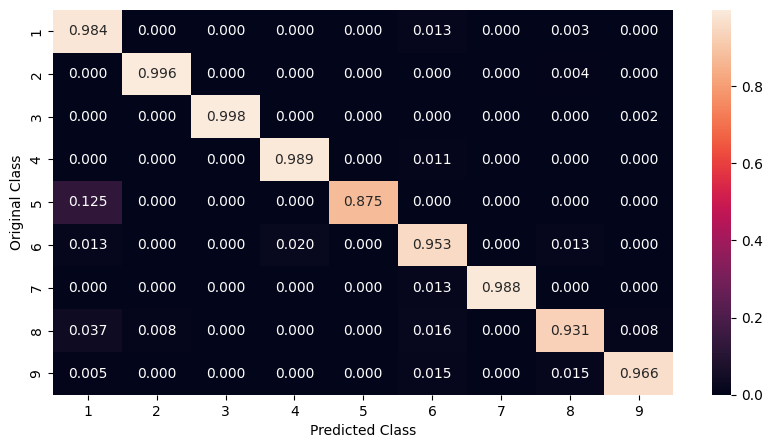

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [75]:
randomForestGridCV(k_value,  X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.6: Random Search Grid(Oversampled Data)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 500, 'max_depth': 10, 'criterion': 'entropy'}

log loss for train data 0.018971141530243082
log loss for Cross Validation data 0.042852281266575094
log loss for test data 0.02856470480379483
Number of misclassified points  0.5979760809567618
Accuracy = 0.9940202391904324
Precision = [0.99672131 1.         1.         0.98958333 1.         0.96129032
 1.         0.98380567 0.995     ]
Recall = [0.98701299 0.99798387 1.         1.         1.         0.99333333
 1.         0.98780488 0.98029557]
F1 = [0.99184339 0.99899092 1.         0.9947644  1.         0.97704918
 1.         0.98580122 0.98759305]
-------------------------------------------------- Confusion matrix --------------------------------------------------


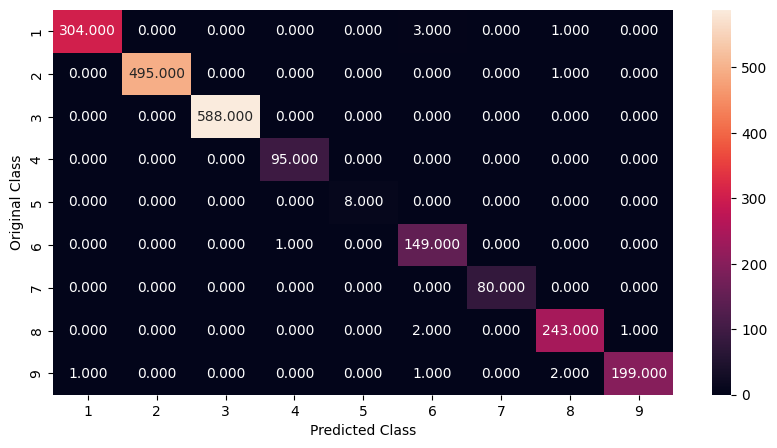

-------------------------------------------------- Precision matrix --------------------------------------------------


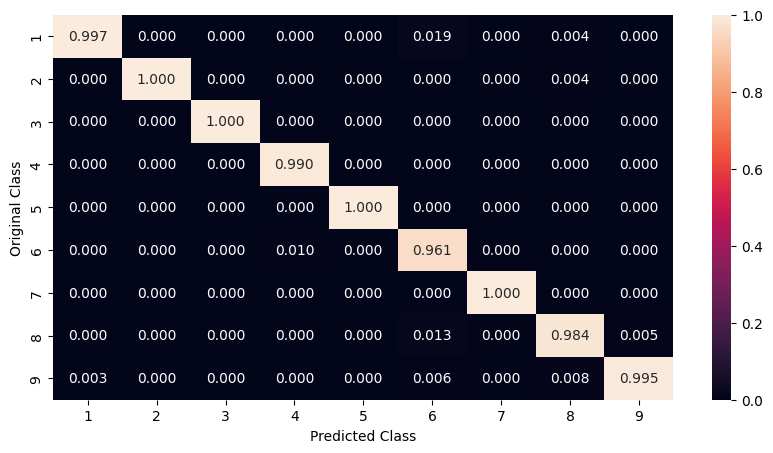

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


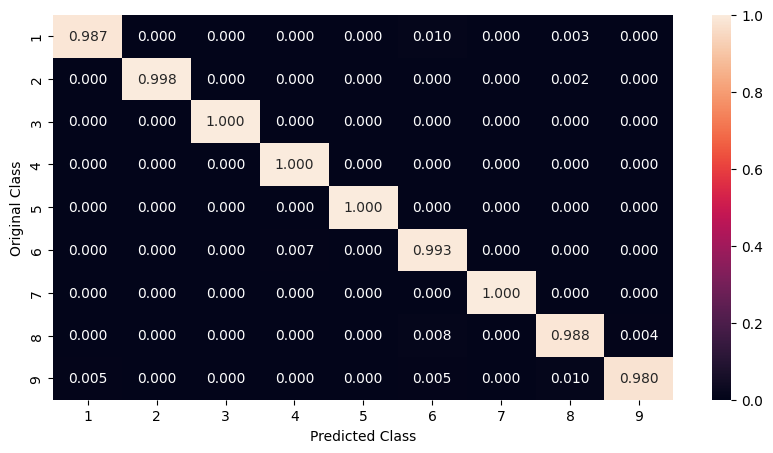

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [76]:
randomForestGridCV(k_value,  oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

### 3.3: SVM Classifier

In [146]:
params={
    'C':[10 ** x for x in range(-4, 6)],
    'gamma' : [0.01,1],
    'degree' : [1,3,5,7],
    'kernel' : ["linear","poly","rbf","sigmoid"]
}

cv_value = 5

print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(byte_df, False, 'byte')
print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(byte_df, True, 'byte')

Original Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (10868, 258) (10868,)

Oversampled Data:
Original dataset shape (10868, 258) (10868,)
Resample dataset shape (26478, 258) (26478,)


#### 3.2.1: K fold(Original Data)

5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.2354389630906621 , model losses: [1.2164071894961008, 1.2269615861059395, 1.2588712299171865, 1.227073039854895, 1.247881770079188]
C= 0.001 , mean loss: 1.2454931141775822 , model losses: [1.2639721251193616, 1.2612664925384014, 1.1944080835338433, 1.2697140356331398, 1.238104834063165]
C= 0.01 , mean loss: 1.2969603304497315 , model losses: [1.2563960587417733, 1.276054247842409, 1.324811552890636, 1.3235771336947475, 1.3039626590790911]
C= 0.1 , mean loss: 1.1474129657241654 , model losses: [1.1025566350083231, 1.154486652036172, 1.1679324738739114, 1.198207757480636, 1.1138813102217855]
C= 1 , mean loss: 1.1036808012050736 , model losses: [1.0816457366101933, 1.1309787976673626, 1.1092142777925764, 1.0899388060629607, 1.1066263878922753]
C= 10 , mean loss: 0.9404024048637456 , model losses: [0.9250344276078711, 0.9479114987363884, 0.9699388125726432, 0.919783898751576, 0.9393433866502492]
C= 100 , mean loss: 0.790750186611

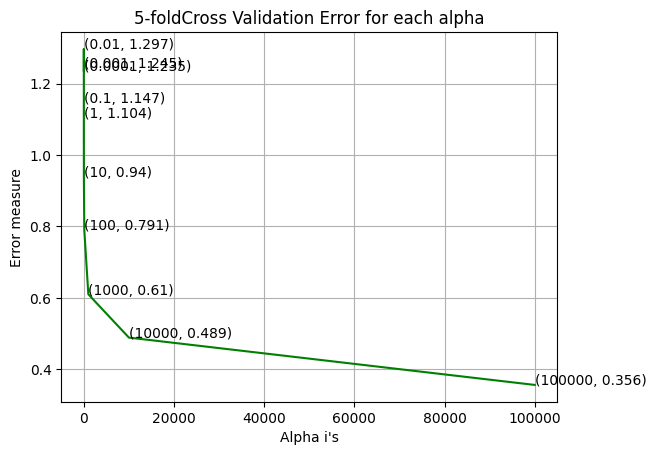

In [147]:
best_c = svmKfold(k_value, c_values, X_train, y_train)

log loss for train data 0.22731201629099843
log loss for Cross Validation data 0.28112227281838836
log loss for test data 0.2988615631561304
Proportion of misclassified points  0.05243790248390064
Accuracy = 0.9475620975160993
Precision = [0.86567164 0.99152542 1.         0.86363636 0.75       0.91549296
 0.86516854 0.94372294 0.94472362]
Recall = [0.94155844 0.94354839 1.         1.         0.75       0.86666667
 0.9625     0.88617886 0.92610837]
F1 = [0.90202177 0.96694215 1.         0.92682927 0.75       0.89041096
 0.9112426  0.91404612 0.93532338]
-------------------------------------------------- Confusion matrix --------------------------------------------------


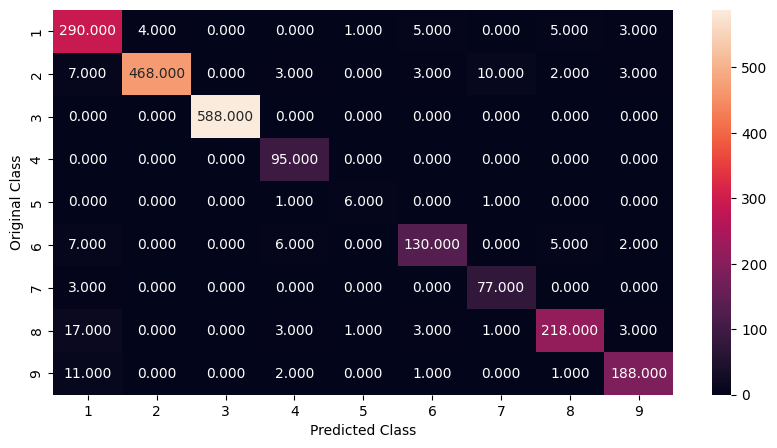

-------------------------------------------------- Precision matrix --------------------------------------------------


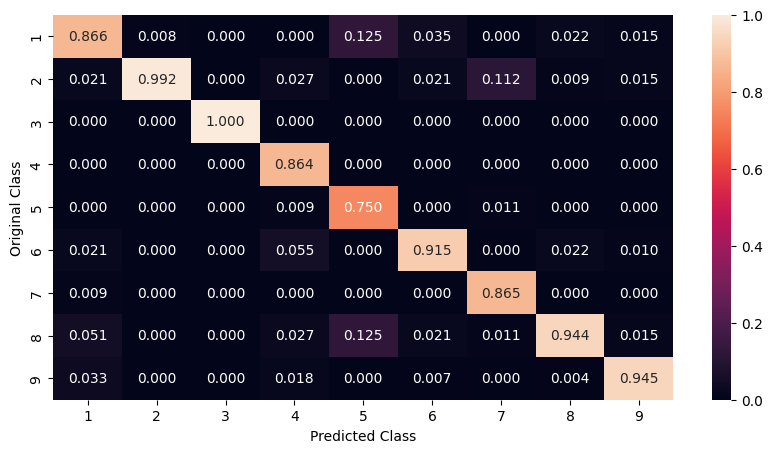

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


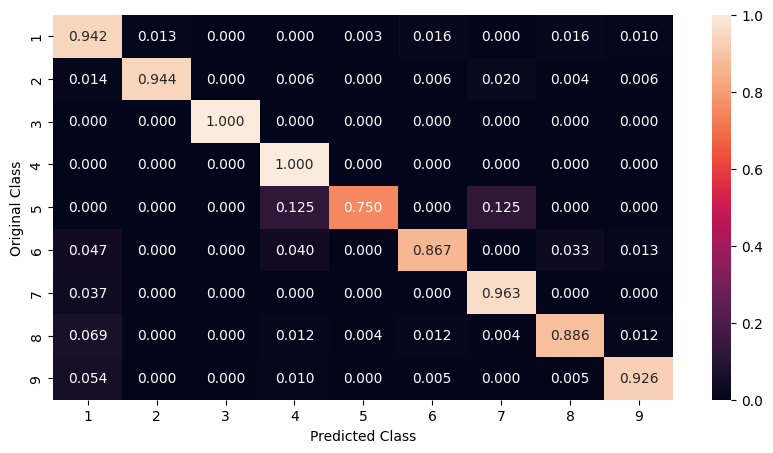

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [148]:
svm = SVC(C=c_values[best_c], class_weight='balanced')
svm.fit(X_train,y_train)
finalResults(svm, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.2: K fold (Oversampled Data)

In [ ]:
best_c = svmKfold(k_value, c_values, oX_train, oy_train)

In [ ]:
svm = SVC(C=c_values[best_c], class_weight='balanced')
svm.fit(oX_train,oy_train)

In [ ]:
finalResults(svm, k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

In [ ]:
finalResults(svm, k_value, oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

#### 3.2.3: Random Search CV(Original Data)

In [ ]:
svmRandomCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.4: Random Search CV(Oversampled Data)

In [ ]:
svmRandomCV(k_value, oX_train, oy_train, oX_test, oy_test)

In [ ]:
svmRandomCV(k_value, oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)


#### 3.3.5: Grid Search CV(Original Data)

In [ ]:
svmGridCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.3.6: Grid Search CV(Oversampled Data)

In [ ]:
svmGridCV(k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

In [ ]:
svmGridCV(k_value, oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

## ASMFILES WORKFLOW

### 1. Data Generator

In [ ]:
folder_1 ='first'
folder_2 ='second'
folder_3 ='third'
folder_4 ='fourth'
folder_5 ='fifth'
folder_6 ='sixth'
folder_7 ='seventh'
folder_8 ='eighth'
folder_9 = 'output'
 
source='asmfiles/'
destination = "train/"

directories = [folder_1, folder_2, folder_3, folder_4, folder_5, folder_6, folder_7, folder_8, folder_9]

##### Seprating asm files into multiple folders named extract_i for multithreading

In [ ]:
def seprateFiles():
    for directory in directories:
        path = destination + directory
        if not os.path.isdir(path):
            os.makedirs(path)

    files = os.listdir(source)
    data=list(range(0,len(files)))
    random.shuffle(data)

    count=0
    for i in range(0,len(files)):
        sep = i%(len(directories)-1)
        shutil.move(source+files[data[i]], destination + directories[sep])

# seprateFiles()
    

In [ ]:
import os
from time import time
import numpy as np
import codecs
import time
from multiprocessing import Process


folder_1 ='first/'
folder_2 ='second/'
folder_3 ='third/'
folder_4 ='fourth/'
folder_5 ='fifth/'
folder_6 ='sixth/'
folder_7 ='seventh/'
folder_8 ='eighth/'

preloc = "train/"

prefixes = ['HEADER:','.text:','.Pav:','.idata:','.data:','.bss:','.rdata:','.edata:','.rsrc:','.tls:','.reloc:','.BSS:','.CODE']
opcodes = ['jmp', 'mov', 'retf', 'push', 'pop', 'xor', 'retn', 'nop', 'sub', 'inc', 'dec', 'add','imul', 'xchg', 'or', 'shr', 'cmp', 'call', 'shl', 'ror', 'rol', 'jnb','jz','rtn','lea','movzx']
registers=['edx','esi','eax','ebx','ecx','edi','ebp','esp','eip']
keywords = ['.dll','std::',':dword']
 

def process(source, destination, id):
    print("Process started:", source, destination, id)
    file1=open(destination, "w+")

    files = os.listdir(source)

    for f in files:
        
        prefixescount=np.zeros(len(prefixes),dtype=int)
        opcodescount=np.zeros(len(opcodes),dtype=int)
        keywordcount=np.zeros(len(keywords),dtype=int)
        registerscount=np.zeros(len(registers),dtype=int)

        features=[]
        f2=f.split('.')[0]
        file1.write(f2+",")

        with codecs.open(source+f,encoding='cp1252',errors ='replace') as fli:

            for lines in fli:
                line=lines.rstrip().split()

                l=line[0]
                for i in range(len(prefixes)):
                    if prefixes[i] in line[0]:
                        prefixescount[i]+=1

                line=line[1:]
                for i in range(len(opcodes)):
                    if any(opcodes[i]==li for li in line):
                        features.append(opcodes[i])
                        opcodescount[i]+=1

                for i in range(len(registers)):
                    for li in line:
                        if registers[i] in li and ('text' in l or 'CODE' in l):
                            registerscount[i]+=1

                for i in range(len(keywords)):
                    for li in line:
                        if keywords[i] in li:
                            keywordcount[i]+=1

        print(".", end="")

        for prefix in prefixescount:
            file1.write(str(prefix)+",")
        for opcode in opcodescount:
            file1.write(str(opcode)+",")
        for register in registerscount:
            file1.write(str(register)+",")
        for key in keywordcount:
            file1.write(str(key)+",")
        file1.write("\n")

    print("\nProcess finishing:", source, destination, id)
    file1.close()


def main():

    p1=Process(target=process, args=(preloc + folder_1, preloc + "extract1.txt", 1))
    p2=Process(target=process, args=(preloc + folder_2, preloc + "extract2.txt", 2))
    p3=Process(target=process, args=(preloc + folder_3, preloc + "extract3.txt", 3))
    p4=Process(target=process, args=(preloc + folder_4, preloc + "extract4.txt", 4))
    p5=Process(target=process, args=(preloc + folder_5, preloc + "extract5.txt", 5))
    p6=Process(target=process, args=(preloc + folder_6, preloc + "extract6.txt", 6))
    p7=Process(target=process, args=(preloc + folder_7, preloc + "extract7.txt", 7))
    p8=Process(target=process, args=(preloc + folder_8, preloc + "extract8.txt", 8))


    #p1.start() is used to start the thread execution
    p1.start()
    p2.start()
    p3.start()
    p4.start()
    p5.start()
    p6.start()
    p7.start()
    p8.start()
    
    #After completion all the threads are joined
    p1.join()
    p2.join()
    p3.join()
    p4.join()
    p5.join()
    p6.join()
    p7.join()
    p8.join()



if __name__=="__main__":
    t1 = time.time()
    # main()
    t2 = time.time()
    print(t2-t1)

#### Merge the exxtracted features into a single file named asmfeatures.txt

In [ ]:
def getSizeDf(source):
    files = os.listdir(source)

    sizebytes=[]
    fnames=[]
    
    for file in files:
        statinfo=os.stat(source + file)
        file=file.split('.')[0]
        sizebytes.append(statinfo.st_size/(1024.0*1024.0))
        fnames.append(file)
        
    bytedf=pd.DataFrame({'Id':fnames,'size':sizebytes})

    return bytedf

#### Merge the data obtained in extracted files into a single one CSV file

In [ ]:
prefixes = ['HEADER:','.text:','.Pav:','.idata:','.data:','.bss:','.rdata:','.edata:','.rsrc:','.tls:','.reloc:','.BSS:','.CODE']
opcodes = ['jmp', 'mov', 'retf', 'push', 'pop', 'xor', 'retn', 'nop', 'sub', 'inc', 'dec', 'add','imul', 'xchg', 'or', 'shr', 'cmp', 'call', 'shl', 'ror', 'rol', 'jnb','jz','rtn','lea','movzx']
registers=['edx','esi','eax','ebx','ecx','edi','ebp','esp','eip']
keywords = ['.dll','std::',':dword']

def merger():
    source = "train/"
    files = os.listdir(source)

    data = ""
        
    source = "train/"
    files = os.listdir(source)

    for file in files:
        if (file.endswith("txt")):
            with open(source + file, "r") as f:
                data += f.read()
    
    header = "Id"
    for prefix in prefixes:
        header +=  ("," + prefix)
    for opcode in opcodes:
        header +=  ("," + opcode)
    for register in registers:
        header +=  ("," + register)
    for keyword in keywords:
        header +=  ("," + keyword)
    header += ',Class'

    
    with open("asmFeatures.txt", "w+") as f:
        f.write(header + "\n")
        f.write(data)

    df1 = pd.read_csv("asmFeatures.txt")

    df1 = df1.drop(['Class'], axis= 1)
    df2 = getSizeDf('asmFiles/')
    df3 = pd.read_csv(source + "trainLabels.csv")

    df = pd.merge(df1, df2, on='Id')
    df = pd.merge(df, df3, on='Id')

    df.to_csv(source + 'asmFeatures.csv', index = None)

    os.remove("asmFeatures.txt")
    
    return df

asm_df = merger()


### 2. Exploratory Data Analysis

#### Shapes of Data used in the traininng

In [ ]:
asm_df = pd.read_csv('train/' + 'asmFeatures.csv')
_, _, _, _, _, _ = splitTest(asm_df, False, 'asm')
_, _, _, _, _, _ = splitTest(asm_df, True, 'asm')

In [85]:
asm_df.head()

,Id,HEADER:,.text:,.Pav:,.idata:,.data:,.bss:,.rdata:,.edata:,.rsrc:,...,ecx,edi,ebp,esp,eip,.dll,std::,:dword,size,Class
0,04cvLCVPqBMs6yn5xGlE,17,3405,0,123,783910,0,598,0,0,...,135,216,187,224,0,12,0,39,32.699180,3
1,04QzZ3DVdPsEp9elLR65,19,2216,0,124,1033,0,640,0,3,...,163,176,182,225,0,12,0,39,0.196652,3
2,05aiMRw13bYWqZ8OHvjl,0,102549,0,310,26642,0,52555,0,0,...,962,459,904,629,0,7,22,78,15.068774,2
3,09bfacpUzuBN5W3S8KTo,17,2558,0,140,1039,0,2001,0,3,...,168,339,198,243,0,12,0,39,0.260113,3
4,09CPNMYyQjSguFrE8UOf,17,16655,0,155,313860,17,0,0,3,...,697,584,2746,2646,0,4,0,71,21.660725,6


#### Check for null values in dataset

In [86]:
print(asm_df.isnull().sum())

Id         0
HEADER:    0
.text:     0
.Pav:      0
.idata:    0
.data:     0
.bss:      0
.rdata:    0
.edata:    0
.rsrc:     0
.tls:      0
.reloc:    0
.BSS:      0
.CODE      0
jmp        0
mov        0
retf       0
push       0
pop        0
xor        0
retn       0
nop        0
sub        0
inc        0
dec        0
add        0
imul       0
xchg       0
or         0
shr        0
cmp        0
call       0
shl        0
ror        0
rol        0
jnb        0
jz         0
rtn        0
lea        0
movzx      0
edx        0
esi        0
eax        0
ebx        0
ecx        0
edi        0
ebp        0
esp        0
eip        0
.dll       0
std::      0
:dword     0
size       0
Class      0
dtype: int64


#### Dataframe overviewed info

In [87]:
print(asm_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10868 entries, 0 to 10867
Data columns (total 54 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Id       10868 non-null  object 
 1   HEADER:  10868 non-null  int64  
 2   .text:   10868 non-null  int64  
 3   .Pav:    10868 non-null  int64  
 4   .idata:  10868 non-null  int64  
 5   .data:   10868 non-null  int64  
 6   .bss:    10868 non-null  int64  
 7   .rdata:  10868 non-null  int64  
 8   .edata:  10868 non-null  int64  
 9   .rsrc:   10868 non-null  int64  
 10  .tls:    10868 non-null  int64  
 11  .reloc:  10868 non-null  int64  
 12  .BSS:    10868 non-null  int64  
 13  .CODE    10868 non-null  int64  
 14  jmp      10868 non-null  int64  
 15  mov      10868 non-null  int64  
 16  retf     10868 non-null  int64  
 17  push     10868 non-null  int64  
 18  pop      10868 non-null  int64  
 19  xor      10868 non-null  int64  
 20  retn     10868 non-null  int64  
 21  nop      108

#### Heat map showing missing values

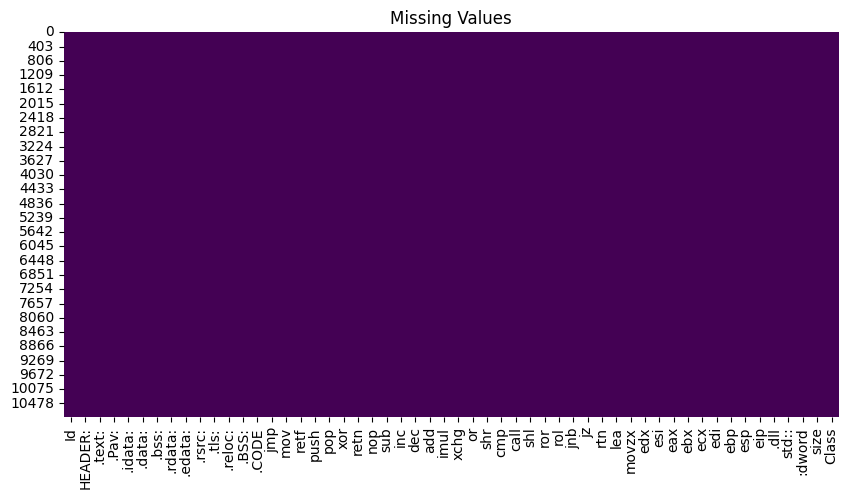

In [88]:

plt.figure(figsize=(10,5))
sns.heatmap(asm_df.isnull(),cbar=False,cmap='viridis')
plt.title("Missing Values")
plt.show()

#### Correlation matrix

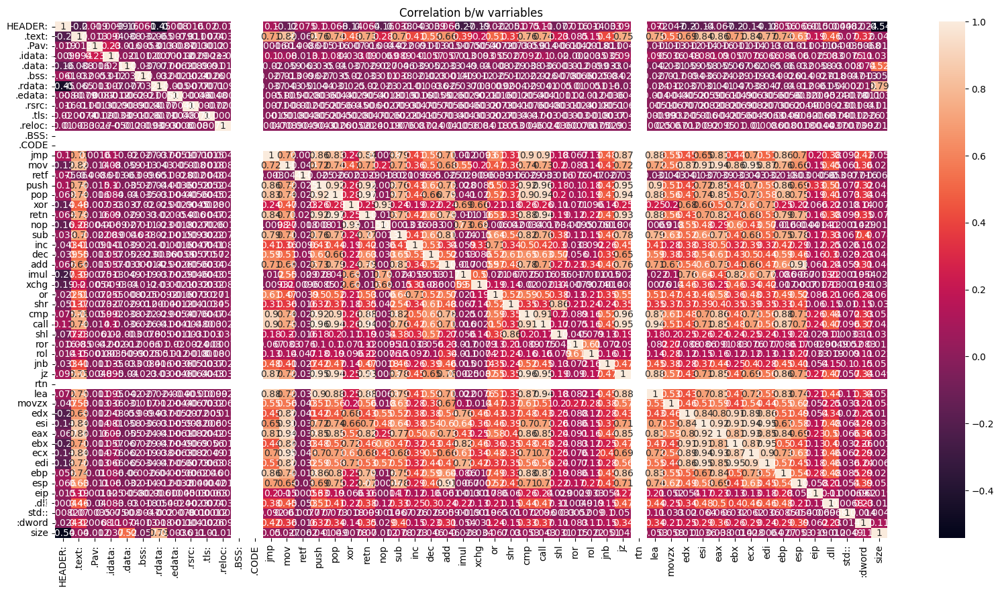

In [89]:
plt.figure(figsize=(20,10))
sns.heatmap(asm_df.iloc[:, :-1].corr(),cbar=True,annot=True)
plt.title("Correlation b/w varriables")
plt.show()

### 3. Model Training

In [107]:
print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(asm_df, False, 'asm')

print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(asm_df, True, 'asm')

Original Data:
Original dataset shape (10868, 49) (10868,)
Resample dataset shape (10868, 49) (10868,)

Oversampled Data:
Original dataset shape (10868, 49) (10868,)
Resample dataset shape (26478, 49) (26478,)


### 3.1: Logistic Regression

In [108]:
k_value = 5
c_values = [10 ** x for x in range(-4, 6)]

#### 3.1.1: K fold(Original Data)

5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.6922206440844985 , model losses: [1.720710721435003, 1.7007685844214304, 1.665570949711139, 1.6871601991379348, 1.6868927657169859]
C= 0.001 , mean loss: 1.6945569637792866 , model losses: [1.7011591392972576, 1.7048486305364952, 1.728230863919401, 1.6713908908345312, 1.667155294308748]
C= 0.01 , mean loss: 1.6953915318696242 , model losses: [1.6804640846282344, 1.7100616861216609, 1.6837213588139246, 1.7220470661079292, 1.6806634636763733]
C= 0.1 , mean loss: 1.6921955073775279 , model losses: [1.7126282756774094, 1.6719033593286643, 1.709540904323363, 1.6670127304868863, 1.6998922670713164]
C= 1 , mean loss: 1.6943636409072074 , model losses: [1.7442733213729462, 1.6499122005964157, 1.6950505561727927, 1.6867653470335962, 1.6958167793602859]
C= 10 , mean loss: 1.6903594406998455 , model losses: [1.6716514062139423, 1.691419782209046, 1.6953152269057077, 1.6981926507843277, 1.695218137386204]
C= 100 , mean loss: 1.69034098205

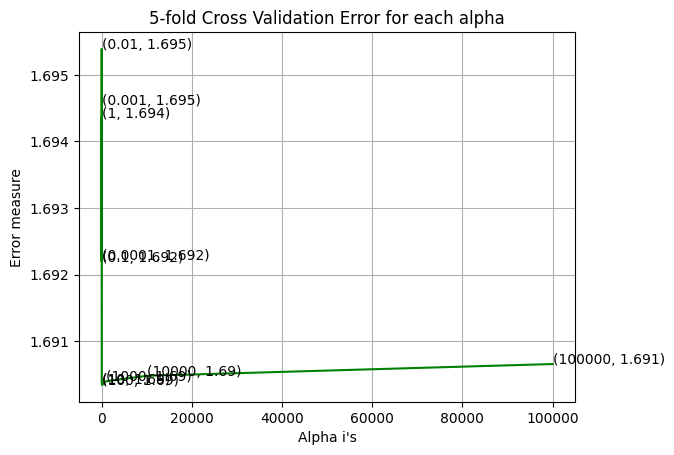

CPU times: total: 1min 9s
Wall time: 56.7 s


In [96]:
%%time
best_c = logisticRegressionKfold(k_value, c_values, X_train, y_train)

log loss for train data 1.6845900588723235
log loss for Cross Validation data 1.698104447123006
log loss for test data 1.6860687930617275
Number of misclassified points  57.359705611775524
Accuracy = 0.4264029438822447
Precision = [0.         0.80985915 0.33448276 0.         0.         0.
 0.         0.         0.        ]
Recall = [0.         0.69556452 0.98979592 0.         0.         0.
 0.         0.         0.        ]
F1 = [0.        0.7483731 0.5       0.        0.        0.        0.
 0.        0.       ]
-------------------------------------------------- Confusion matrix --------------------------------------------------


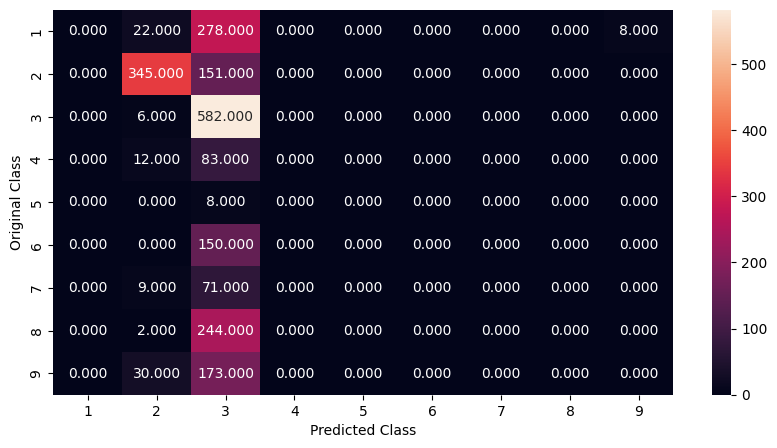

-------------------------------------------------- Precision matrix --------------------------------------------------


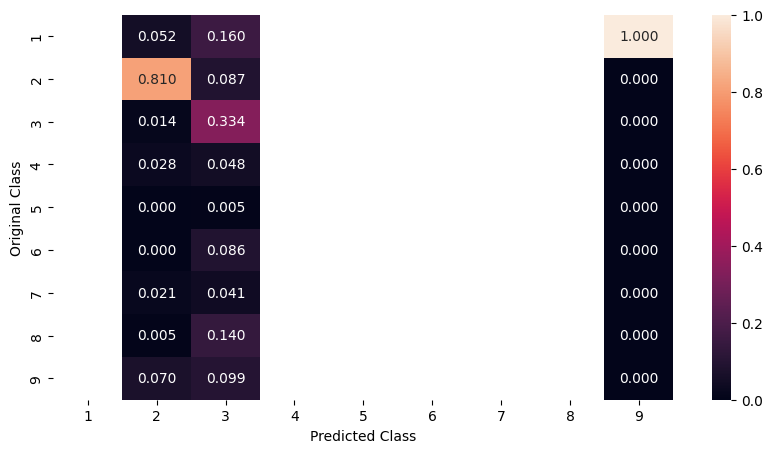

Sum of columns in precision matrix [nan  1.  1. nan nan nan nan nan  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


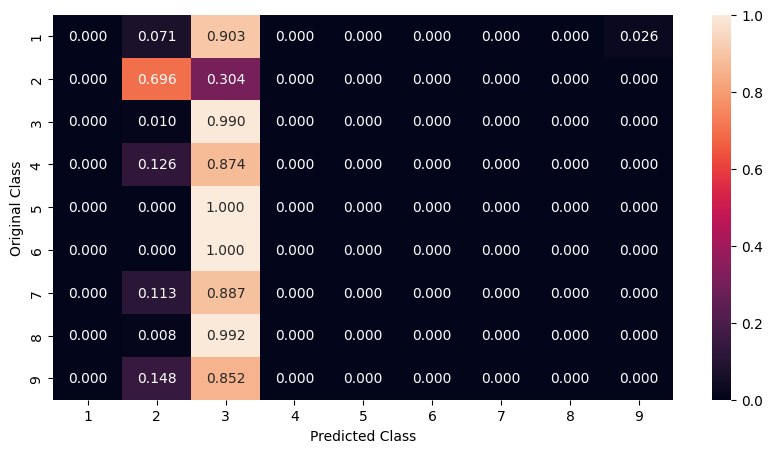

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
CPU times: total: 3.62 s
Wall time: 4.1 s


In [109]:
%%time

lr=LR(penalty='l2',C=c_values[best_c],class_weight='balanced')
lr.fit(X_train,y_train)

finalResults(lr, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.1.2: K fold (Oversampled Data)

5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.9993245099200714 , model losses: [1.9979398793905694, 2.0037341493062546, 1.9991288925972668, 1.9954274108257448, 2.00039221748052]
C= 0.001 , mean loss: 1.9984883764158305 , model losses: [1.9923625923358452, 1.9924162582297658, 1.9879993375292908, 2.015297572653373, 2.004366121330878]
C= 0.01 , mean loss: 1.9975859491292787 , model losses: [1.9936691352002207, 2.0109274348563577, 1.984440609658795, 1.9948673475761438, 2.0040252183548777]
C= 0.1 , mean loss: 1.996661883689009 , model losses: [2.0007008280642293, 2.0035830954597644, 1.9912478216049436, 1.9886751755444003, 1.9991024977717071]
C= 1 , mean loss: 1.9948138724446003 , model losses: [1.9923371941437107, 2.0113008857094368, 1.9794108994056632, 1.9899607928581915, 2.0010595901059984]
C= 10 , mean loss: 1.9981183335480452 , model losses: [1.9880053209828377, 2.0143560153753364, 1.9858575119595472, 1.9941813180151036, 2.0081915014074023]
C= 100 , mean loss: 1.9976341387

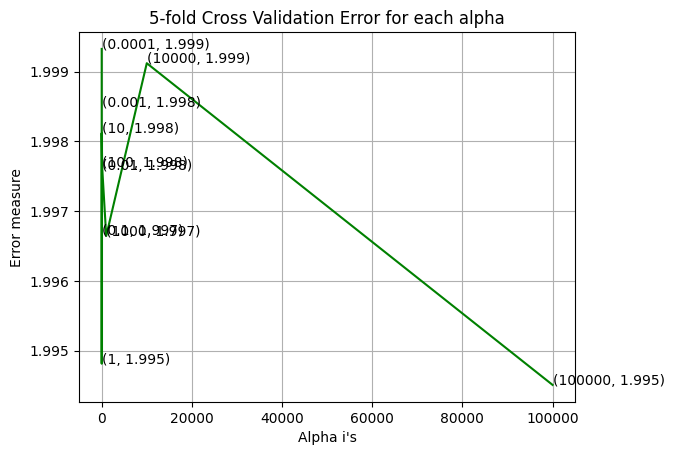

CPU times: total: 2min 23s
Wall time: 1min 36s


In [110]:
%%time
best_c = logisticRegressionKfold(k_value, c_values, oX_train, oy_train)

In [111]:
lr=LR(penalty='l2',C=c_values[best_c],class_weight='balanced')
lr.fit(X_train,y_train)

LogisticRegression(C=100000, class_weight='balanced')

log loss for train data 1.9980593031001186
log loss for Cross Validation data 1.9882199592088767
log loss for test data 1.9878844737127068
Number of misclassified points  74.20694864048339
Accuracy = 0.25793051359516617
Precision = [0.87096774 0.64765101 0.         0.97014925 0.15460203 0.2238806
 0.         0.06842105 0.3575    ]
Recall = [0.09183673 0.65646259 0.         0.11035654 0.80135823 0.15306122
 0.         0.02210884 0.48639456]
F1 = [0.16615385 0.65202703 0.         0.19817073 0.25919824 0.18181818
 0.         0.03341902 0.41210375]
-------------------------------------------------- Confusion matrix --------------------------------------------------


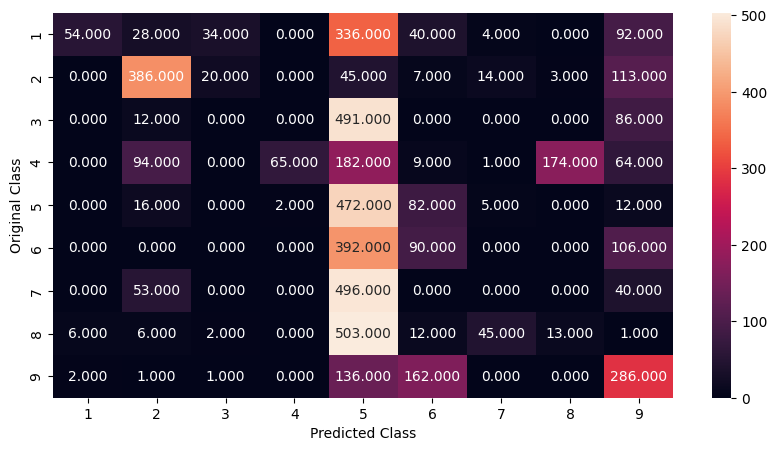

-------------------------------------------------- Precision matrix --------------------------------------------------


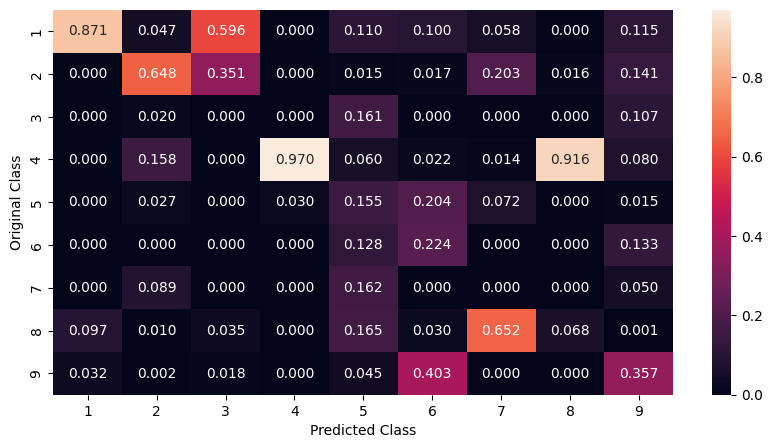

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


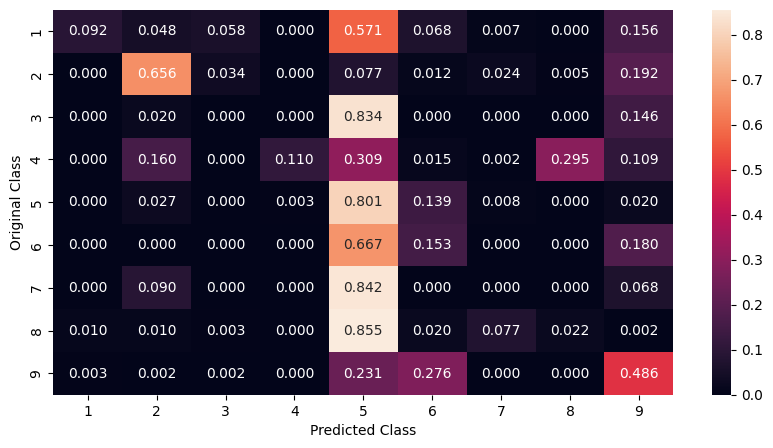

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [114]:
finalResults(lr, k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

#### 3.1.3: Random Search CV(Original Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'penalty': 'l2', 'C': 0.0001}
log loss for train data 1.6830654283542545
log loss for Cross Validation data 1.6966080783264714
log loss for test data 1.684605802611123
Number of misclassified points  58.55565777368905
Accuracy = 0.4144434222631095
Precision = [0.         0.80555556 0.32862789 0.         0.         0.
 0.         0.         0.        ]
Recall = [0.         0.64314516 0.98979592 0.         0.         0.
 0.         0.         0.        ]
F1 = [0.         0.71524664 0.49342942 0.         0.         0.
 0.         0.         0.        ]
-------------------------------------------------- Confusion matrix --------------------------------------------------


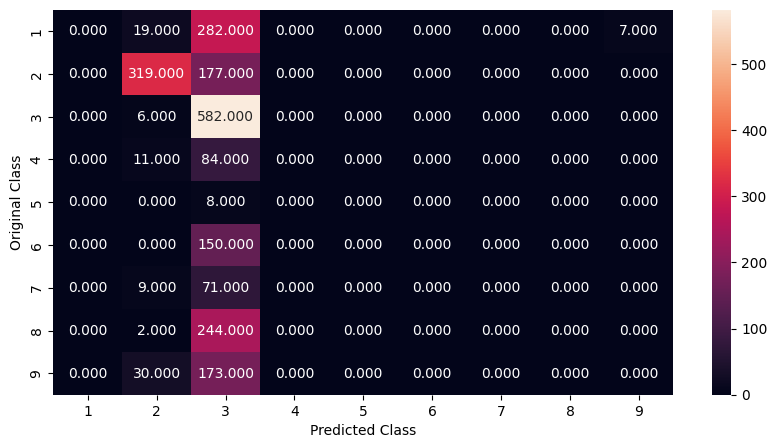

-------------------------------------------------- Precision matrix --------------------------------------------------


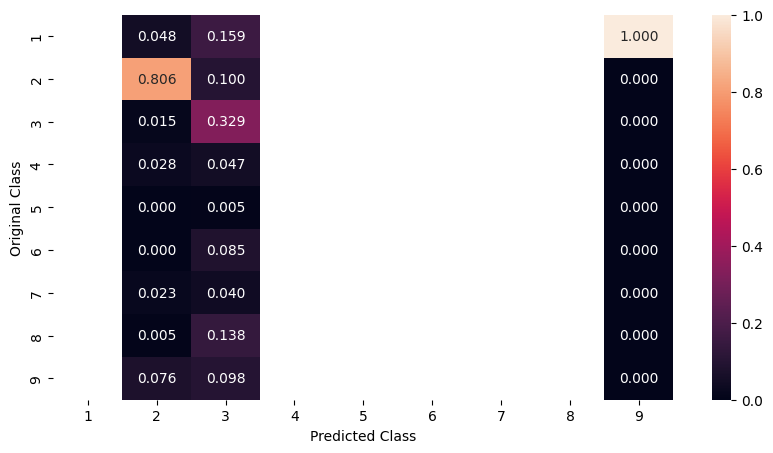

Sum of columns in precision matrix [nan  1.  1. nan nan nan nan nan  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


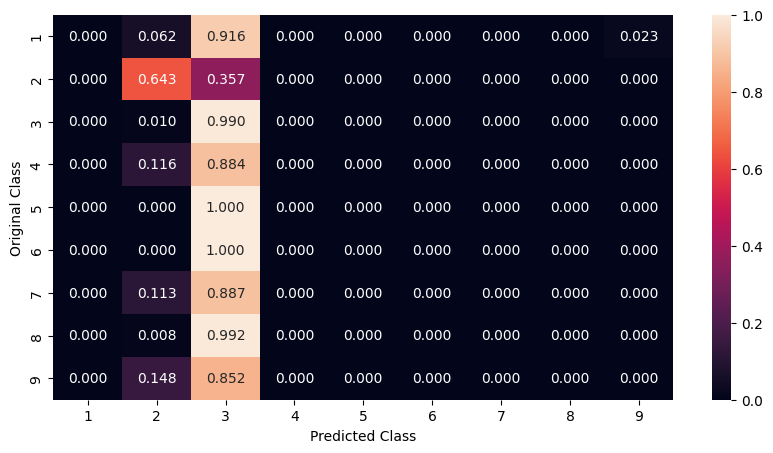

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [116]:
logisticRegressionRandom(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.1.4: Random Search CV(Oversampled Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'penalty': 'none', 'C': 1000}
log loss for train data 2.0014023418758415
log loss for Cross Validation data 1.9925382040932136
log loss for test data 1.9918223315423904
Number of misclassified points  74.71676737160121
Accuracy = 0.25283232628398794
Precision = [0.86363636 0.60682493 0.         0.93939394 0.15445026 0.22556391
 0.         0.05913978 0.36317781]
Recall = [0.06462585 0.69557823 0.         0.05263158 0.80135823 0.15306122
 0.         0.01870748 0.48979592]
F1 = [0.12025316 0.6481775  0.         0.09967846 0.25898491 0.18237082
 0.         0.02842377 0.41708907]
-------------------------------------------------- Confusion matrix --------------------------------------------------


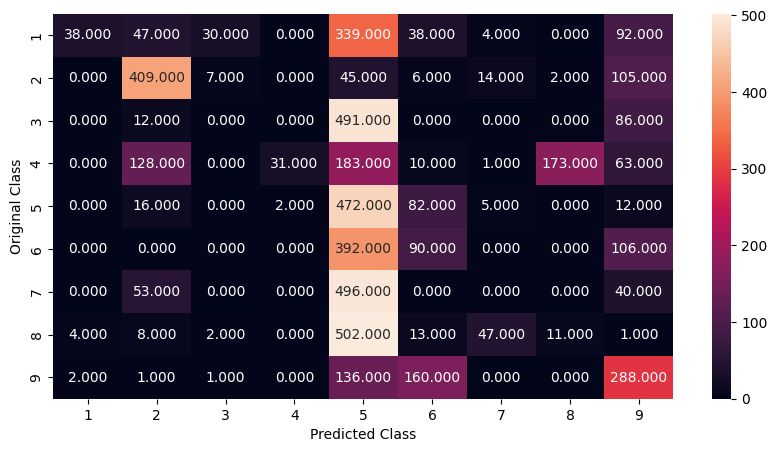

-------------------------------------------------- Precision matrix --------------------------------------------------


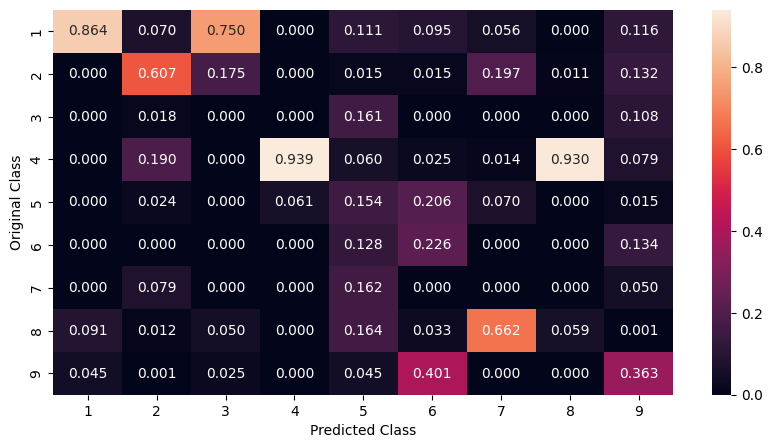

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


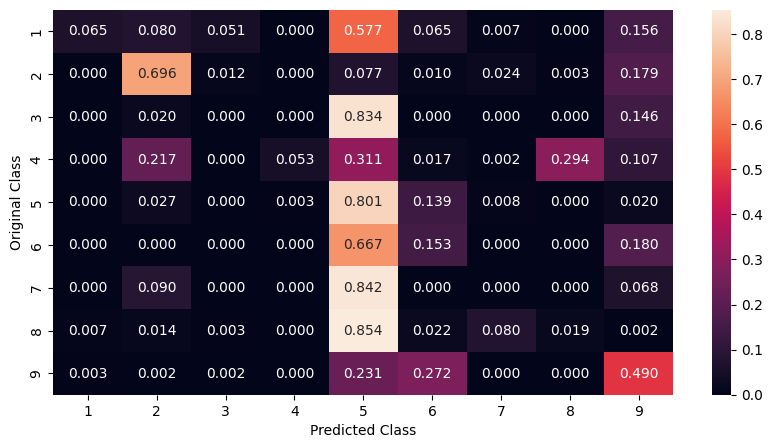

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [118]:
logisticRegressionRandom(k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

#### 3.1.5: Grid Search CV(Original Data)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'C': 0.0001, 'penalty': 'l2'}
log loss for train data 1.136409723245444
log loss for Cross Validation data 1.1663776179086245
log loss for test data 1.1100820482648712
Proportion of misclassified points  0.3923643054277829
Accuracy = 0.6076356945722171
Precision = [0.29487179 0.76344086 0.9171875  0.         0.         0.
 0.95238095 0.         0.38888889]
Recall = [0.82142857 0.85887097 0.99829932 0.         0.         0.
 0.25       0.         0.17241379]
F1 = [0.43396226 0.80834915 0.95602606 0.         0.         0.
 0.3960396  0.         0.23890785]
-------------------------------------------------- Confusion matrix --------------------------------------------------


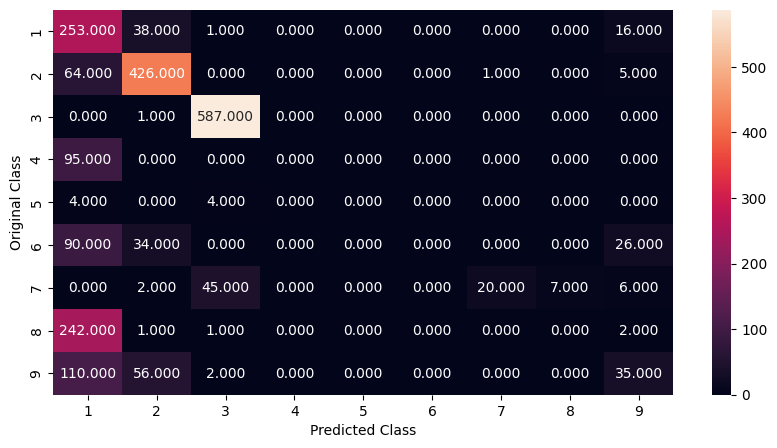

-------------------------------------------------- Precision matrix --------------------------------------------------


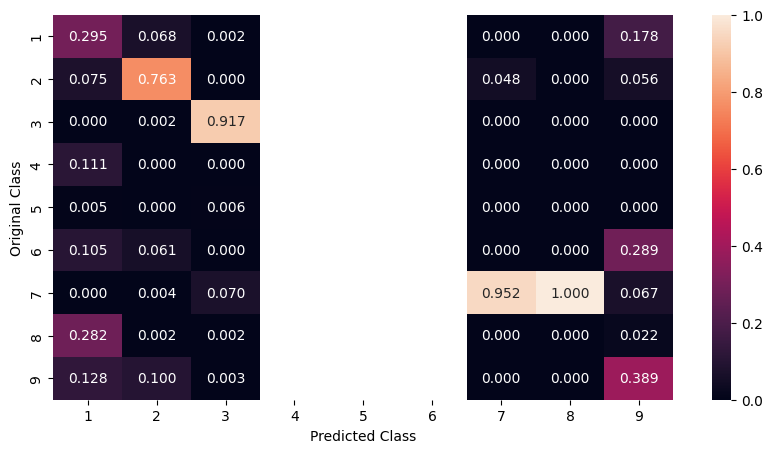

Sum of columns in precision matrix [ 1.  1.  1. nan nan nan  1.  1.  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


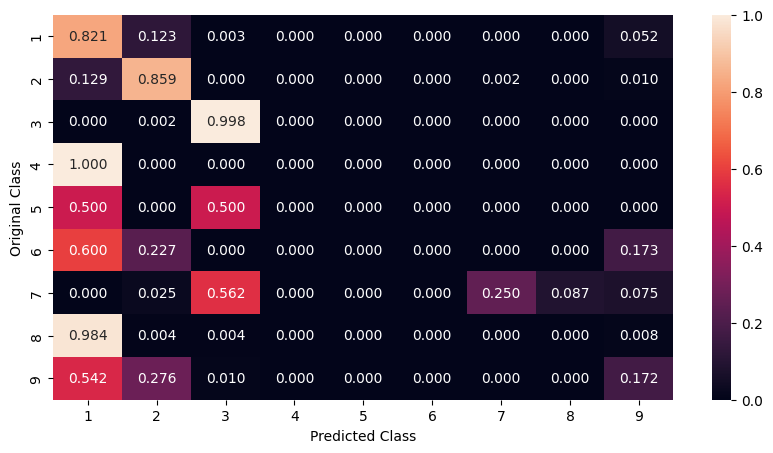

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [151]:
logisticRegressionGrid(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.1.6: Grid Search CV(Oversampled Data)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'C': 0.001, 'penalty': 'l2'}
log loss for train data 1.584240329088431
log loss for Cross Validation data 1.5922948342208167
log loss for test data 1.3747519637077545
Proportion of misclassified points  0.46182152713891444
Accuracy = 0.5381784728610856
Precision = [0.         0.88026608 0.99155405 0.         0.28571429 0.06901042
 0.97058824 0.05       0.2625    ]
Recall = [0.         0.80040323 0.99829932 0.         0.25       0.35333333
 0.825      0.00813008 0.31034483]
F1 = [0.         0.83843717 0.99491525 0.         0.26666667 0.11546841
 0.89189189 0.01398601 0.28442438]
-------------------------------------------------- Confusion matrix --------------------------------------------------


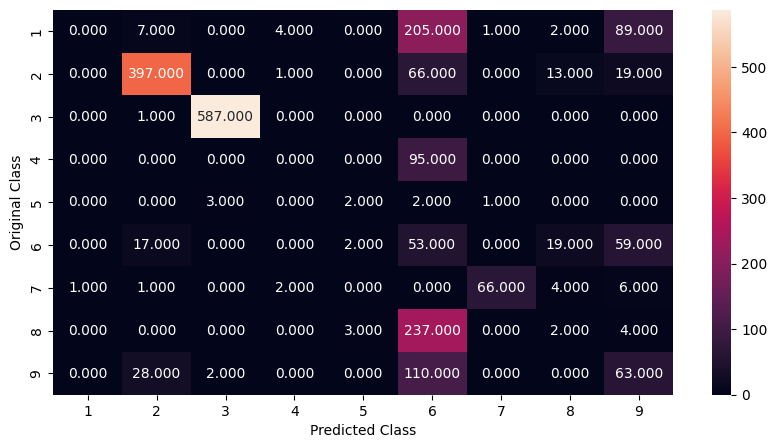

-------------------------------------------------- Precision matrix --------------------------------------------------


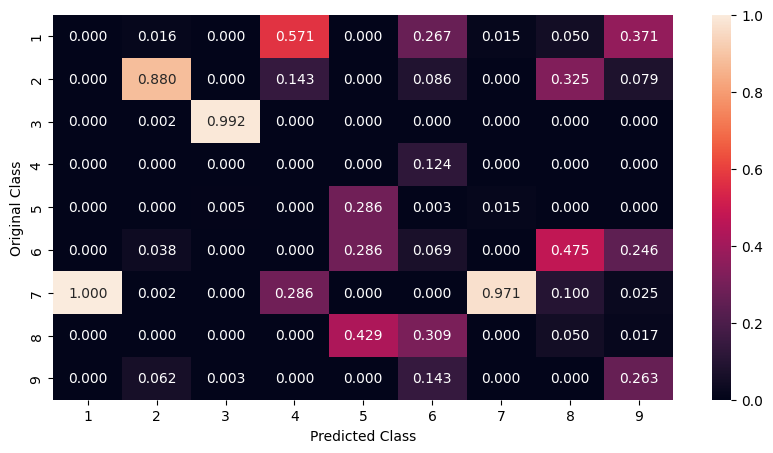

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


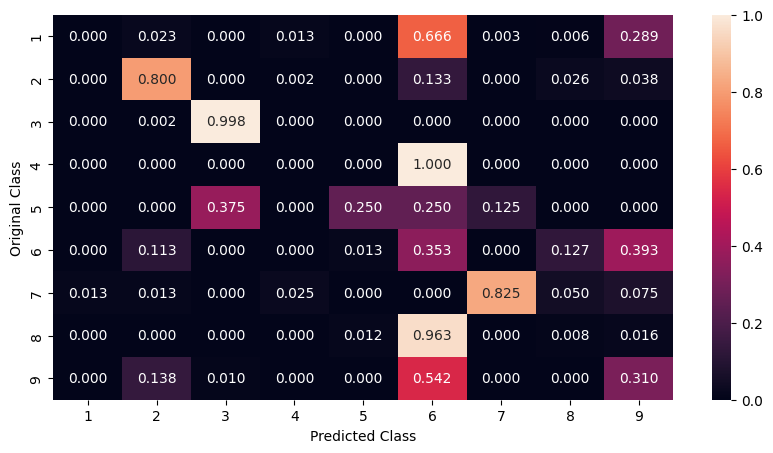

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [153]:
logisticRegressionGrid(k_value, oX_train, oy_train,  oX_cv, oy_cv, X_test, y_test)

### 3.2: Random Forest Classifier

In [120]:
k_value = 5
estimators = [10,50,100,500,1000,2000,3000]

print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(asm_df, False, 'asm')

print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(asm_df, True, 'asm')

#### 3.2.1: K fold(Original Data)

5-fold Cross Validation Log losses
n_estimator= 10 , mean loss: 0.044760932073158274 , model losses: [0.05420704176313809, 0.03559913356420687, 0.04168686818690756, 0.044795138430536265, 0.0475164784210026]
n_estimator= 50 , mean loss: 0.0400290214850824 , model losses: [0.03497498631991315, 0.03414003626807906, 0.03004535203085893, 0.044185587623309375, 0.05679914518325152]
n_estimator= 100 , mean loss: 0.03956277467517019 , model losses: [0.043088488453135045, 0.041169372045542274, 0.043482419709904144, 0.03814191529407834, 0.03193167787319116]
n_estimator= 500 , mean loss: 0.03910163830563618 , model losses: [0.043833953936719114, 0.042643632032803955, 0.045374579871080754, 0.03521476575386368, 0.028441259933713377]
n_estimator= 1000 , mean loss: 0.03952530778121763 , model losses: [0.034551915571087485, 0.05404484294650207, 0.04371197880802218, 0.034699149276628684, 0.03061865230384772]
n_estimator= 2000 , mean loss: 0.039511470505955895 , model losses: [0.046513905849354706, 0.048

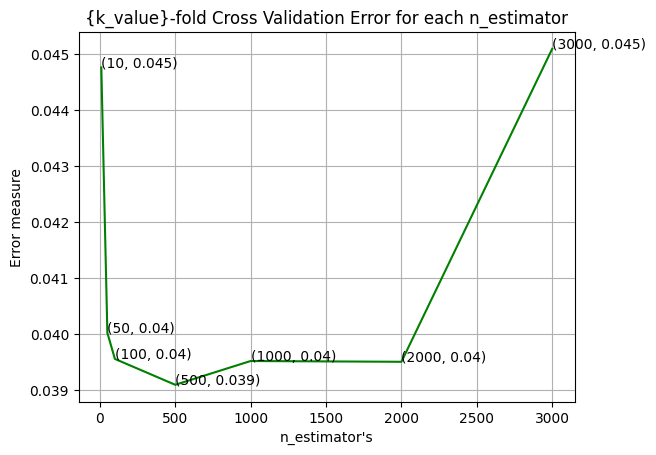

In [121]:
best_est = randomForestKfold(k_value, estimators, X_train, y_train)

log loss for train data 0.014022074316811328
log loss for Cross Validation data 0.044789588260447016
log loss for test data 0.03877271779293057
Number of misclassified points  0.78196872125115
Accuracy = 0.9921803127874885
Precision = [0.97444089 1.         0.99324324 0.97916667 1.         1.
 1.         0.99173554 0.9950495 ]
Recall = [0.99025974 1.         1.         0.98947368 0.875      0.98
 0.9875     0.97560976 0.99014778]
F1 = [0.98228663 1.         0.99661017 0.98429319 0.93333333 0.98989899
 0.99371069 0.98360656 0.99259259]
-------------------------------------------------- Confusion matrix --------------------------------------------------


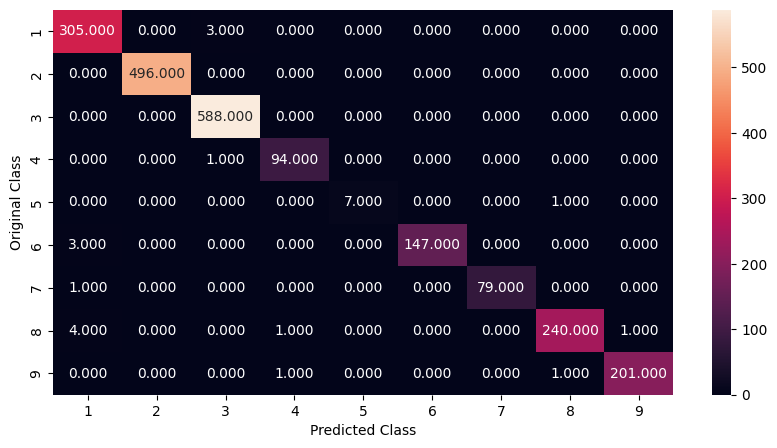

-------------------------------------------------- Precision matrix --------------------------------------------------


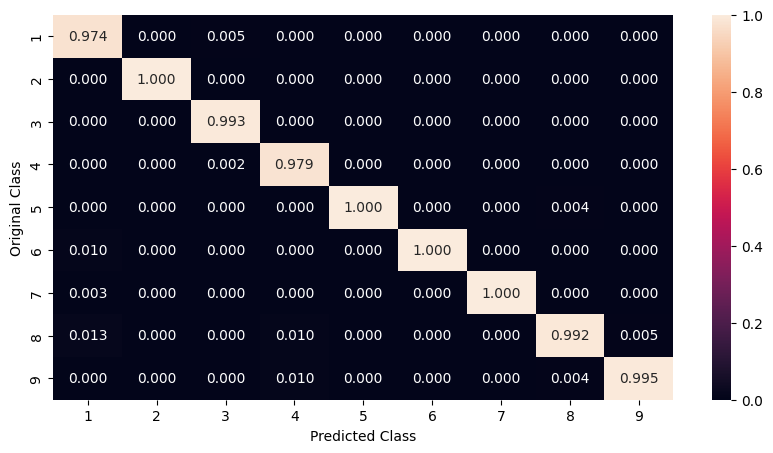

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


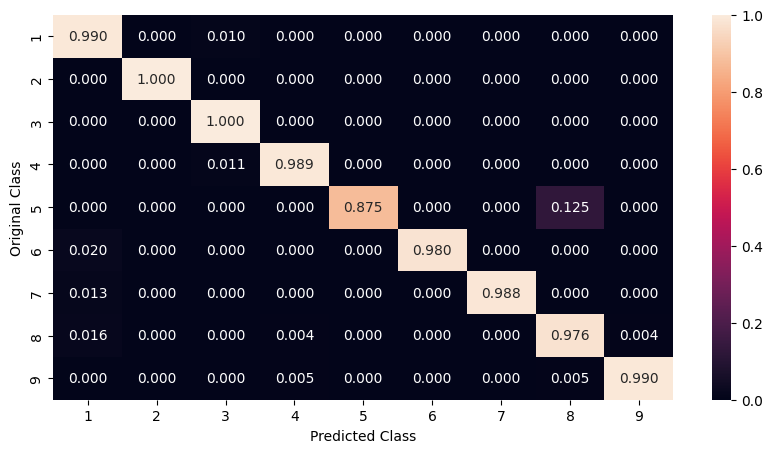

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
CPU times: total: 23.8 s
Wall time: 18.1 s


In [122]:
%%time

rf = RandomForestClassifier(n_estimators=estimators[best_est], n_jobs=-1, bootstrap=True)
rf.fit(X_train, y_train)

finalResults(rf, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.2: K fold (Oversampled Data)

5-fold Cross Validation Log losses
n_estimator= 10 , mean loss: 0.021691675155313644 , model losses: [0.018594856312168735, 0.02121924617255317, 0.0206361587062468, 0.028400814344045705, 0.019607300241553806]
n_estimator= 50 , mean loss: 0.01903429425311589 , model losses: [0.014662518288547142, 0.0222361967860002, 0.01947656031584154, 0.017883260605753085, 0.020912935269437487]
n_estimator= 100 , mean loss: 0.020028026441629175 , model losses: [0.0180899326800358, 0.023315581958900333, 0.020677622998949364, 0.02108349168889208, 0.0169735028813683]
n_estimator= 500 , mean loss: 0.01966948686956619 , model losses: [0.0241685660421417, 0.02029937447124117, 0.020114818542637542, 0.020523948791438148, 0.013240726500372377]
n_estimator= 1000 , mean loss: 0.0196189662920134 , model losses: [0.020277848746767177, 0.01790223466356273, 0.024125487536473464, 0.015824353188842812, 0.01996490732442083]
n_estimator= 2000 , mean loss: 0.020288718205041613 , model losses: [0.017966470049029036, 0.017

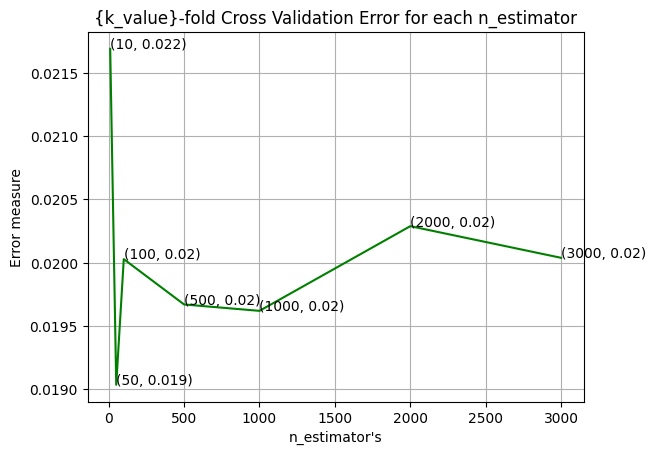

In [123]:
best_est = randomForestKfold(k_value, estimators, oX_train, oy_train)

In [124]:
rf = RandomForestClassifier(n_estimators=estimators[best_est], n_jobs=-1, bootstrap=True)
rf.fit(oX_train, oy_train)

RandomForestClassifier(n_estimators=50, n_jobs=-1)

log loss for train data 0.006748145293753263
log loss for Cross Validation data 0.021619927260439785
log loss for test data 0.01986138314880739
Number of misclassified points  0.3776435045317221
Accuracy = 0.9962235649546828
Precision = [0.98157454 1.         0.99830508 0.99661017 1.         1.
 1.         0.98977853 1.        ]
Recall = [0.99659864 1.         1.         0.99830221 1.         0.99319728
 0.99151104 0.98809524 0.99829932]
F1 = [0.98902954 1.         0.99915182 0.99745547 1.         0.99658703
 0.99573743 0.98893617 0.99914894]
-------------------------------------------------- Confusion matrix --------------------------------------------------


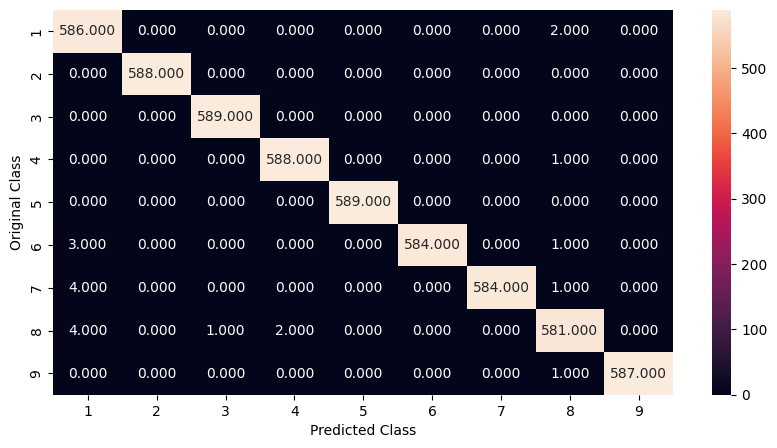

-------------------------------------------------- Precision matrix --------------------------------------------------


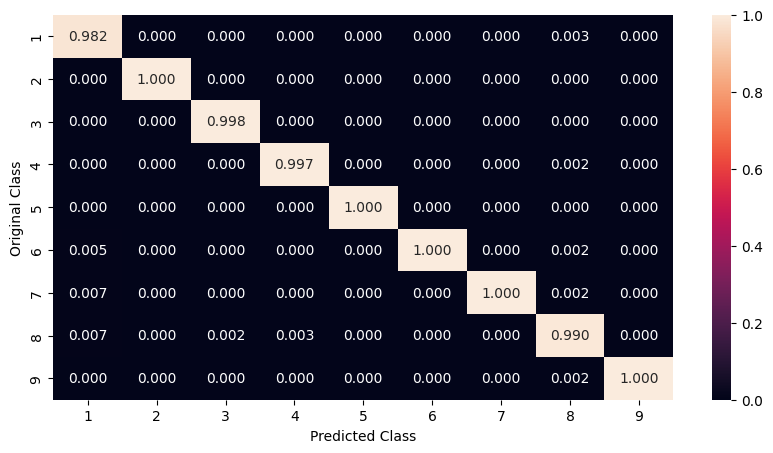

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


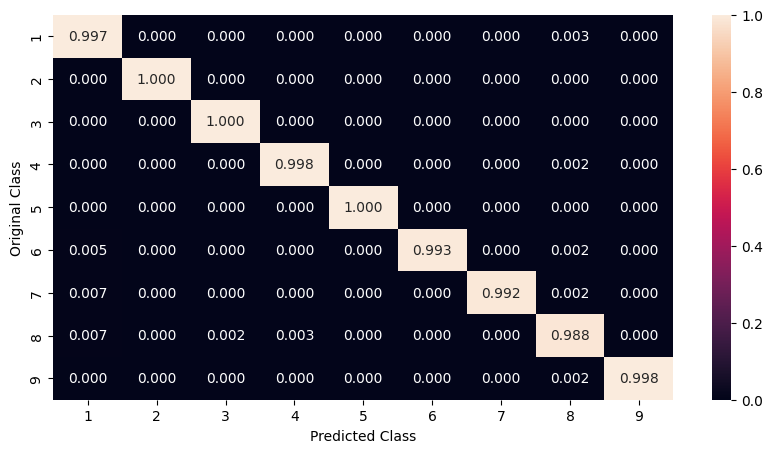

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [126]:
finalResults(rf, k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

#### 3.2.3: Random Search CV(Original Data)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Best Parameters: {'n_estimators': 100, 'max_depth': 10, 'criterion': 'gini'}

log loss for train data 0.0260900597680857
log loss for Cross Validation data 0.0599643211527398
log loss for test data 0.055176162886625295
Number of misclassified points  1.011959521619135
Accuracy = 0.9898804047838087
Precision = [0.96518987 1.         0.99324324 0.97916667 1.         0.99319728
 1.         0.98755187 0.995     ]
Recall = [0.99025974 1.         1.         0.98947368 0.875      0.97333333
 0.9875     0.96747967 0.98029557]
F1 = [0.9775641  1.         0.99661017 0.98429319 0.93333333 0.98316498
 0.99371069 0.97741273 0.98759305]
-------------------------------------------------- Confusion matrix --------------------------------------------------


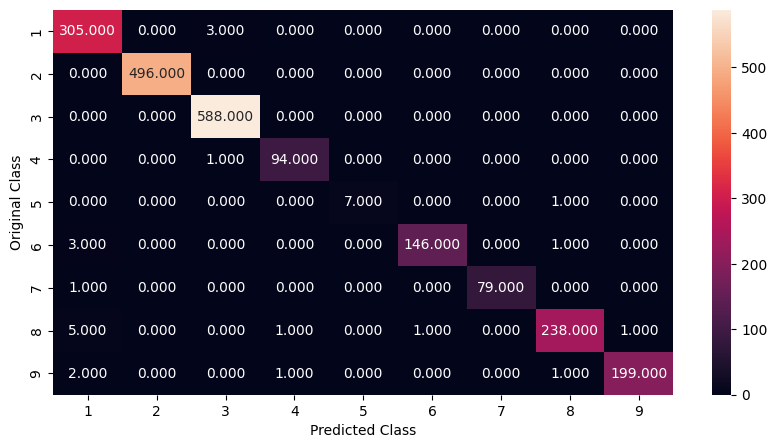

-------------------------------------------------- Precision matrix --------------------------------------------------


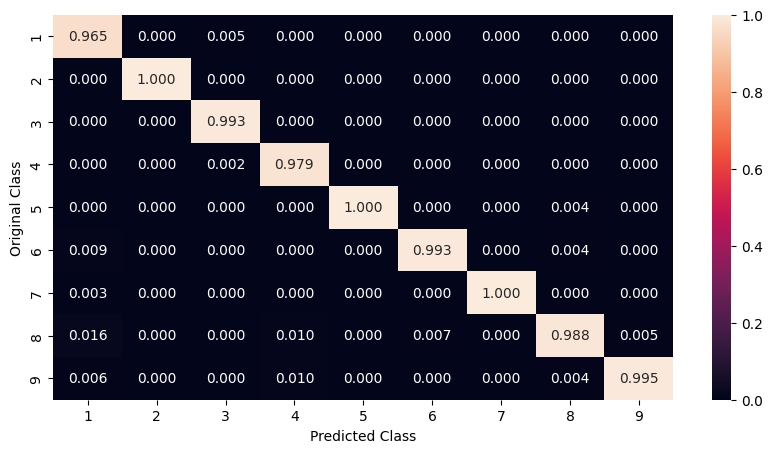

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


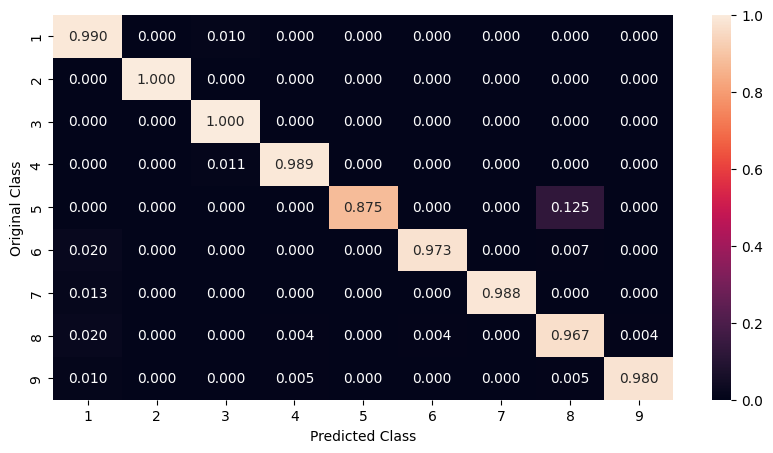

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [129]:
randomForestRandomCV(10, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.4: Random Search CV(Oversampled Data)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 2000, 'max_depth': 10, 'criterion': 'log_loss'}

log loss for train data 0.009479169621594091
log loss for Cross Validation data 0.021457747827899595
log loss for test data 0.02341471301239524
Number of misclassified points  0.5287009063444109
Accuracy = 0.9947129909365559
Precision = [0.97662771 1.         0.99830508 0.98991597 1.         1.
 0.99829352 0.98965517 1.        ]
Recall = [0.99489796 0.99829932 1.         1.         1.         0.99319728
 0.99320883 0.97619048 0.99659864]
F1 = [0.98567818 0.99914894 0.99915182 0.99493243 1.         0.99658703
 0.99574468 0.98287671 0.99829642]
-------------------------------------------------- Confusion matrix --------------------------------------------------


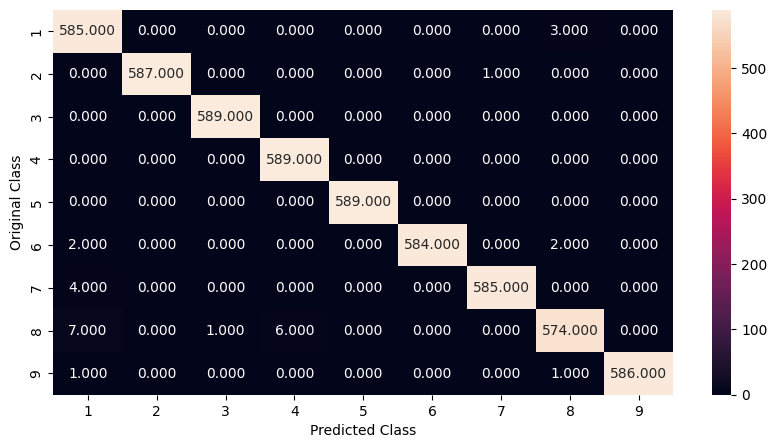

-------------------------------------------------- Precision matrix --------------------------------------------------


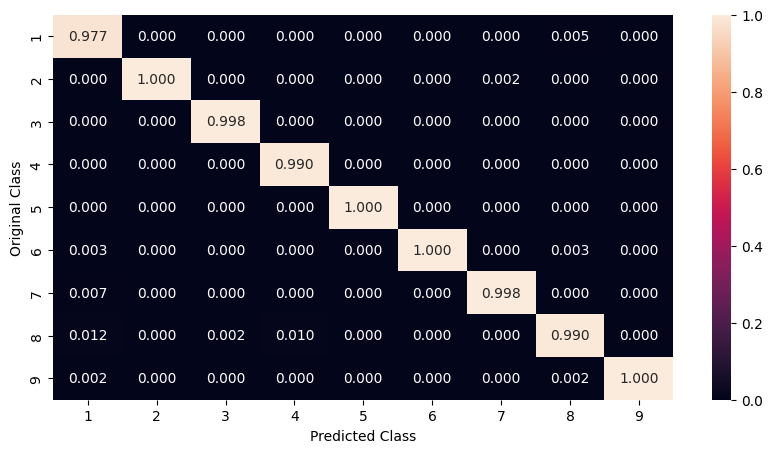

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


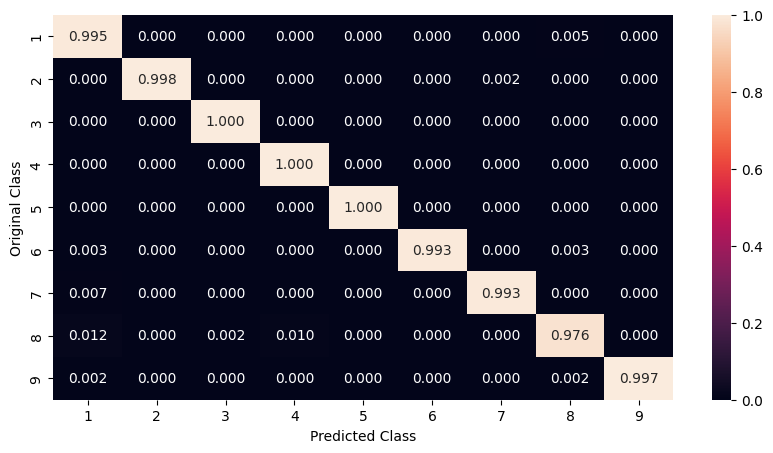

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [130]:
randomForestRandomCV(k_value,  oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

#### 3.2.5: Grid Search CV(Original Data)

Fitting 5 folds for each of 63 candidates, totalling 315 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': 10, 'n_estimators': 100}

log loss for train data 0.015595343987021554
log loss for Cross Validation data 0.048750565739857615
log loss for test data 0.04197319462195467
Number of misclassified points  0.8739650413983441
Accuracy = 0.9912603495860166
Precision = [0.97444089 1.         0.99324324 0.96907216 1.         1.
 1.         0.98755187 0.9950495 ]
Recall = [0.99025974 1.         1.         0.98947368 0.875      0.98
 0.9875     0.96747967 0.99014778]
F1 = [0.98228663 1.         0.99661017 0.97916667 0.93333333 0.98989899
 0.99371069 0.97741273 0.99259259]
-------------------------------------------------- Confusion matrix --------------------------------------------------


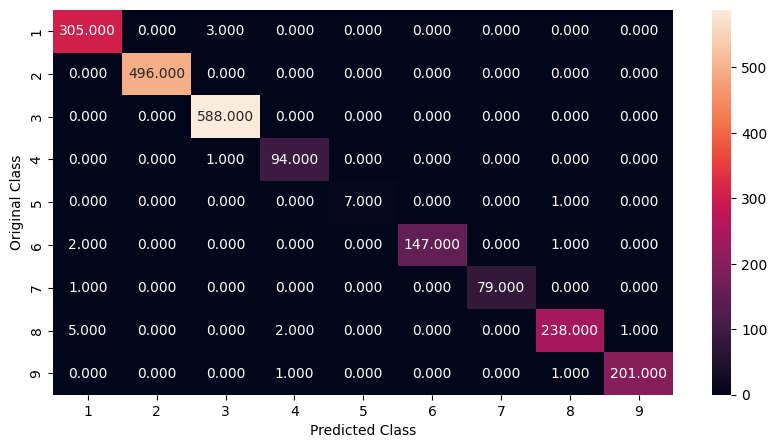

-------------------------------------------------- Precision matrix --------------------------------------------------


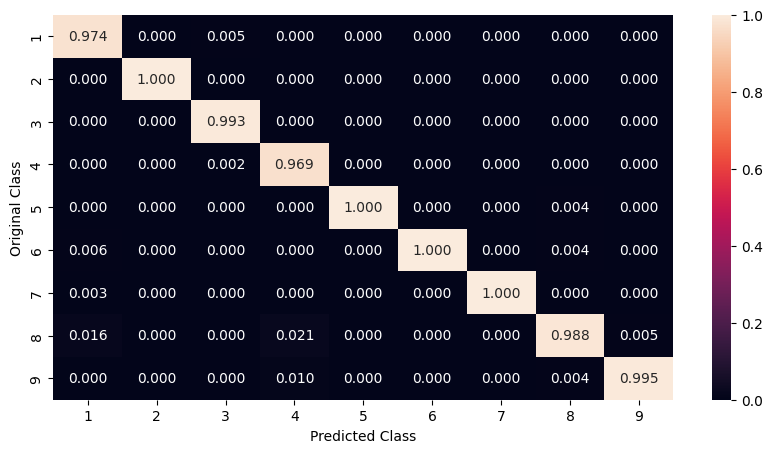

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


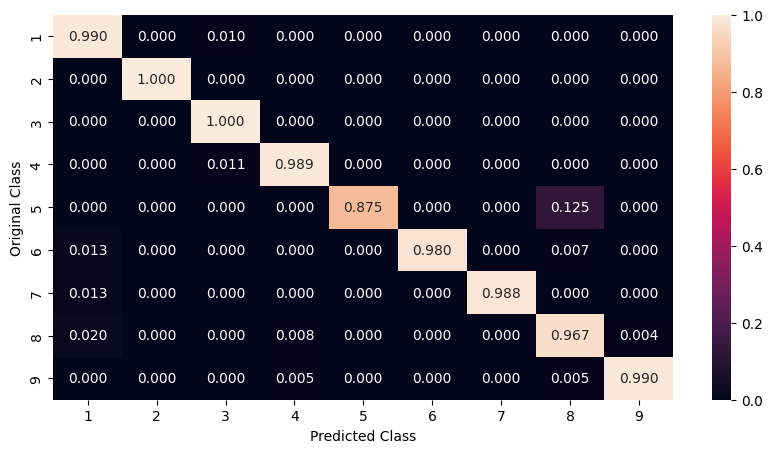

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [131]:
randomForestGridCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.6: Grid Search CV(Oversampled Data)

Fitting 5 folds for each of 63 candidates, totalling 315 fits
Best Parameters: {'criterion': 'log_loss', 'max_depth': 10, 'n_estimators': 100}

log loss for train data 0.00960732555522552
log loss for Cross Validation data 0.021272496341537626
log loss for test data 0.023309621494339385
Number of misclassified points  0.547583081570997
Accuracy = 0.99452416918429
Precision = [0.97342193 1.         0.99830508 0.98991597 1.         1.
 0.99829352 0.99133449 1.        ]
Recall = [0.99659864 0.99829932 1.         1.         1.         0.99319728
 0.99320883 0.97278912 0.99659864]
F1 = [0.98487395 0.99914894 0.99915182 0.99493243 1.         0.99658703
 0.99574468 0.98197425 0.99829642]
-------------------------------------------------- Confusion matrix --------------------------------------------------


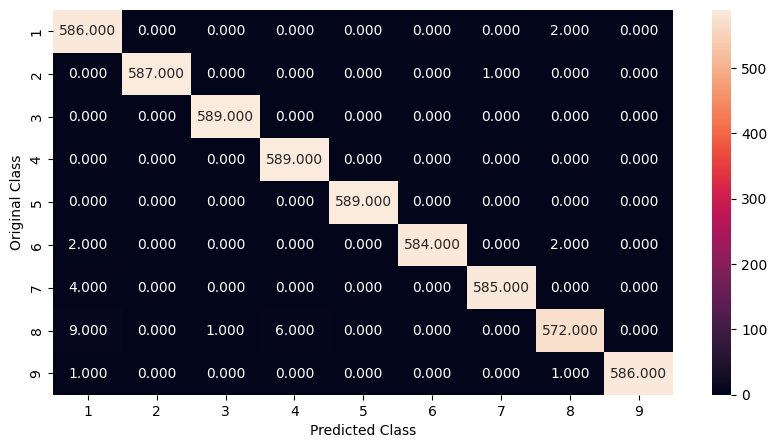

-------------------------------------------------- Precision matrix --------------------------------------------------


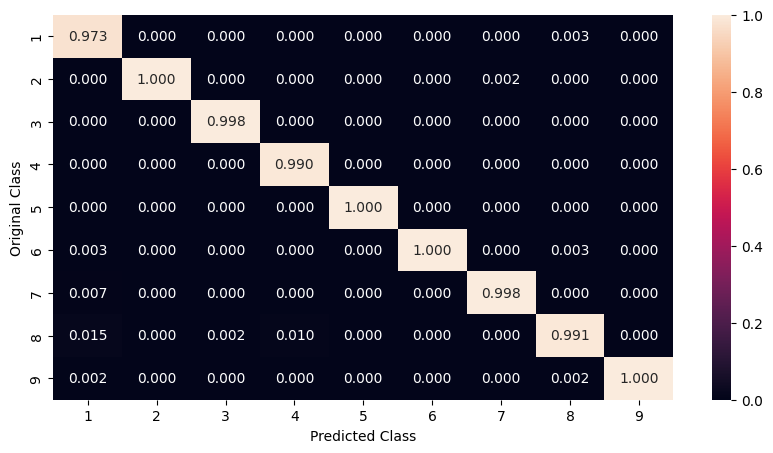

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


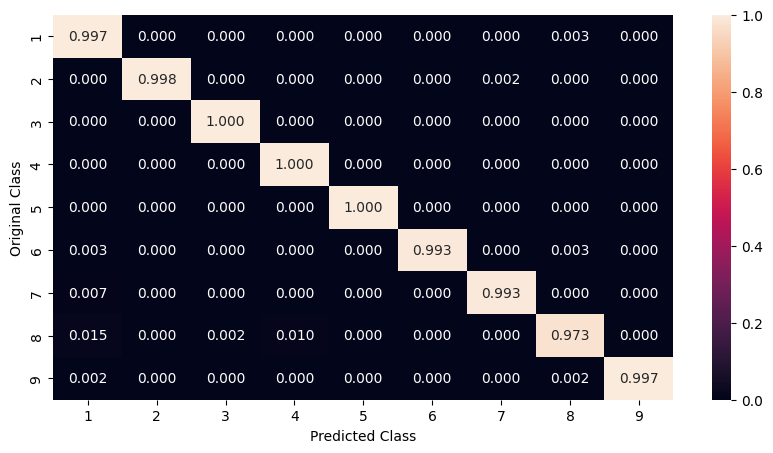

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [132]:
randomForestGridCV(k_value,  oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

### 3.3: SVM Classifier

In [156]:
params={
    'C':[10 ** x for x in range(-4, 6)],
    'gamma' : [0.01,1],
    'degree' : [1,3,5,7],
    'kernel' : ["linear","poly","rbf","sigmoid"]
}

cv_value = 5

print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(asm_df, False, 'asm')

print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(asm_df, True, 'asm')

Original Data:
Original dataset shape (10868, 49) (10868,)
Resample dataset shape (10868, 49) (10868,)

Oversampled Data:
Original dataset shape (10868, 49) (10868,)
Resample dataset shape (26478, 49) (26478,)


#### 3.3.1: K fold(Original Data)

5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.610392424279723 , model losses: [1.5958389242018831, 1.5846805718729249, 1.6093124601748012, 1.6645343619316126, 1.5975958032173938]
C= 0.001 , mean loss: 1.6035760444561096 , model losses: [1.5685286358373443, 1.6299917337622984, 1.6039259834282358, 1.5936793515969718, 1.621754517655697]
C= 0.01 , mean loss: 1.6732972933320227 , model losses: [1.6305004992736885, 1.683154908529058, 1.7072225386499564, 1.7030458724590902, 1.6425626477483204]
C= 0.1 , mean loss: 1.568219052727195 , model losses: [1.58134790122472, 1.5759658464592923, 1.624467705658776, 1.494801023791507, 1.5645127865016804]
C= 1 , mean loss: 1.3941366103644075 , model losses: [1.3581303800784585, 1.3955759761221422, 1.3660175027156656, 1.380515839183726, 1.4704433537220454]
C= 10 , mean loss: 1.0901789244734417 , model losses: [1.108370259825523, 1.0831703098361931, 1.095155810959523, 1.0548804409055434, 1.109317800840426]
C= 100 , mean loss: 0.9581679815953013

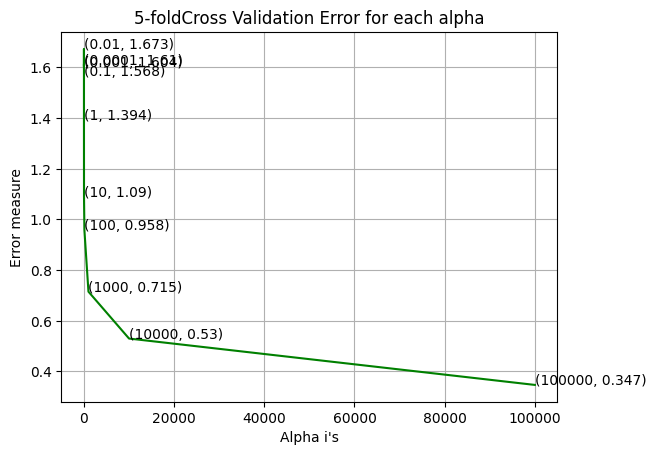

In [157]:
best_c = svmKfold(k_value, c_values, X_train, y_train)

log loss for train data 0.2769906460646257
log loss for Cross Validation data 0.3508519312957882
log loss for test data 0.33734298257815365
Proportion of misclassified points  0.04231830726770929
Accuracy = 0.9576816927322908
Precision = [0.9218241  0.99173554 0.9914966  0.93478261 0.83333333 0.97986577
 0.74285714 0.94420601 0.95714286]
Recall = [0.91883117 0.96774194 0.9914966  0.90526316 0.625      0.97333333
 0.975      0.89430894 0.99014778]
F1 = [0.9203252  0.97959184 0.9914966  0.9197861  0.71428571 0.97658863
 0.84324324 0.91858038 0.97336562]
-------------------------------------------------- Confusion matrix --------------------------------------------------


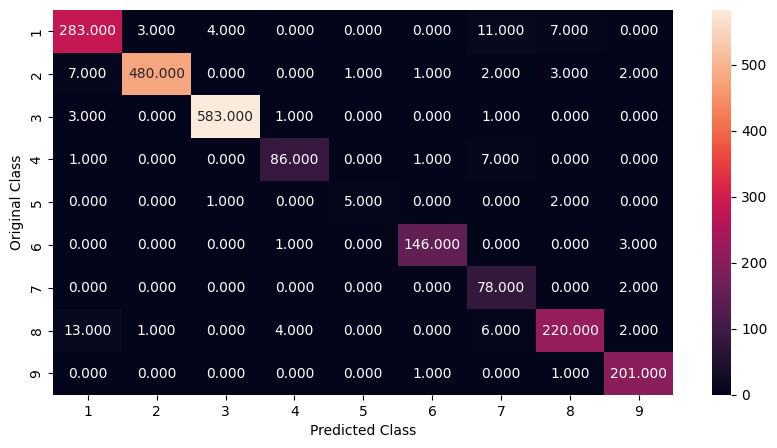

-------------------------------------------------- Precision matrix --------------------------------------------------


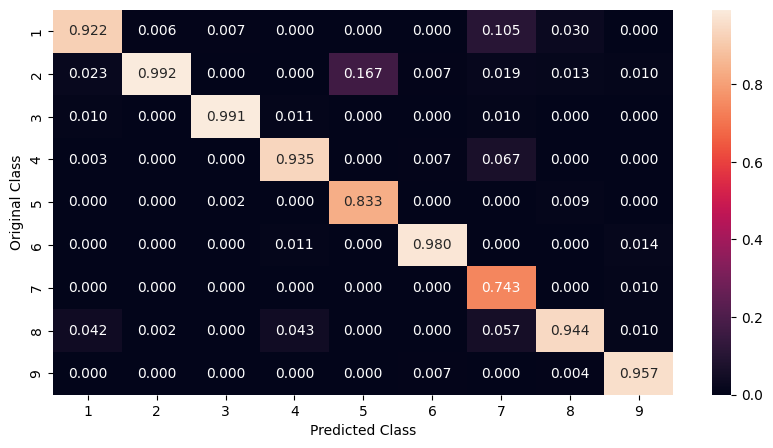

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


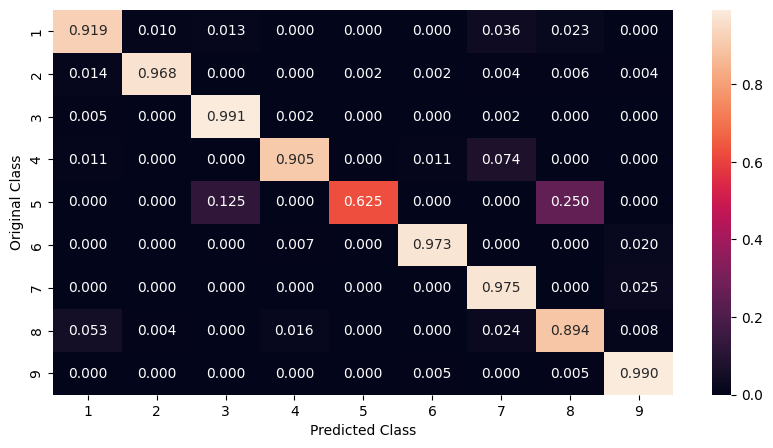

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [158]:
svm = SVC(C=c_values[best_c], class_weight='balanced')
svm.fit(X_train,y_train)
finalResults(svm, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.3.2: K fold (Oversampled Data)

5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.8725615606972834 , model losses: [1.9069191248552086, 1.882096778952122, 1.8494344722341325, 1.8341678151223169, 1.890189612322637]
C= 0.001 , mean loss: 1.8620806486451813 , model losses: [1.8719402446594853, 1.8579283214837474, 1.8960606881313549, 1.8326266568232505, 1.851847332128068]
C= 0.01 , mean loss: 1.930516511605326 , model losses: [1.9235242155750285, 1.9456674220235504, 1.9359388879407418, 1.935632001427833, 1.9118200310594766]
C= 0.1 , mean loss: 1.6921917245096771 , model losses: [1.6784345793669797, 1.6869602865569508, 1.7184729012274298, 1.6808591824811399, 1.6962316729158862]
C= 1 , mean loss: 1.5393728001920466 , model losses: [1.5270444180525087, 1.5512283017406747, 1.5482049814072787, 1.5450079715061915, 1.525378328253579]
C= 10 , mean loss: 1.1867876869566443 , model losses: [1.1697908973053213, 1.2141779701897866, 1.1630767126410406, 1.2109060372600855, 1.1759868173869872]
C= 100 , mean loss: 0.9323553849

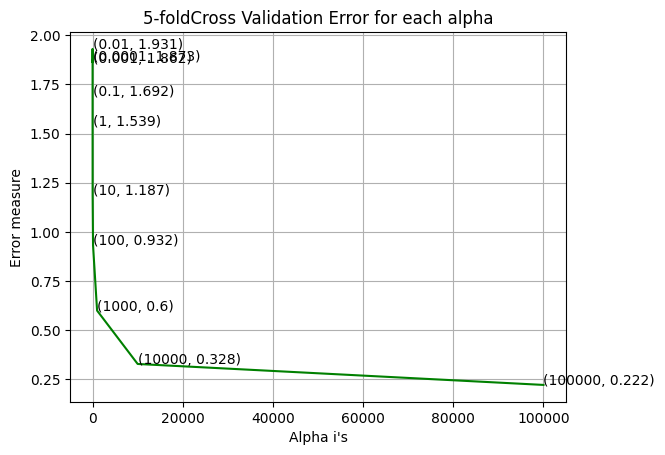

In [159]:
best_c = svmKfold(k_value, c_values, oX_train, oy_train)

In [160]:
svm = SVC(C=c_values[best_c], class_weight='balanced')
svm.fit(oX_train,oy_train)

SVC(C=100000, class_weight='balanced')

log loss for train data 0.17541123700318703
log loss for Cross Validation data 0.1977909011166496
log loss for test data 0.24344158586051778
Proportion of misclassified points  0.027945619335347432
Accuracy = 0.9720543806646526
Precision = [0.92307692 0.99472759 0.99490662 0.90625    0.98484848 0.99309154
 0.99649737 0.97644928 0.98815567]
Recall = [0.95918367 0.96258503 0.99490662 0.98639456 0.99320883 0.9762309
 0.96604414 0.91666667 0.99319728]
F1 = [0.94078399 0.97839239 0.99490662 0.94462541 0.98901099 0.98458904
 0.98103448 0.94561404 0.99067006]
-------------------------------------------------- Confusion matrix --------------------------------------------------


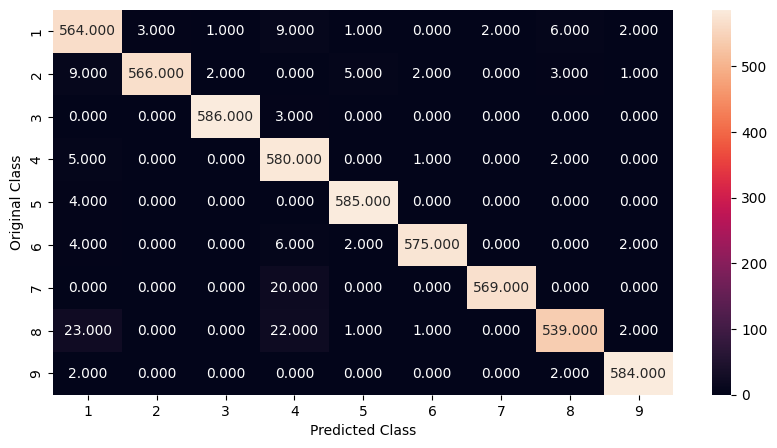

-------------------------------------------------- Precision matrix --------------------------------------------------


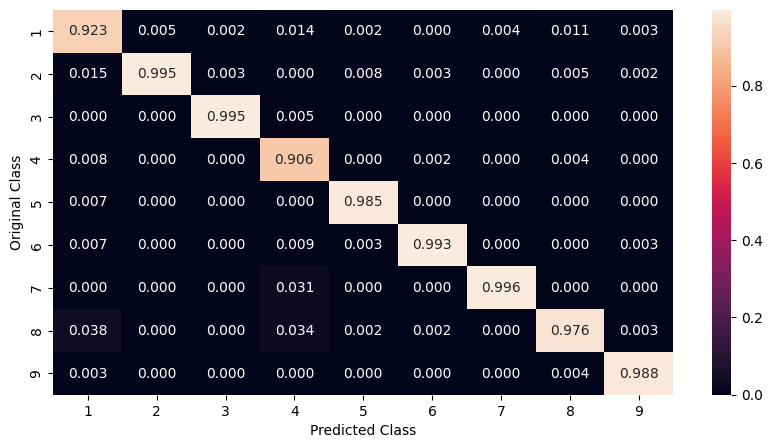

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


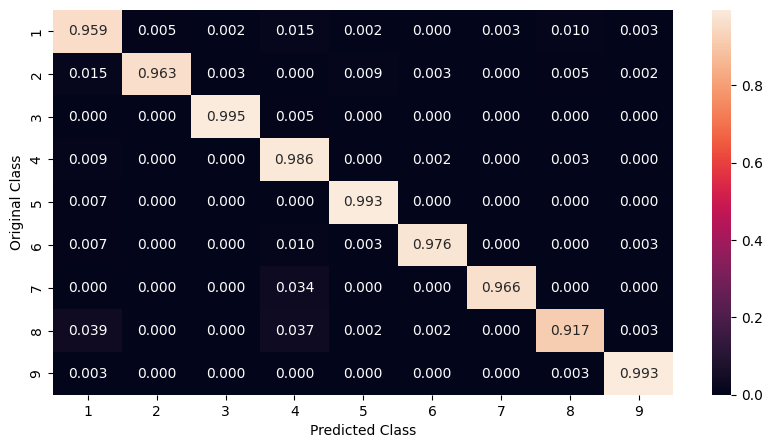

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [163]:
finalResults(svm, k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

#### 3.3.3: Random Search CV(Original Data)

In [164]:
svmRandomCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


#### 3.3.4: Random Search CV(Oversampled Data)

In [ ]:
svmRandomCV(k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

#### 3.3.5: Grid Search CV(Original Data)

In [ ]:
svmGridCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.3.6: Grid Search CV(Oversampled Data)

In [ ]:
svmRandomCV(k_value, oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

## Analysyis Over combined features


In [ ]:
byte_df = pd.read_csv('train/' + 'byteFeatures.csv')
asm_df = pd.read_csv('train/' + 'asmFeatures.csv')
byte_df = byte_df.rename(columns={'size': 'bytesize', 'name':'Id'})
byte_df = byte_df.drop(['Class'], axis=1)
asm_df = asm_df.rename(columns={'size': 'asmsize'})
merg_df = pd.merge(asm_df, byte_df, on = 'Id')


#### Shapes of Data used in the traininng

In [ ]:
#merg_df = pd.read_csv('train/' + 'byteFeatures.csv')
_, _, _, _, _, _ = splitTest(merg_df, False, 'byte')
_, _, _, _, _, _ = splitTest(merg_df, True, 'byte')

Original dataset shape (10868, 310) (10868,)
Resample dataset shape (10868, 310) (10868,)
Original dataset shape (10868, 310) (10868,)
Resample dataset shape (26478, 310) (26478,)


#### Plot distribution

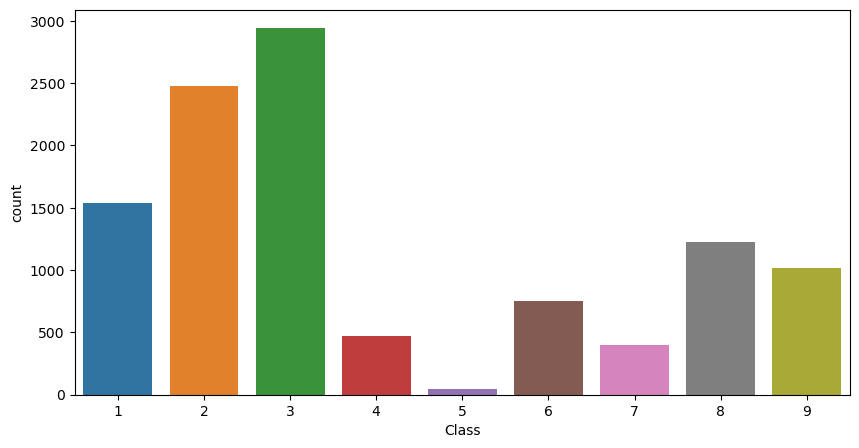

In [ ]:
def plotDistribution(df):
    plt.close()
    plt.figure(figsize=(10, 5))
    sns.countplot(x="Class", data=df)
    plt.show()

plotDistribution(merg_df)

Percentage of 3 is: 27.07 %
Percentage of 2 is: 22.8 %
Percentage of 1 is: 14.18 %
Percentage of 8 is: 11.3 %
Percentage of 9 is: 9.32 %
Percentage of 6 is: 6.91 %
Percentage of 4 is: 4.37 %
Percentage of 7 is: 3.66 %
Percentage of 5 is: 0.39 %



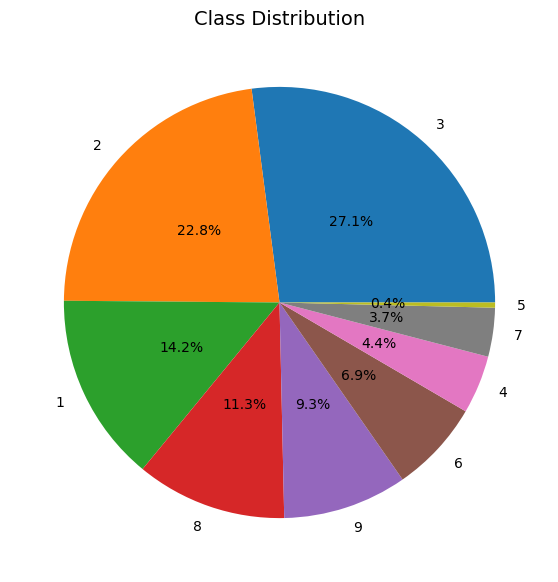

In [ ]:
def plotDistribution(df):
  counts = df['Class'].value_counts().to_dict()
  labels = counts.keys()
  values = counts.values()
  labels = [k for k in counts.keys()]
  values   = [float(v) for v in counts.values()]
  for i in range(len(values)):
    print("Percentage of", labels[i], "is:", round(100 * values[i]/sum(values), 2),"%")
  print()

  plt.figure(figsize=(7,7))
  plt.pie(x = values, labels = labels, autopct="%.1f%%", pctdistance=0.5)
  plt.title("Class Distribution", fontsize=14)
  plt.show()

plotDistribution(merg_df)


#### Null Values check

In [ ]:
print(merg_df.isnull().sum())

Id          0
HEADER:     0
.text:      0
.Pav:       0
.idata:     0
           ..
fd          0
fe          0
ff          0
??          0
bytesize    0
Length: 312, dtype: int64


In [ ]:
merg_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10868 entries, 0 to 10867
Columns: 312 entries, Id to bytesize
dtypes: float64(1), int64(310), object(1)
memory usage: 26.0+ MB


#### Heat map showing missing values

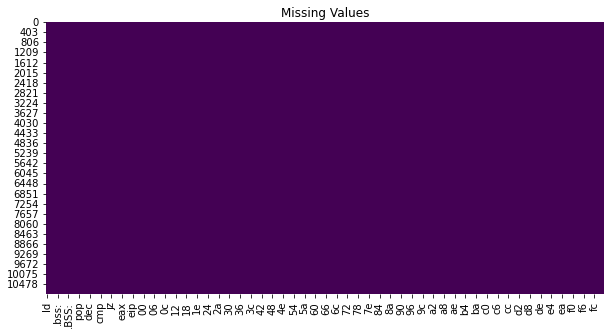

In [ ]:
plt.figure(figsize=(10,5))
sns.heatmap(merg_df.isnull(),cbar=False,cmap='viridis')
plt.title("Missing Values")
plt.show()

#### Correlation Matrix

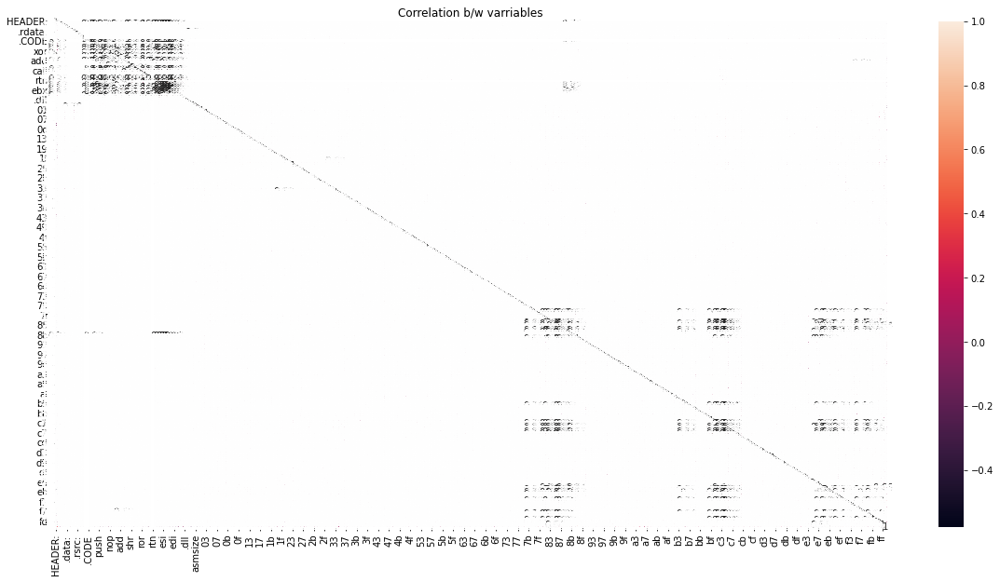

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(merg_df.iloc[:, :-1].corr(),cbar=True,annot=True)
plt.title("Correlation b/w varriables")
plt.show()

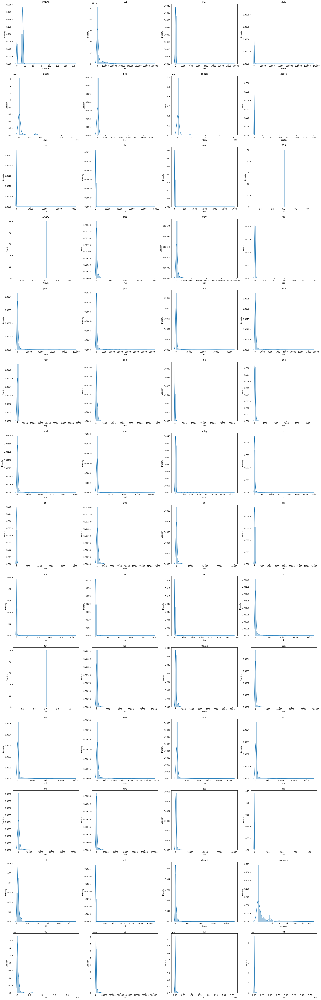

In [ ]:
fig, axes = plt.subplots(nrows = 14, ncols = 4)    # axes is 2d array (3x3)
axes = axes.flatten()         # Convert axes to 1d array of length 9
fig.set_size_inches(30, 100)
pl_df = merg_df.drop(['Id', 'Class'], axis=1)
for ax, col in zip(axes, pl_df.columns):
  sns.distplot(pl_df[col], ax = ax)
  ax.set_title(col)

In [ ]:
print("Original Data:")
X_train, y_train, X_cv, y_cv, X_test, y_test = splitTest(merg_df, False, 'asm')

print("\nOversampled Data:")
oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test = splitTest(merg_df, True, 'asm')

Original Data:
Original dataset shape (10868, 307) (10868,)
Resample dataset shape (10868, 307) (10868,)

Oversampled Data:
Original dataset shape (10868, 307) (10868,)
Resample dataset shape (26478, 307) (26478,)


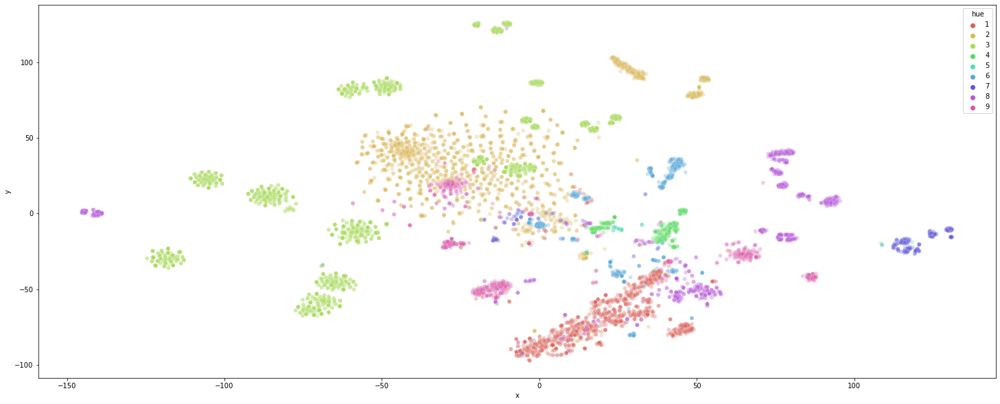

In [ ]:
t_data = trainTsne(X_train)
plotTsne(y_train, t_data)

Original dataset shape (10868, 307) (10868,)
Resample dataset shape (26478, 307) (26478,)


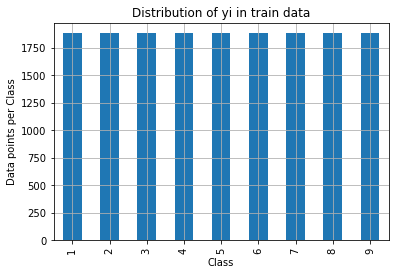

Number of data points in class 2 : 1883 ( 11.112 %)
Number of data points in class 3 : 1883 ( 11.112 %)
Number of data points in class 4 : 1883 ( 11.112 %)
Number of data points in class 6 : 1883 ( 11.112 %)
Number of data points in class 7 : 1883 ( 11.112 %)
Number of data points in class 8 : 1883 ( 11.112 %)
Number of data points in class 9 : 1883 ( 11.112 %)
Number of data points in class 1 : 1882 ( 11.107 %)
Number of data points in class 5 : 1882 ( 11.107 %)


In [ ]:
oversampledDistribution(merg_df, 'asm')

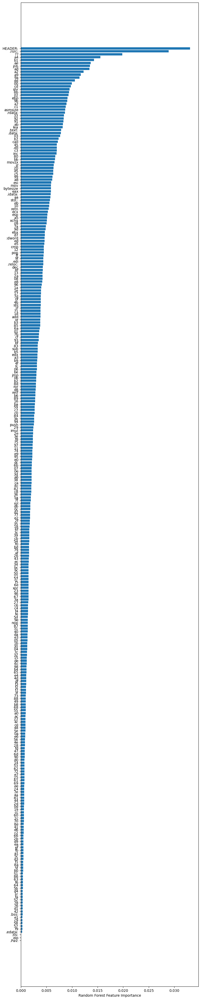

In [ ]:
columns, importance =  getFeatureImportance(X_train, y_train)

In [ ]:
k_value = 5
c_values = [10 ** x for x in range(-4, 6)]

In [ ]:
print(importance)

[6.77950807e-07 4.16107508e-06 3.96803053e-05 2.46222137e-04
 2.87312729e-04 2.91342763e-04 2.96693277e-04 3.05906227e-04
 3.10860106e-04 3.32412115e-04 3.32610039e-04 3.36865869e-04
 3.41285440e-04 3.45462166e-04 3.57616841e-04 3.58267385e-04
 3.58302137e-04 3.73576270e-04 3.85005837e-04 3.94530908e-04
 3.95799431e-04 3.99497248e-04 4.08968554e-04 4.25608360e-04
 4.56635429e-04 4.77686857e-04 4.78139901e-04 4.79186934e-04
 4.83301030e-04 4.84813740e-04 4.85009709e-04 4.91996832e-04
 5.04324601e-04 5.11621367e-04 5.18458979e-04 5.19180439e-04
 5.27925343e-04 5.30819766e-04 5.31937612e-04 5.73849705e-04
 5.77300204e-04 5.81564383e-04 5.89684244e-04 5.90077394e-04
 6.11939157e-04 6.26843409e-04 6.30050467e-04 6.30372015e-04
 6.33287655e-04 6.40149000e-04 6.42459863e-04 6.64622429e-04
 6.68693185e-04 6.70666300e-04 6.80476632e-04 6.83133538e-04
 6.87824432e-04 6.88448415e-04 7.02629284e-04 7.11495415e-04
 7.12950216e-04 7.22375908e-04 7.26041476e-04 7.43073171e-04
 7.44332927e-04 7.650442

In [ ]:
# X_train, y_train, X_test, y_test = splitTest(merg_df, False)
# oX_train, oy_train, oX_test, oy_test = splitTest(merg_df, True)

for i in range(len(importance)):
    if  importance[i] > 1e-3:
        index = i
        break
print(index)

to_drop = columns[0:index]
X_train = X_train.drop(columns=to_drop)
oX_train = oX_train.drop(columns=to_drop)
X_test = X_test.drop(columns=to_drop)
oX_test = oX_test.drop(columns=to_drop)
X_cv = X_cv.drop(columns=to_drop)
oX_cv = oX_cv.drop(columns=to_drop)

X_train.head()

87


,HEADER:,.text:,.idata:,.data:,.rdata:,.rsrc:,.reloc:,jmp,mov,retf,...,f2,f3,f4,f5,f8,fc,fe,ff,??,bytesize
3376,0,3413,642,3491,3097227,0,0,45,738,0,...,113,178,209,124,11990,11606,12743,49225,9088,11432960
5108,0,17989,346,30937,863646,0,0,387,2632,0,...,1642,1376,1501,1039,2421,2340,2210,25853,7020,4398740
847,17,1157,140,1025,219,3,0,17,77,0,...,3175,3240,3184,3099,3180,3315,3234,6695,1497244,8507904
6507,0,13836,465,830979,39632,0,0,444,3186,0,...,1556,1360,1506,1051,2661,2238,2167,26852,12520,4370680
6596,17,2846,3,28597,55313,3,0,235,167,9,...,356,379,345,374,365,333,366,438,35384,475136


In [ ]:
print("Shape of Original train data", X_train.shape)
print("Shape of Original test data", X_test.shape)
print("Shape of oversampled train data", oX_train.shape)
print("Shape of oversampled test data", oX_test.shape)
print("Shape of cross-validation data", X_cv.shape)



Shape of Original train data (6955, 219)
Shape of Original test data (2174, 219)
Shape of oversampled train data (16945, 219)
Shape of oversampled test data (5296, 219)
Shape of cross-validation data (1739, 219)


### 3. Model Training on combined features

### 3.1: Logistic Regression

In [ ]:
k_value = 5
c_values = [10 ** x for x in range(-4, 6)]

#### 3.1.1: K fold(Original Data)

5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.1742307388560904 , model losses: [1.1469416046812977, 1.18859704990512, 1.2002621986026267, 1.1552018407314673, 1.1801510003599411]
C= 0.001 , mean loss: 1.1712350457296805 , model losses: [1.1648135127531234, 1.1616043885369969, 1.1666463227970147, 1.167183546196493, 1.195927458364775]
C= 0.01 , mean loss: 1.1776440305140752 , model losses: [1.1467331668954563, 1.1692331835984695, 1.1634133334880914, 1.235682986931881, 1.1731574816564778]
C= 0.1 , mean loss: 1.1701313332263863 , model losses: [1.1469235987407977, 1.2063088268358202, 1.156378139766498, 1.1534934950344076, 1.1875526057544084]
C= 1 , mean loss: 1.1689341008419303 , model losses: [1.2172385683618985, 1.205281625398395, 1.137425674794544, 1.1436939795696173, 1.1410306560851968]
C= 10 , mean loss: 1.1679912608533987 , model losses: [1.1411754773908482, 1.1597175696709163, 1.1951838485644763, 1.168662167544038, 1.1752172410967152]
C= 100 , mean loss: 1.1706729033518

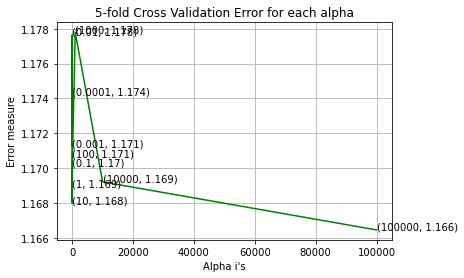

CPU times: total: 2min 2s
Wall time: 1min 31s


In [ ]:
%%time
best_c = logisticRegressionKfold(k_value, c_values, X_train, y_train)

log loss for train data 1.176465658610258
log loss for Cross Validation data 1.1675287859862105
log loss for test data 1.1704111269288326
Number of misclassified points  39.46642134314627
Accuracy = 0.6053357865685373
Precision = [0.31850117 0.70334928 0.88536953 0.         0.         0.
 0.         0.         0.53333333]
Recall = [0.88311688 0.8891129  0.99829932 0.         0.         0.
 0.         0.         0.07881773]
F1 = [0.46815835 0.78539626 0.93844924 0.         0.         0.
 0.         0.         0.13733906]
-------------------------------------------------- Confusion matrix --------------------------------------------------


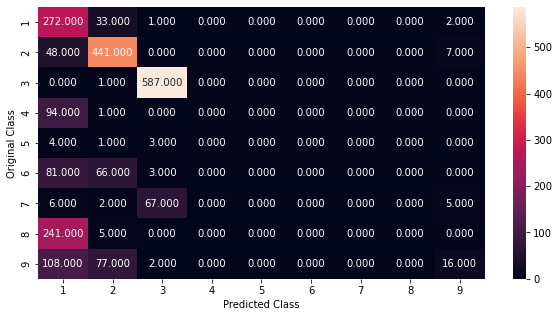

-------------------------------------------------- Precision matrix --------------------------------------------------


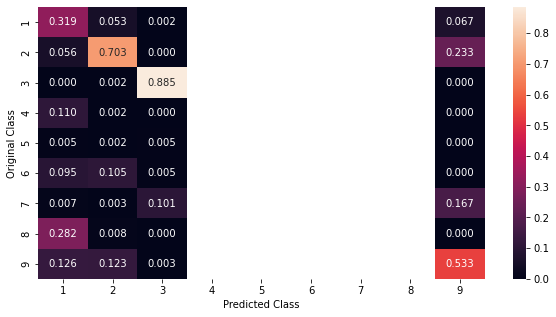

Sum of columns in precision matrix [ 1.  1.  1. nan nan nan nan nan  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


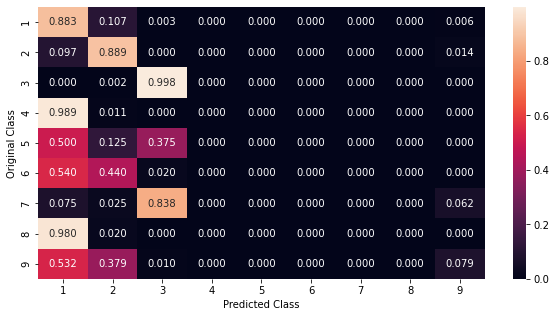

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
CPU times: total: 4.62 s
Wall time: 4.04 s


In [ ]:
%%time

lr=LR(penalty='l2',C=c_values[best_c],class_weight='balanced')
lr.fit(X_train,y_train)

finalResults(lr, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.1.2: K fold (Oversampled Data)

In [ ]:
oX_cv.shape

(4237, 219)

5-fold Cross Validation Log losses
C= 0.0001 , mean loss: 1.5338428037706167 , model losses: [1.5428722759142903, 1.5426327013299164, 1.518577484064548, 1.552939758018063, 1.512191799526266]
C= 0.001 , mean loss: 1.528909240233233 , model losses: [1.4967783895840228, 1.5549873892771446, 1.5404756190081248, 1.5315553983554187, 1.5207494049414543]
C= 0.01 , mean loss: 1.5333774168191099 , model losses: [1.5197073526085896, 1.5363979550624343, 1.5359002563757276, 1.5347185662426825, 1.5401629538061155]
C= 0.1 , mean loss: 1.5326344061615014 , model losses: [1.5164503935641396, 1.555031725674861, 1.5184357644623092, 1.5426157566370802, 1.5306383904691185]
C= 1 , mean loss: 1.5328895171773242 , model losses: [1.5538467071733288, 1.5254956362788035, 1.5182973895171585, 1.5241978157445233, 1.5426100371728069]
C= 10 , mean loss: 1.5326713891537644 , model losses: [1.5268246832483428, 1.549887685068935, 1.5316187638230552, 1.5292458304086258, 1.5257799832198637]
C= 100 , mean loss: 1.5324478002

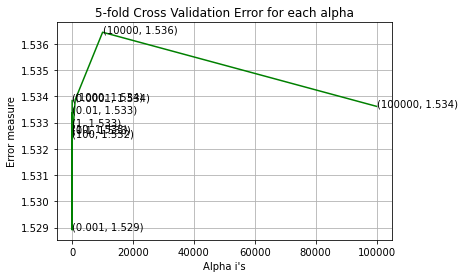

In [ ]:
best_c = logisticRegressionKfold(k_value, c_values, oX_train, oy_train)

In [ ]:
lr=LR(penalty='l2',C=c_values[best_c],class_weight='balanced')
lr.fit(X_train,y_train)

LogisticRegression(C=0.001, class_weight='balanced')

In [ ]:
oX_train.shape


(16945, 220)

log loss for train data 1.5293451108473708
log loss for Cross Validation data 1.5376484832130435
log loss for test data 1.3518045436573518
Number of misclassified points  30.910763569457224
Accuracy = 0.6908923643054278
Precision = [0.57575758 0.9654321  0.99143836 0.         0.2        0.09589041
 0.85897436 0.4032634  0.42713568]
Recall = [0.37012987 0.78830645 0.98469388 0.         0.125      0.04666667
 0.8375     0.70325203 0.83743842]
F1 = [0.45059289 0.86792453 0.98805461 0.         0.15384615 0.06278027
 0.84810127 0.51259259 0.56572379]
-------------------------------------------------- Confusion matrix --------------------------------------------------


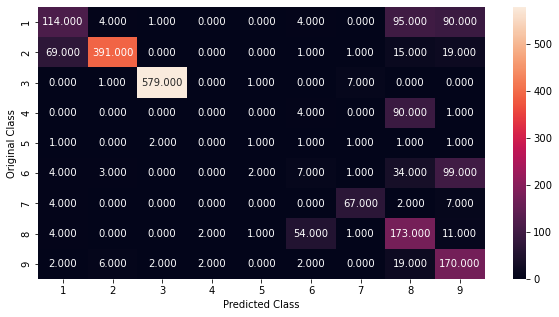

-------------------------------------------------- Precision matrix --------------------------------------------------


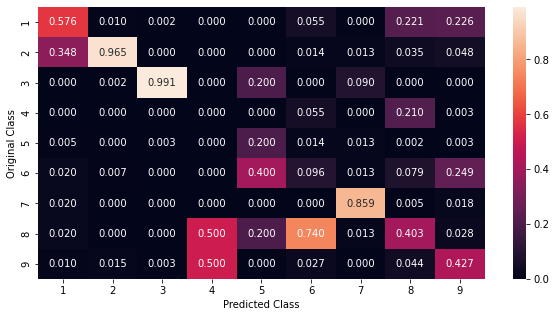

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


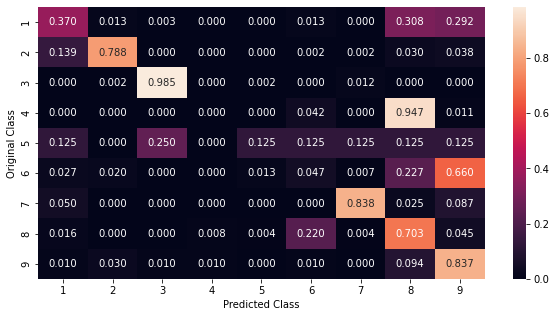

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
finalResults(lr, k_value, oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

#### 3.1.3: Random Search CV(Original Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'penalty': 'l2', 'C': 0.01}
log loss for train data 1.1765627294007872
log loss for Cross Validation data 1.167716577522501
log loss for test data 1.1704313574853018
Number of misclassified points  39.42042318307268
Accuracy = 0.6057957681692733
Precision = [0.31929825 0.70447284 0.88536953 0.         0.         0.
 0.         0.         0.53333333]
Recall = [0.88636364 0.8891129  0.99829932 0.         0.         0.
 0.         0.         0.07881773]
F1 = [0.46947549 0.78609626 0.93844924 0.         0.         0.
 0.         0.         0.13733906]
-------------------------------------------------- Confusion matrix --------------------------------------------------


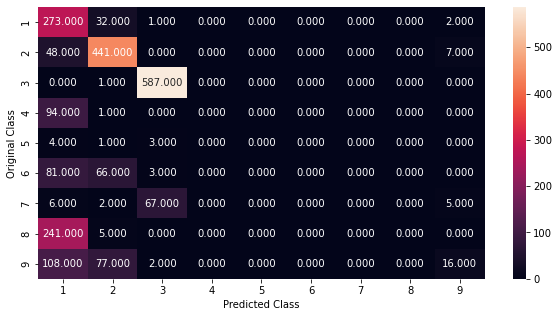

-------------------------------------------------- Precision matrix --------------------------------------------------


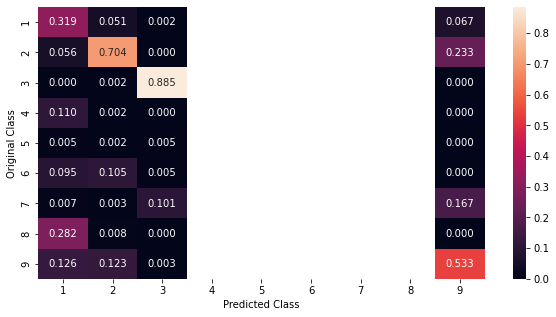

Sum of columns in precision matrix [ 1.  1.  1. nan nan nan nan nan  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


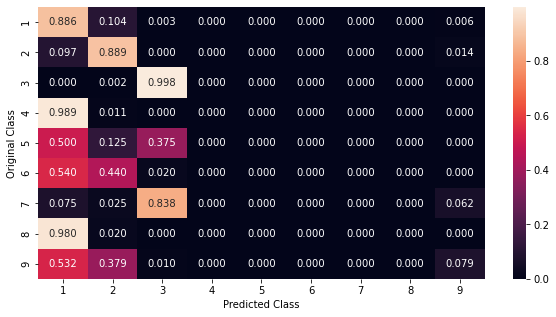

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
logisticRegressionRandom(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.1.4: Random Search CV(Oversampled Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'penalty': 'l2', 'C': 1}
log loss for train data 1.5336264809861466
log loss for Cross Validation data 1.5414936224310443
log loss for test data 1.357035769890339
Number of misclassified points  31.508739650413986
Accuracy = 0.6849126034958601
Precision = [0.61463415 0.91803279 0.99143836 0.         0.14285714 0.08433735
 0.85185185 0.39351852 0.41310541]
Recall = [0.40909091 0.79032258 0.98469388 0.         0.125      0.04666667
 0.8625     0.69105691 0.71428571]
F1 = [0.49122807 0.84940412 0.98805461 0.         0.13333333 0.06008584
 0.85714286 0.50147493 0.5234657 ]
-------------------------------------------------- Confusion matrix --------------------------------------------------


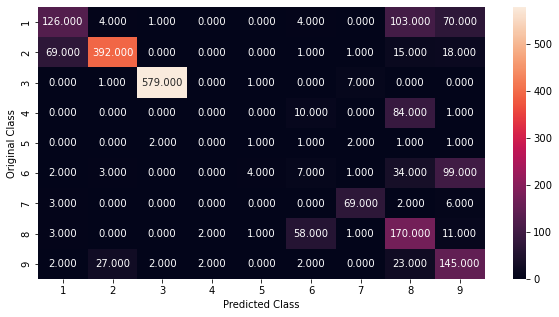

-------------------------------------------------- Precision matrix --------------------------------------------------


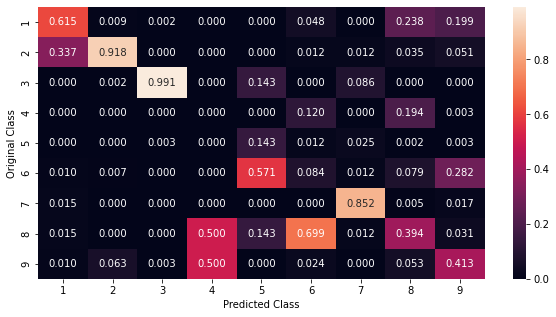

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


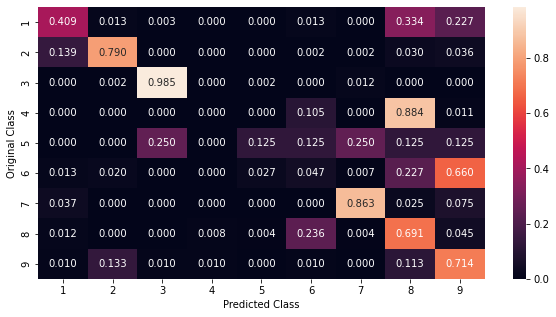

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
logisticRegressionRandom(k_value, oX_train, oy_train,  oX_cv, oy_cv, X_test, y_test)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'C': 0.1, 'penalty': 'l2'}
log loss for train data 1.5323262668894062
log loss for Cross Validation data 1.539746860711845
log loss for test data 1.355108930294171
Number of misclassified points  31.186752529898804
Accuracy = 0.6881324747010119
Precision = [0.59808612 0.93349169 0.99143836 0.         0.16666667 0.09333333
 0.85897436 0.38738739 0.4305949 ]
Recall = [0.40584416 0.79233871 0.98469388 0.         0.125      0.04666667
 0.8375     0.69918699 0.74876847]
F1 = [0.48355899 0.85714286 0.98805461 0.         0.14285714 0.06222222
 0.84810127 0.49855072 0.54676259]
-------------------------------------------------- Confusion matrix --------------------------------------------------


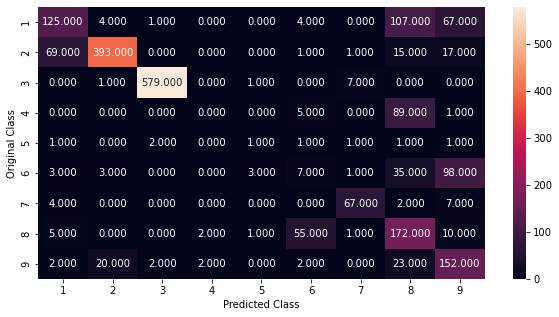

-------------------------------------------------- Precision matrix --------------------------------------------------


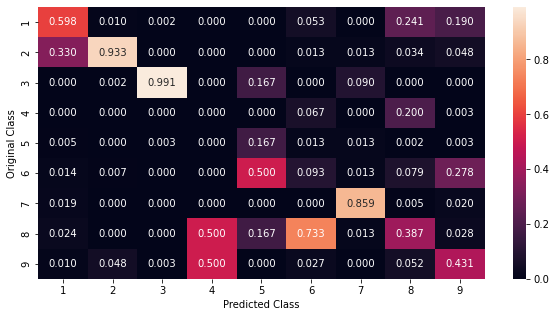

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


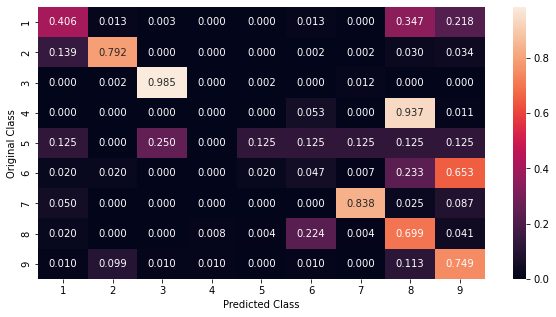

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
logisticRegressionGrid(k_value, oX_train, oy_train,  oX_cv, oy_cv, X_test, y_test)

#### 3.1.5 Logistic Regression Grid Search (Original Data)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'C': 10, 'penalty': 'l2'}
log loss for train data 1.1689760694994265
log loss for Cross Validation data 1.167103464516033
log loss for test data 1.158800196543074
Number of misclassified points  37.4885004599816
Accuracy = 0.625114995400184
Precision = [0.32451923 0.74590164 0.88653555 0.         0.         0.
 0.         0.         0.71641791]
Recall = [0.87662338 0.91733871 0.99659864 0.         0.         0.
 0.         0.         0.2364532 ]
F1 = [0.47368421 0.82278481 0.93835068 0.         0.         0.
 0.         0.         0.35555556]
-------------------------------------------------- Confusion matrix --------------------------------------------------


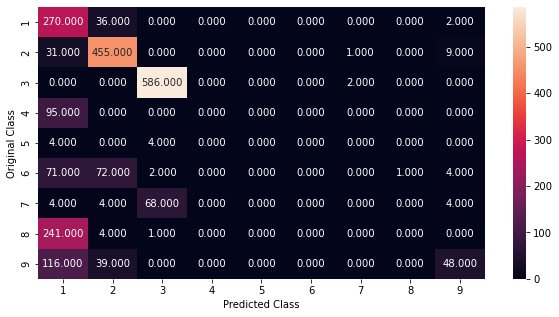

-------------------------------------------------- Precision matrix --------------------------------------------------


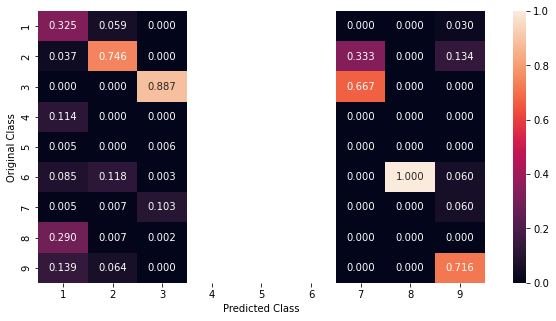

Sum of columns in precision matrix [ 1.  1.  1. nan nan nan  1.  1.  1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


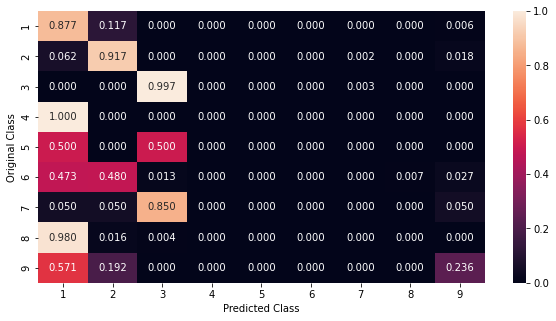

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
logisticRegressionGrid(k_value, X_train, y_train,  X_cv, y_cv, X_test, y_test)

#### 3.1.6 Logistic Regression Grid Search (Oversampled Data)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'C': 0.1, 'penalty': 'l2'}
log loss for train data 1.5323262668894062
log loss for Cross Validation data 1.539746860711845
log loss for test data 1.355108930294171
Number of misclassified points  31.186752529898804
Accuracy = 0.6881324747010119
Precision = [0.59808612 0.93349169 0.99143836 0.         0.16666667 0.09333333
 0.85897436 0.38738739 0.4305949 ]
Recall = [0.40584416 0.79233871 0.98469388 0.         0.125      0.04666667
 0.8375     0.69918699 0.74876847]
F1 = [0.48355899 0.85714286 0.98805461 0.         0.14285714 0.06222222
 0.84810127 0.49855072 0.54676259]
-------------------------------------------------- Confusion matrix --------------------------------------------------


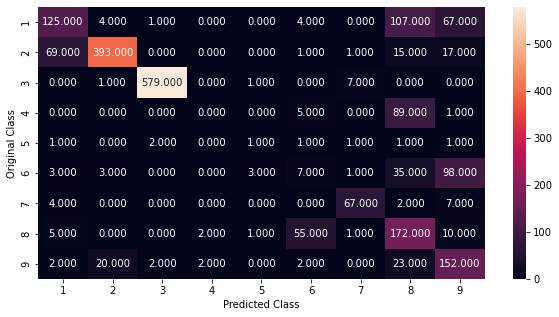

-------------------------------------------------- Precision matrix --------------------------------------------------


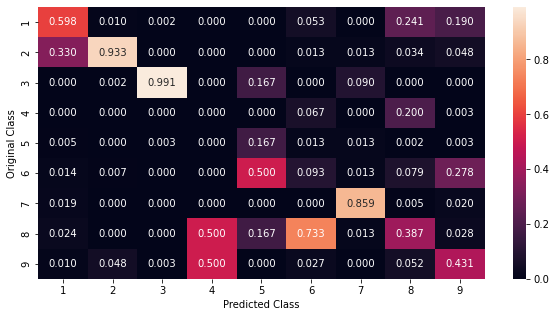

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


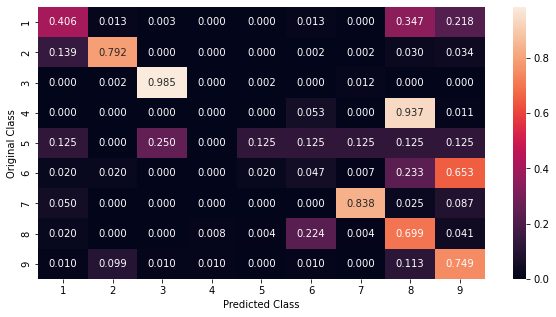

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
logisticRegressionGrid(k_value, oX_train, oy_train,  oX_cv, oy_cv, X_test, y_test)

### 3.2: Random Forest Classifier

In [ ]:
k_value = 5
estimators = [10,50,100,500,1000,2000,3000]

#### 3.2.1: K fold(Original Data)

5-fold Cross Validation Log losses
n_estimator= 10 , mean loss: 0.053099907985172515 , model losses: [0.05491166668984178, 0.04849255916544332, 0.04741985199748054, 0.059500698624553795, 0.05517476344854315]
n_estimator= 50 , mean loss: 0.052280906512019484 , model losses: [0.053471861282457046, 0.04462585323657122, 0.05840627301747357, 0.04722773942428199, 0.05767280559931358]
n_estimator= 100 , mean loss: 0.05132483762053969 , model losses: [0.05280544479924584, 0.046435426331059834, 0.0509759208626436, 0.050053880320943905, 0.05635351578880524]
n_estimator= 500 , mean loss: 0.04879930920264905 , model losses: [0.04552550214406672, 0.054133339231475106, 0.0604770615957439, 0.035351775143859905, 0.048508867898099634]
n_estimator= 1000 , mean loss: 0.04714474181536864 , model losses: [0.05239629201184456, 0.04243828219486561, 0.039964837057934785, 0.044395174899595415, 0.05652912291260284]
n_estimator= 2000 , mean loss: 0.049047651316649565 , model losses: [0.05712728510446765, 0.04296

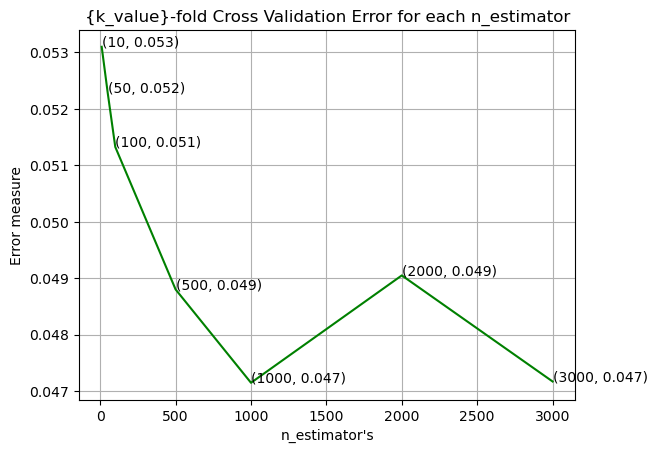

In [ ]:
best_est = randomForestKfold(k_value, estimators, X_train, y_train)

log loss for train data 0.01652499186566161
log loss for Cross Validation data 0.042220831345147404
log loss for test data 0.0449069527557033
Number of misclassified points  1.011959521619135
Accuracy = 0.9898804047838087
Precision = [0.96238245 1.         0.99661017 0.97938144 1.         0.99328859
 1.         0.97942387 1.        ]
Recall = [0.99675325 1.         1.         1.         0.625      0.98666667
 0.95       0.96747967 0.98029557]
F1 = [0.97926635 1.         0.99830221 0.98958333 0.76923077 0.98996656
 0.97435897 0.97341513 0.99004975]
-------------------------------------------------- Confusion matrix --------------------------------------------------


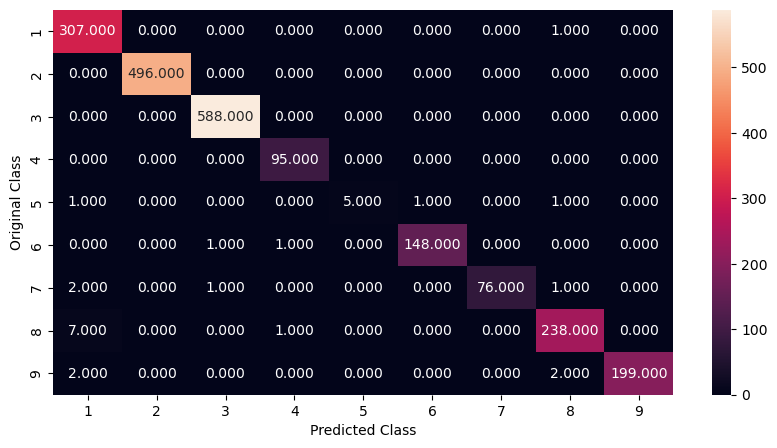

-------------------------------------------------- Precision matrix --------------------------------------------------


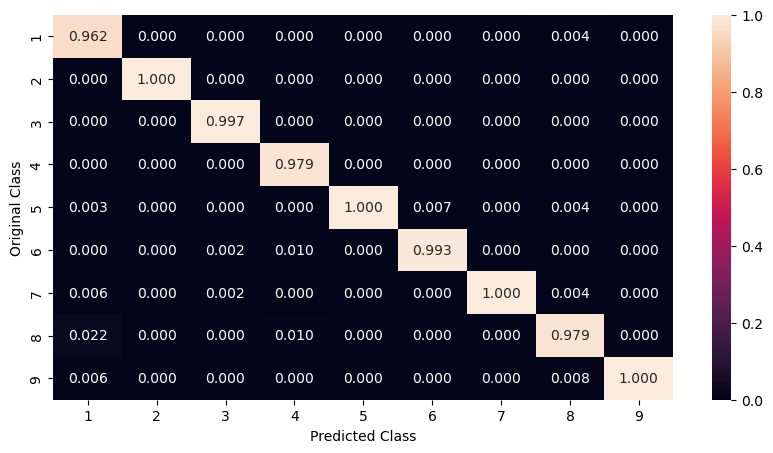

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


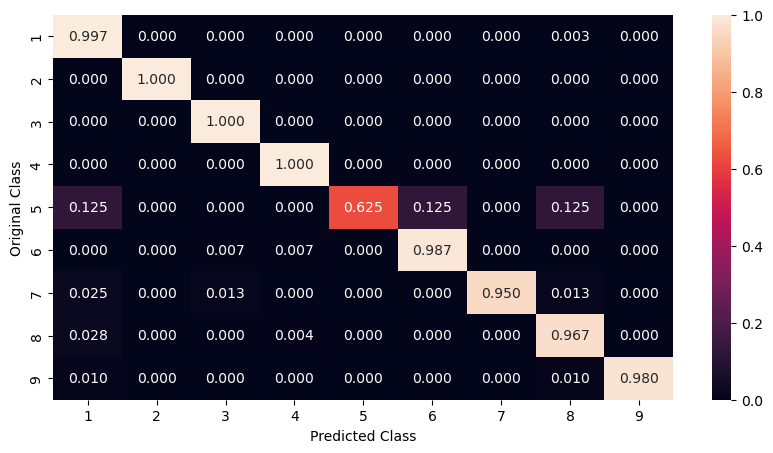

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
Wall time: 1min 7s


In [ ]:
%%time

rf = RandomForestClassifier(n_estimators=estimators[best_est], n_jobs=-1, bootstrap=True)
rf.fit(X_train, y_train)

finalResults(rf, k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.2: K fold (Oversampled Data)

5-fold Cross Validation Log losses
n_estimator= 10 , mean loss: 0.028788907863308878 , model losses: [0.02226936564083711, 0.040576747049122855, 0.02486523151952843, 0.02653537726763049, 0.02969781783942551]
n_estimator= 50 , mean loss: 0.025665949664397485 , model losses: [0.023092978601617603, 0.025850227195547148, 0.028733594559049662, 0.01955910423965019, 0.031093843726122828]
n_estimator= 100 , mean loss: 0.02515653652748191 , model losses: [0.0180757950676305, 0.026890556152653733, 0.024864006521060862, 0.02312753972670613, 0.032824785169358314]
n_estimator= 500 , mean loss: 0.024098498994962903 , model losses: [0.024353777752411022, 0.02482400997387752, 0.022637274421133915, 0.026478146200943128, 0.022199286626448912]
n_estimator= 1000 , mean loss: 0.024587201350445946 , model losses: [0.022450798054586503, 0.024182330759048916, 0.025765098211206088, 0.02939471879222105, 0.021143060935167175]
n_estimator= 2000 , mean loss: 0.02429648372062058 , model losses: [0.02516482516666080

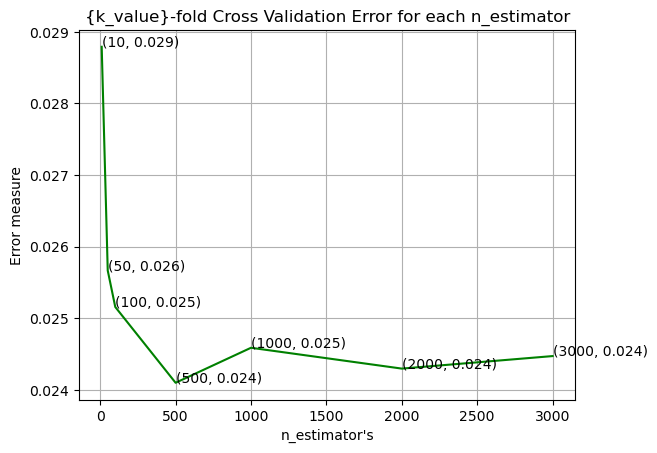

In [ ]:
best_est = randomForestKfold(k_value, estimators, oX_train, oy_train)

In [ ]:
rf = RandomForestClassifier(n_estimators=estimators[best_est], n_jobs=-1, bootstrap=True)
rf.fit(oX_train, oy_train)

RandomForestClassifier(n_estimators=500, n_jobs=-1)

log loss for train data 0.0075483001772556615
log loss for Cross Validation data 0.02178090473368323
log loss for test data 0.02105533075357203
Number of misclassified points  0.4531722054380665
Accuracy = 0.9954682779456193
Precision = [0.98648649 1.         1.         0.99830508 1.         0.99489796
 0.99829932 0.98141892 1.        ]
Recall = [0.99319728 1.         0.99659864 1.         1.         0.99320883
 0.99829932 0.98809524 0.98981324]
F1 = [0.98983051 1.         0.99829642 0.99915182 1.         0.99405268
 0.99829932 0.98474576 0.99488055]
-------------------------------------------------- Confusion matrix --------------------------------------------------


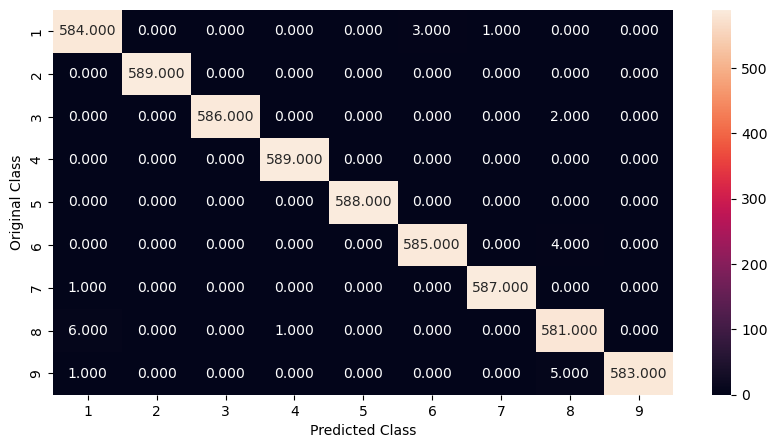

-------------------------------------------------- Precision matrix --------------------------------------------------


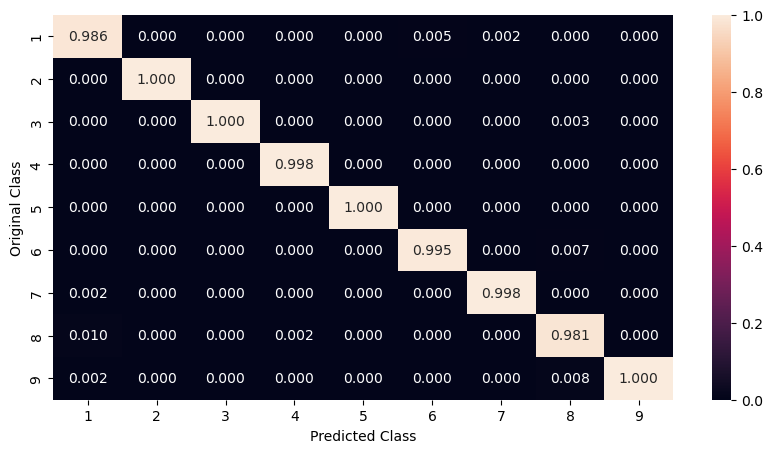

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


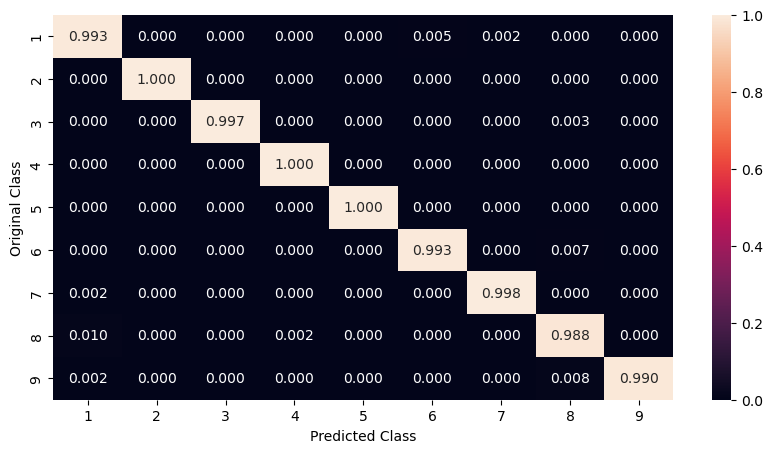

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
finalResults(rf, k_value, oX_train, oy_train,oX_cv, oy_cv, oX_test, oy_test)

log loss for train data 0.007621738017522978
log loss for Cross Validation data 0.021969274242013066
log loss for test data 0.015165809828395327
Number of misclassified points  0.22999080036798528
Accuracy = 0.9977000919963201
Precision = [0.99675325 1.         1.         1.         1.         0.99337748
 1.         0.98795181 1.        ]
Recall = [0.99675325 1.         0.99659864 1.         1.         1.
 1.         1.         0.99014778]
F1 = [0.99675325 1.         0.99829642 1.         1.         0.99667774
 1.         0.99393939 0.9950495 ]
-------------------------------------------------- Confusion matrix --------------------------------------------------


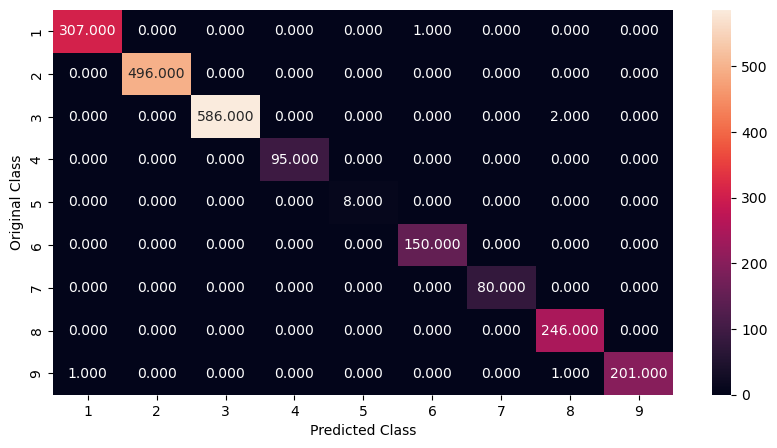

-------------------------------------------------- Precision matrix --------------------------------------------------


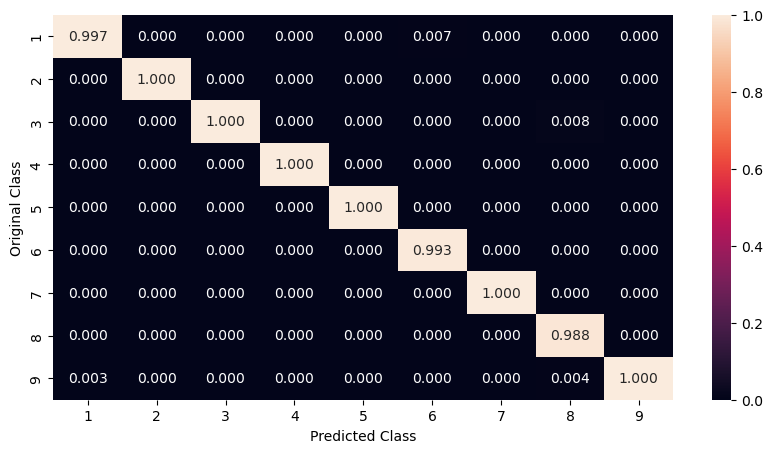

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


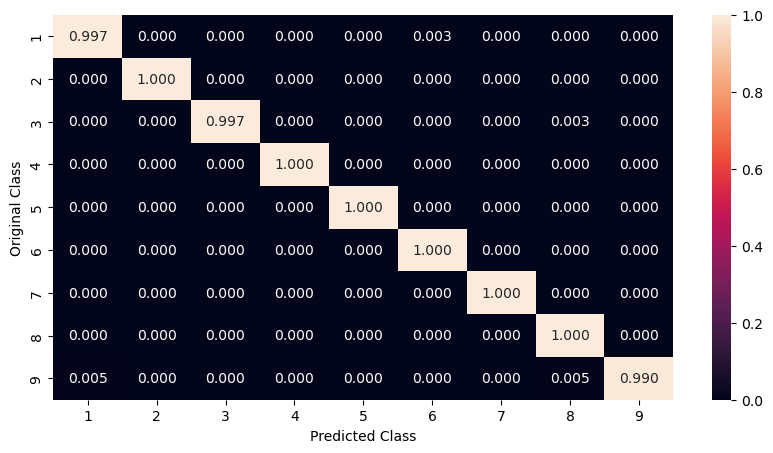

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
finalResults(rf, k_value, oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

#### 3.2.3: Random Search CV(Original Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 50, 'max_depth': 10, 'criterion': 'log_loss'}

log loss for train data 0.017287268273200457
log loss for Cross Validation data 0.03579737252446772
log loss for test data 0.04136844078942589
Number of misclassified points  0.8739650413983441
Accuracy = 0.9912603495860166
Precision = [0.98381877 1.         1.         0.95       1.         0.98657718
 1.         0.9755102  0.99507389]
Recall = [0.98701299 0.99395161 1.         1.         0.875      0.98
 1.         0.97154472 0.99507389]
F1 = [0.98541329 0.99696663 1.         0.97435897 0.93333333 0.98327759
 1.         0.97352342 0.99507389]
-------------------------------------------------- Confusion matrix --------------------------------------------------


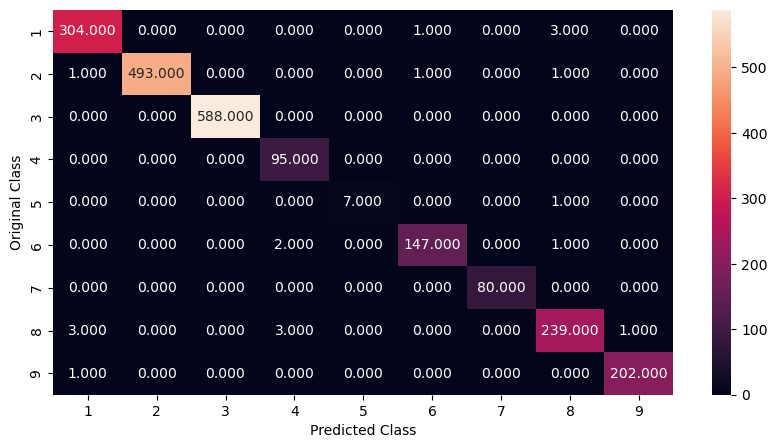

-------------------------------------------------- Precision matrix --------------------------------------------------


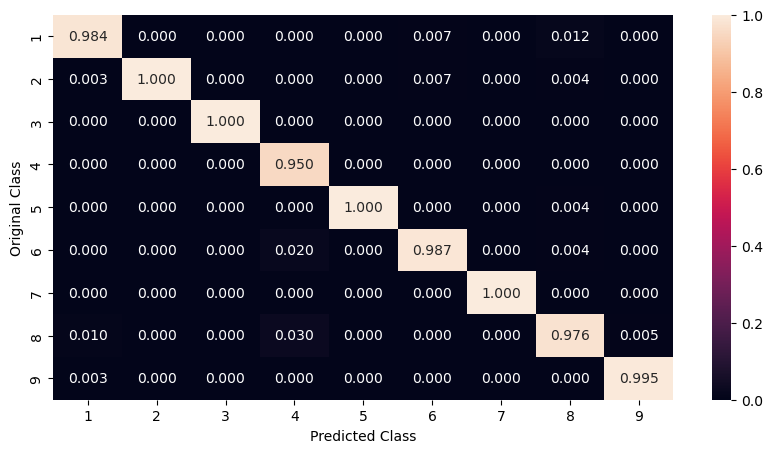

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


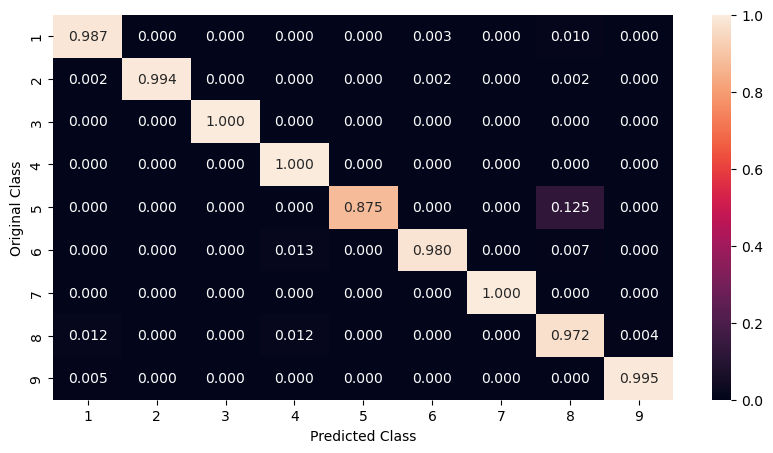

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
randomForestRandomCV(k_value, X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.4: Random Search CV(Oversampled Data)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 1000, 'max_depth': 10, 'criterion': 'entropy'}

log loss for train data 0.00824006109145569
log loss for Cross Validation data 0.02110141379988403
log loss for test data 0.019922853337730594
Number of misclassified points  0.35876132930513593
Accuracy = 0.9964123867069486
Precision = [0.98815567 1.         1.         0.99829932 1.         0.99324324
 1.         0.98811545 1.        ]
Recall = [0.99151104 1.         1.         0.99660441 1.         0.99830221
 0.99829932 0.98979592 0.99319728]
F1 = [0.98983051 1.         1.         0.99745115 1.         0.9957663
 0.99914894 0.98895497 0.99658703]
-------------------------------------------------- Confusion matrix --------------------------------------------------


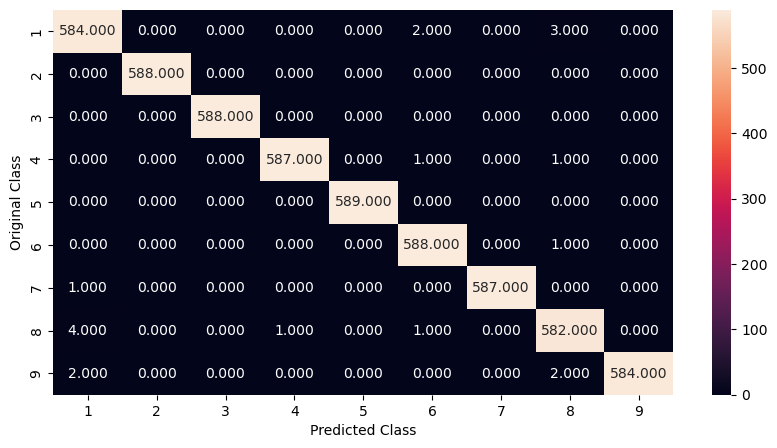

-------------------------------------------------- Precision matrix --------------------------------------------------


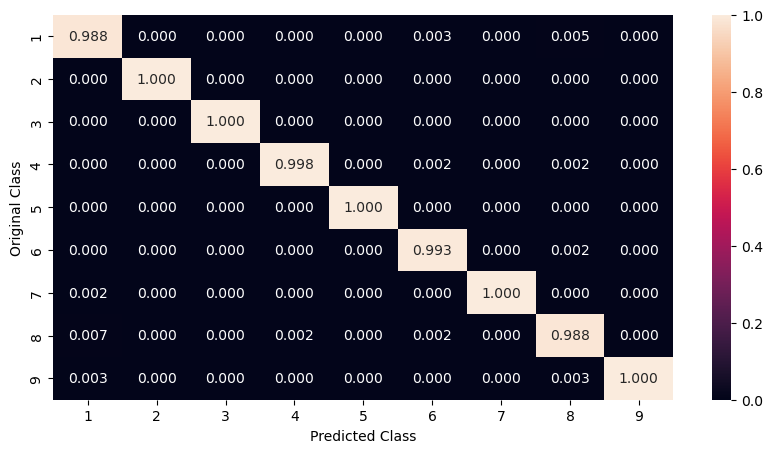

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


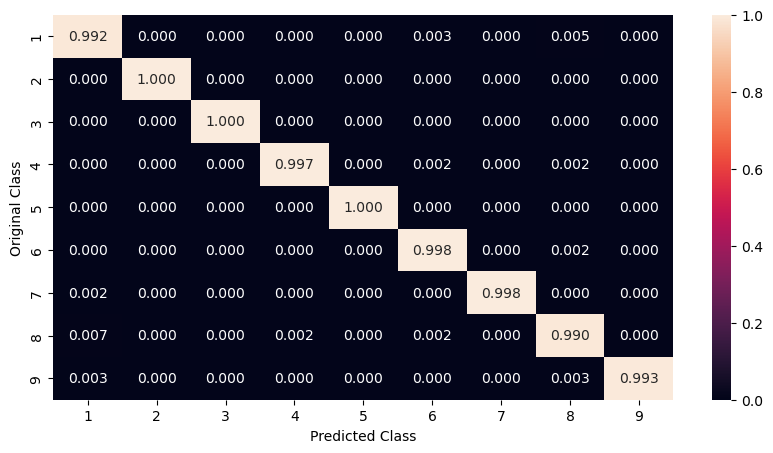

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
randomForestRandomCV(k_value,  oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 1000, 'max_depth': 10, 'criterion': 'entropy'}

log loss for train data 0.008278434709355144
log loss for Cross Validation data 0.02129995032566716
log loss for test data 0.02437729013867818
Number of misclassified points  0.36798528058877644
Accuracy = 0.9963201471941122
Precision = [0.99673203 1.         1.         0.96938776 1.         0.98684211
 1.         0.99180328 1.        ]
Recall = [0.99025974 1.         1.         1.         1.         1.
 1.         0.98373984 0.99507389]
F1 = [0.99348534 1.         1.         0.98445596 1.         0.99337748
 1.         0.9877551  0.99753086]
-------------------------------------------------- Confusion matrix --------------------------------------------------


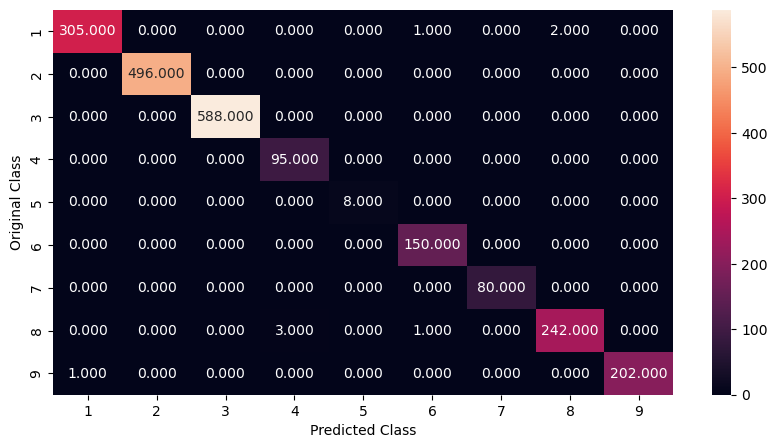

-------------------------------------------------- Precision matrix --------------------------------------------------


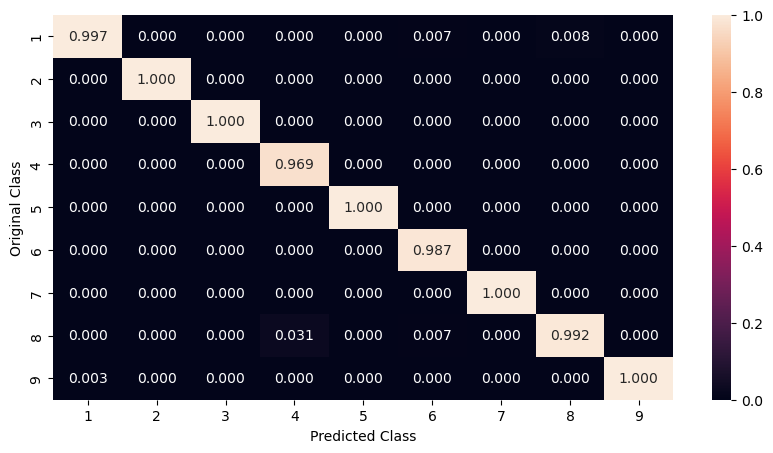

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


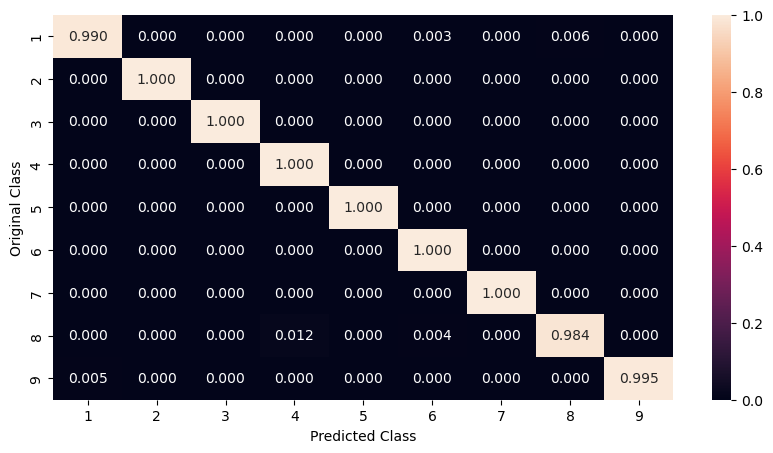

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
randomForestRandomCV(k_value,  oX_train, oy_train, oX_cv, oy_cv, X_test, y_test)

#### 3.2.5: Grid Search CV(Original Data)

Fitting 5 folds for each of 63 candidates, totalling 315 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': 10, 'n_estimators': 1000}

log loss for train data 0.01678151389978175
log loss for Cross Validation data 0.04801175486703843
log loss for test data 0.04262638886435713
Number of misclassified points  0.9199632014719411
Accuracy = 0.9908003679852806
Precision = [0.98076923 0.99798387 1.         0.95       1.         0.99315068
 1.         0.97177419 1.        ]
Recall = [0.99350649 0.99798387 1.         1.         0.875      0.96666667
 0.975      0.9796748  0.98029557]
F1 = [0.98709677 0.99798387 1.         0.97435897 0.93333333 0.97972973
 0.98734177 0.9757085  0.99004975]
-------------------------------------------------- Confusion matrix --------------------------------------------------


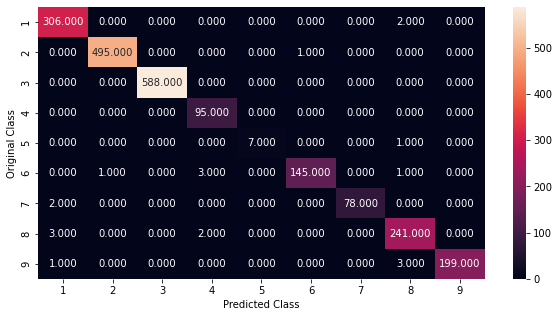

-------------------------------------------------- Precision matrix --------------------------------------------------


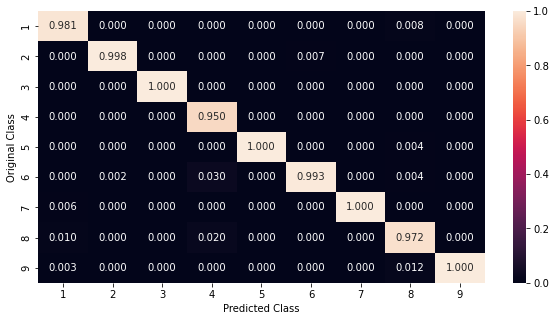

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


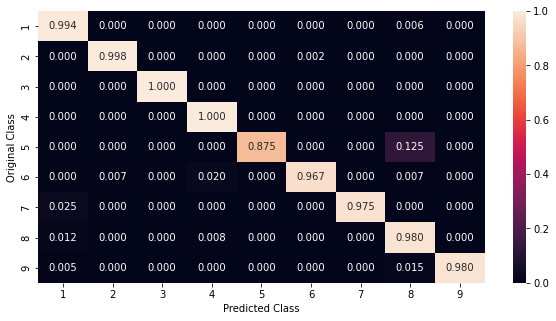

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
randomForestGridCV(k_value,  X_train, y_train, X_cv, y_cv, X_test, y_test)

#### 3.2.6: Grid Search CV(Oversampled Data)

Fitting 5 folds for each of 63 candidates, totalling 315 fits
Best Parameters: {'criterion': 'log_loss', 'max_depth': 10, 'n_estimators': 100}

log loss for train data 0.008825973110805132
log loss for Cross Validation data 0.024145637524172456
log loss for test data 0.021897334634399697
Number of misclassified points  0.5098187311178248
Accuracy = 0.9949018126888217
Precision = [0.97829716 1.         0.99830221 0.99323181 0.99830221 0.99659284
 1.         0.98967298 1.        ]
Recall = [0.99659864 1.         1.         0.99829932 1.         0.99320883
 0.99830221 0.9762309  0.99151104]
F1 = [0.9873631  1.         0.99915038 0.99575912 0.99915038 0.99489796
 0.99915038 0.98290598 0.99573743]
-------------------------------------------------- Confusion matrix --------------------------------------------------


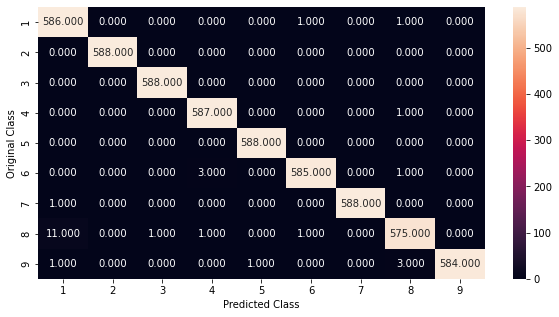

-------------------------------------------------- Precision matrix --------------------------------------------------


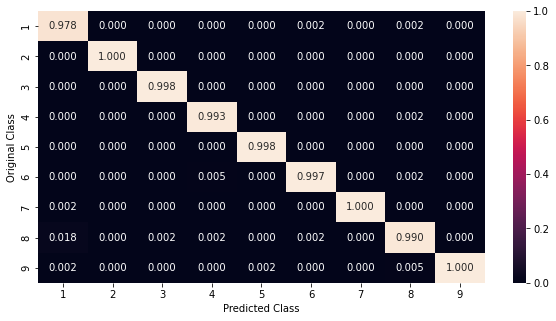

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


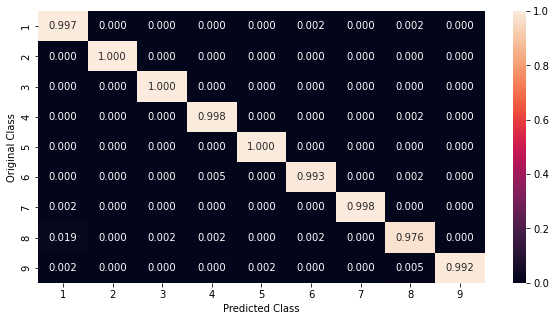

Sum of rows in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
randomForestGridCV(k_value,  oX_train, oy_train, oX_cv, oy_cv, oX_test, oy_test)

### 3.3: SVM Classifier

In [ ]:
params={
    'C':[10 ** x for x in range(-4, 6)],
    'gamma' : [0.01,1],
    'degree' : [1,3,5,7],
    'kernel' : ["linear","poly","rbf","sigmoid"]
}

cv_value = 5

#### 3.2.1: K fold(Original Data)

In [ ]:
best_c = svmKfold(k_value, c_values, X_train, y_train)

In [ ]:
svm = SVC(C=c_values[best_c], class_weight='balanced')
svm.fit(X_train,y_train)
finalResults(svm, k_value, X_train, y_train, X_test, y_test)

#### 3.2.2: K fold (Oversampled Data)

In [ ]:
best_c = svmKfold(k_value, c_values, oX_train, oy_train)

In [ ]:
svm = SVC(C=c_values[best_c], class_weight='balanced')
svm.fit(oX_train,oy_train)

In [ ]:
finalResults(svm, k_value, oX_train, oy_train, oX_test, oy_test)

In [ ]:
finalResults(svm, k_value, oX_train, oy_train, X_test, y_test)

#### 3.2.3: Random Search CV(Original Data)

In [ ]:
svmRandomCV(k_value, X_train, y_train, X_test, y_test)

#### 3.2.4: Random Search CV(Oversampled Data)

In [ ]:
svmRandomCV(k_value, oX_train, oy_train, oX_test, oy_test)

In [ ]:
svmRandomCV(k_value, oX_train, oy_train, X_test, y_test)
